In [1]:
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import pandas as pd
import glob
import datetime as dt
import gzip
import cdsapi
import tarfile
import h5netcdf
from numpy import random
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter
from scipy import stats
from matplotlib.gridspec import GridSpec

In [2]:
# Define a function to calculate the gradient of a 2D field over a sphere, given the coordinates in degrees on 
# the same 2D grid. The derivatives are taken as second-order differences in the interior, and first-order 
# (forward or backward) on the edges.

def grad_sphere(field, llon, llat):
    R = 6371.0e3 # Earth radius in km.
    
    field = np.double(field)
    llon = np.double(llon)
    llat = np.double(llat)
    
    costheta = np.cos(llat*np.pi/180)
    
    df_dx = field-field
    df_dx[:,1:-1] = (field[:,2:]-field[:,:-2])/(R*costheta[:,1:-1]*(llon[:,2:]-llon[:,:-2])*np.pi/180)
    df_dx[:,0] = (field[:,1]-field[:,0])/(R*costheta[:,0]*(llon[:,1]-llon[:,0])*np.pi/180)
    df_dx[:,-1] = (field[:,-1]-field[:,-2])/(R*costheta[:,-1]*(llon[:,-1]-llon[:,-2])*np.pi/180)
    
    df_dy = field-field
    df_dy[1:-1,:] = (field[2:,:]-field[:-2,:])/(R*(llat[2:,:]-llat[:-2,:])*np.pi/180)
    df_dy[0,:] = (field[1,:]-field[0,:])/(R*(llat[1,:]-llat[0,:])*np.pi/180)
    df_dy[-1,:] = (field[-1,:]-field[-2,:])/(R*(llat[-1,:]-llat[-2,:])*np.pi/180)
    
    return df_dx, df_dy

def div_sphere(field_a, field_b, llon, llat):
    R = 6371.0e3 # Earth radius in km.
    
    field_a = np.double(field_a)
    field_b = np.double(field_b)
    llon = np.double(llon)
    llat = np.double(llat)
    
    costheta = np.cos(llat*np.pi/180)

    div_a = field_a-field_a
    div_a[:,1:-1] = (field_a[:,2:]-field_a[:,:-2])/(R*costheta[:,1:-1]*(llon[:,2:]-llon[:,:-2])*np.pi/180)
    div_a[:,0] = (field_a[:,1]-field_a[:,0])/(R*costheta[:,0]*(llon[:,1]-llon[:,0])*np.pi/180)
    div_a[:,-1] = (field_a[:,-1]-field_a[:,-2])/(R*costheta[:,-1]*(llon[:,-1]-llon[:,-2])*np.pi/180)
    
    div_b = field_b-field_b
    div_b[1:-1,:] = (field_b[2:,:]*costheta[2:,:]-field_b[:-2,:]*costheta[:-2,:])/(R*costheta[1:-1,:]*(llat[2:,:]-llat[:-2,:])*np.pi/180)
    div_b[0,:] = (field_b[1,:]*costheta[1,:]-field_b[0,:]*costheta[0,:])/(R*costheta[0,:]*(llat[1,:]-llat[0,:])*np.pi/180)
    div_b[-1,:] = (field_b[-1,:]*costheta[-1,:]-field_b[-2,:]*costheta[-2,:])/(R*costheta[-1,:]*(llat[-1,:]-llat[-2,:])*np.pi/180)
        
    div = div_a + div_b
    return div
    
def stretched_div_sphere(field_a, field_b, llon, llat, u_field, v_field):
    R = 6371.0e3 # Earth radius in km.

    field_a = np.double(field_a)
    field_b = np.double(field_b)
    llon = np.double(llon)
    llat = np.double(llat)
    u_field = np.double(u_field)
    v_field = np.double(v_field)
    
    costheta = np.cos(llat*np.pi/180)

    div_a = field_a-field_a
    div_a[:,1:-1] = (field_a[:,2:]-field_a[:,:-2])/(R*costheta[:,1:-1]*(llon[:,2:]-llon[:,:-2])*np.pi/180)
    div_a[:,0] = (field_a[:,1]-field_a[:,0])/(R*costheta[:,0]*(llon[:,1]-llon[:,0])*np.pi/180)
    div_a[:,-1] = (field_a[:,-1]-field_a[:,-2])/(R*costheta[:,-1]*(llon[:,-1]-llon[:,-2])*np.pi/180)
    
    div_b = field_b-field_b
    div_b[1:-1,:] = (field_b[2:,:]*costheta[2:,:]-field_b[:-2,:]*costheta[:-2,:])/(R*costheta[1:-1,:]*(llat[2:,:]-llat[:-2,:])*np.pi/180)
    div_b[0,:] = (field_b[1,:]*costheta[1,:]-field_b[0,:]*costheta[0,:])/(R*costheta[0,:]*(llat[1,:]-llat[0,:])*np.pi/180)
    div_b[-1,:] = (field_b[-1,:]*costheta[-1,:]-field_b[-2,:]*costheta[-2,:])/(R*costheta[-1,:]*(llat[-1,:]-llat[-2,:])*np.pi/180)
        
    div = np.abs(u_field)*div_a + np.abs(v_field)*div_b
    return div

In [3]:
# Define a function to smooth the field ignoring the NaNs.
# I follow the first answer here 
# https://stackoverflow.com/questions/18697532/gaussian-filtering-a-image-with-nan-in-python
# By default, the filter is truncated at 4 sigmas.

def nan_gaussian_filter(field,sigma):
    
    from scipy.ndimage import gaussian_filter
    
    field = np.double(field)
    
    # Take the original field and replace the NaNs with zeros.
    field0 = field.copy()
    field0[np.isnan(field)] = 0
    ff = gaussian_filter(field0, sigma=sigma)
    
    # Create the smoothed weight field.
    weight = 0*field.copy()+1
    weight[np.isnan(field)] = 0
    ww = gaussian_filter(weight, sigma=sigma)
    
    zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
                        # was originally NaN.
    return zz

In [4]:
# Define a function to plot a histogram and return the correlation coefficient between the two fields
# after removing the NaNs.

def plot_a_histogram(x,y,x_string='',y_string='',controlname='',varname='',title=''):
    # Remove the NaNs.
    x, y = x[(~np.isnan(x))&(~np.isnan(y))], y[(~np.isnan(x))&(~np.isnan(y))]
    
    fig = plt.figure(figsize=(6., 5.))
    H, xedges, yedges = np.histogram2d(x, y, bins=50, density=True)

    X, Y = np.meshgrid(xedges, yedges)
    pc = plt.pcolormesh(X, Y, H.T,cmap='Blues')
    cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',
                    levels=np.arange(-100,100))
    plt.clabel(cn, fontsize=12)
    cbar = plt.colorbar(pc)
    cbar.ax.tick_params(labelsize=12) 
    cbar.set_label('PDF',size=14)
    plt.grid()

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.ticklabel_format(axis="both", style="sci", scilimits=(0,0))

    plt.xlabel(x_string,fontsize=14)
    plt.ylabel(y_string,fontsize=14)

    rho = np.corrcoef([x,y])
    sr,pval_sr = stats.spearmanr(x,y)
    tau,pval_tau = stats.kendalltau(x,y)
    
#    res = stats.theilslopes(y[(~np.isnan(x))&(~np.isnan(y))], x[(~np.isnan(x))&(~np.isnan(y))], 0.95)
    lsq_res = stats.linregress(x, y)

#    plt.plot(x[(~np.isnan(x))&(~np.isnan(y))], res[1] + res[0] * x[(~np.isnan(x))&(~np.isnan(y))], 'y-')
#    plt.plot(x[(~np.isnan(x))&(~np.isnan(y))], res[1] + res[2] * x[(~np.isnan(x))&(~np.isnan(y))], 'y:')
#    plt.plot(x[(~np.isnan(x))&(~np.isnan(y))], res[1] + res[3] * x[(~np.isnan(x))&(~np.isnan(y))], 'y:')
    plt.plot(x, lsq_res[1] + lsq_res[0] * x, 'g-')
    
    str_title = title + '\n rho = '+ str(np.round(rho[0,1]*1000)/1000) + '\n sr = ' + str(np.round(sr*1000)/1000)+ ' pval_sr = ' + str(np.round(pval_sr*1000)/1000) + '\n tau = ' + str(np.round(tau*1000)/1000) + ' pval_tau = ' + str(np.round(pval_tau*1000)/1000)
    plt.title(str_title, fontsize=16)    

    figure_name = '2d_distr_' + varname + '_vs_' + controlname + '_' + title + '_' + experiment + '.png'
    plt.savefig(figure_name,bbox_inches='tight')
    plt.show()

    # This is to check whether there are outliers.
    #plt.figure
    #plt.scatter(x[(~np.isnan(x))&(~np.isnan(y))], y[(~np.isnan(x))&(~np.isnan(y))])
    
    return rho[0,1]

In [7]:
# Function to plot a percentile distribution and to calculate the erd and erd_a metrics.
# The figure is optimized to be used with perc_step = 5, but it can be any dividend of 100.

def percentile_distribution(control, variable, str_control='', str_variable='', perc_step=5, title=''):
    mean = np.nanmean(variable)
    mean_control = np.nanmean(control)
    std = np.nanstd(variable)
    std_control = np.nanstd(control)

    distribution = np.zeros(int(100/perc_step))
    std_distribution = np.zeros(int(100/perc_step))
    std_err_distribution = np.zeros(int(100/perc_step))
    distribution_control = np.zeros(int(100/perc_step))
    negative = np.zeros(int(100/perc_step), dtype=bool)
    number_of_points = np.zeros(int(100/perc_step))
    percentiles = np.zeros(int(100/perc_step)+1)

    for pp in range(0,100,perc_step):
        qq = int(pp/perc_step)
        lower = np.percentile(control[~np.isnan(control)],pp)
        upper = np.percentile(control[~np.isnan(control)],pp+perc_step)
        percentiles[qq] = lower
        cond_mean = np.nanmean(variable[(control>=lower)&(control<upper)])
        cond_std = np.nanstd(variable[(control>=lower)&(control<upper)])
        cond_mean_control = np.nanmean(control[(control>=lower)&(control<upper)])
        distribution[qq] = cond_mean-mean
        std_distribution[qq] = cond_std
        distribution_control[qq] = cond_mean_control-mean_control
        number_of_points[qq] = np.sum(~np.isnan(variable[(control>=lower)&(control<upper)]))
        std_err_distribution[qq] = std_distribution[qq]/np.sqrt(number_of_points[qq])
        if cond_mean<0:
            negative[qq] = 1
    percentiles[-1] = upper

    #print(number_of_points)
    fig = plt.figure(figsize=(6., 7.))

    perc = np.arange(perc_step/2,100,perc_step)
    #plt.bar(perc,distribution,width=4,color='firebrick')
    #plt.errorbar(perc,distribution,std_distribution,fmt='o',color='firebrick')
    plt.errorbar(perc,distribution,std_err_distribution,fmt='o',color='firebrick')
    #plt.bar(perc[negative],distribution[negative],width=4,color='royalblue') # Blue the variable is negative
    #plt.errorbar(perc[negative],distribution[negative],std_distribution[negative],fmt='o',color='royalblue') # Blue the variable is negative
    plt.errorbar(perc[negative],distribution[negative],std_err_distribution[negative],fmt='o',color='royalblue') # Blue the variable is negative
    plt.legend(['Positive variable','Negative variable'], fontsize=12,loc='upper left')
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.ylabel(str_variable + ' anomaly', fontsize=14)
    plt.xlabel(str_control + ' percentiles', fontsize=14)
    #plt.ylim([-2.7,1.7])
    plt.grid()
    
    if perc_step==5:
        distance_percentiles = 4.159412855886994 # Using the first 5th and the last 95th intervals for the means.
    elif perc_step==10:
        distance_percentiles = 3.532476444329294  
    else:
        distance_percentiles = 0.
        
    erd = (distribution[-1]-distribution[0])/(std*distance_percentiles)
    erd_a = (distribution[-1]-distribution[0])*std_control/(std*(distribution_control[-1]-distribution_control[0]))

    # Calculate the confidence interval by shuffling one of the two fields and then take the mu+-1.96*sigma
    #shuffled_mean, shuffled_std, sh_sr, sh_t_value = perc_distr_shuffle_stat(control.flatten(),variable.flatten(),1000,perc_step=perc_step)
    #plt.fill_between(perc,shuffled_mean-1.96*shuffled_std,shuffled_mean+1.96*shuffled_std,facecolor='black',alpha=0.5)
    # With 5000 repetitions the values are smoother but basically the same.
    #print('shuffled spearman r of the distr = ' + str(sh_sr))
    #print('t value shuffled spearman r of the distr = ' + str(sh_t_value))

    # Calculate the spearman r
    percentiles_center = 0.5*(percentiles[:-1]+percentiles[1:])
    sr_distr, trash = stats.spearmanr(perc,distribution)
    df = len(perc)-2 # degrees of freedom.
    t_value = np.abs(sr_distr)*np.sqrt((df)/(1-sr_distr**2))
    
    #p-value after comparison with the t 
    p_value = 1 - stats.t.cdf(t_value,df=df)

    # Linear regression
    lsq_res = stats.linregress(perc, distribution)
    plt.plot(perc, lsq_res[1] + lsq_res[0] * perc, 'g-')

    print('------------------------------------------------------')
    print('PERCENTILE DISTRIBUTION')
    print('spearman r of the distr = ' + str(sr_distr))
    print('t value spearman r of the distr = ' + str(t_value))
    print('p value spearman r of the distr = ' + str(p_value))
    
    float_formatter = "{:.2e}".format
    plt.annotate('y=' + str(float_formatter(lsq_res[1])) + ' + ' + str(float_formatter(lsq_res[0])) + '*x', xy=(0.1, 0.05), xycoords='axes fraction', fontsize=14)

    str_title = title + '\n erd = '+ str(np.round(erd*1000)/1000)+ ', erd_a = '+ str(np.round(erd_a*1000)/1000) + '\n sr_distr = '+ str(np.round(sr_distr*1000)/1000) +' with p_val = ' + str(np.round(p_value*1000)/1000)
    plt.title(str_title, fontsize=16)
    
    print('In the percentile bins there are ' + str(number_of_points) + ' points.')
    
    figure_name = 'perc_distr_' + varname + '_vs_' + controlname + '_perc_step_' + str(perc_step) + '_' + title + '_' + experiment + '.png'
    plt.savefig(figure_name,bbox_inches='tight')

    return erd, erd_a, sr_distr, t_value, p_value

# Useful link to revise the t-test 
# https://towardsdatascience.com/inferential-statistics-series-t-test-using-numpy-2718f8f9bf2f

In [8]:
# Function to plot a fixed-bin distribution.
# The figure is optimized to be used with perc_step = 5, but it can be any dividend of 100.
# The function uses the parameter perc_step to set the number of bins. E.g. with perc_step=5 there are 20 bins.

def fixed_bin_distribution(control, variable, str_control='', str_variable='', perc_step=5, title=''):
    mean = np.nanmean(variable)
    mean_control = np.nanmean(control)
    std = np.nanstd(variable)
    std_control = np.nanstd(control)
    
    nbins = int(100/perc_step) # Number of bins.
    bw = (np.max(control[~np.isnan(control)])-np.min(control[~np.isnan(control)]))/nbins # Bin width.
    
    distribution = np.zeros(nbins)
    std_distribution = np.zeros(nbins)
    std_err_distribution = np.zeros(nbins)
    distribution_control = np.zeros(nbins)
    negative = np.zeros(nbins, dtype=bool)
    number_of_points = np.zeros(nbins)
    bin_edges = np.zeros(nbins+1)

    for pp in range(0,100,perc_step):
        qq = int(pp/perc_step) # Index starting from 0.
        lower = np.min(control[~np.isnan(control)])+qq*bw
        upper = lower + bw
        bin_edges[qq] = lower
        cond_mean = np.nanmean(variable[(control>=lower)&(control<upper)])
        cond_std = np.nanstd(variable[(control>=lower)&(control<upper)])
        cond_mean_control = np.nanmean(control[(control>=lower)&(control<upper)])
        distribution[qq] = cond_mean-mean
        std_distribution[qq] = cond_std
        distribution_control[qq] = cond_mean_control-mean_control
        number_of_points[qq] = np.sum(~np.isnan(variable[(control>=lower)&(control<upper)]))
        std_err_distribution[qq] = std_distribution[qq]/np.sqrt(number_of_points[qq])
        if cond_mean<0:
            negative[qq] = 1
    bin_edges[-1] = upper

    #print(number_of_points)
    fig = plt.figure(figsize=(6., 7.))
    
    bin_centers = 0.5*(bin_edges[1:]+bin_edges[:-1])
    #plt.bar(bin_centers,distribution,width=4,color='firebrick')
    #plt.errorbar(bin_centers,distribution,std_distribution,fmt='o',color='firebrick')
    plt.errorbar(bin_centers,distribution,std_err_distribution,fmt='o',color='firebrick')
    #plt.bar(bin_centers[negative],distribution[negative],width=4,color='royalblue') # Blue the variable is negative
    #plt.errorbar(bin_centers[negative],distribution[negative],std_distribution[negative],fmt='o',color='royalblue') # Blue the variable is negative
    plt.errorbar(bin_centers[negative],distribution[negative],std_err_distribution[negative],fmt='o',color='royalblue') # Blue the variable is negative
    plt.legend(['Positive variable','Negative variable'], fontsize=12,loc='upper left')
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.ylabel(str_variable + ' anomaly', fontsize=14)
    plt.xlabel(str_control, fontsize=14)
    #plt.ylim([-2.7,1.7])
    plt.grid()
    
    # Calculate the spearman r
    sr_distr, trash = stats.spearmanr(bin_centers,distribution)
    df = len(bin_centers)-2 # degrees of freedom.
    t_value = np.abs(sr_distr)*np.sqrt((df)/(1-sr_distr**2))
    
    #p-value after comparison with the t 
    p_value = 1 - stats.t.cdf(t_value,df=df)
   
    # Linear regression
    lsq_res = stats.linregress(bin_centers, distribution)
    plt.plot(bin_centers, lsq_res[1] + lsq_res[0] * bin_centers, 'g-')

    print('------------------------------------------------------')
    print('FIXED-BIN DISTRIBUTION')
    print('spearman r of the distr = ' + str(sr_distr))
    print('t value spearman r of the distr = ' + str(t_value))
    print('p value spearman r of the distr = ' + str(p_value))

    float_formatter = "{:.2e}".format
    plt.annotate('y=' + str(float_formatter(lsq_res[1])) + ' + ' + str(float_formatter(lsq_res[0])) + '*x', xy=(0.1, 0.05), xycoords='axes fraction', fontsize=14)

    str_title = title + '\n sr_distr = '+ str(np.round(sr_distr*1000)/1000) +' with p_val = ' + str(np.round(p_value*1000)/1000)
    plt.title(str_title, fontsize=16)
    
    print('In the bins there are ' + str(number_of_points) + ' points.')
    
    figure_name = 'fixed-bin_distr_' + varname + '_vs_' + controlname + '_perc_step_' + str(perc_step) + '_' + title + '_' + experiment + '.png'
    plt.savefig(figure_name,bbox_inches='tight')

    return sr_distr, t_value, p_value

# Useful link to revise the t-test 
# https://towardsdatascience.com/inferential-statistics-series-t-test-using-numpy-2718f8f9bf2f

In [9]:
# Set the geographical parameters for the figures.
minlon = 6.; maxlon = 13.; minlat = 41.; maxlat = 45.;
extent_param = [minlon, maxlon, minlat, maxlat]
crs = ccrs.PlateCarree()

def plot_background(ax):
    ax.set_extent(extent_param)
    #ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.5)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, alpha=0.5)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'fontsize': 14}
    gl.ylabel_style = {'fontsize': 14}
    return ax

In [53]:
path2CNTRL = '/mnt/storage_unimib/agostino/genoa2014/CNTRL_1D/' # Here the files are wrfout_d01*.
experiment = 'FS_CONST'; # '3CPLD', 'ANML_HALF', 'ANML_DOUBLE', 'FS_CONST', 'SM1_K', 'SM2_K', 'SM4_K', ... 'SM64_K'
path2EXP = '/mnt/storage_unimib/agostino/genoa2014/' + experiment + '/'
path2UNIF = '/mnt/storage_unimib/agostino/genoa2014/UNIF/' # Here the files are wrfout_d01*.

2014-10-06_00:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',
/home/agostino/miniconda3/envs/eureca/lib/python3.9/site-packages/numpy/lib/function_base.py:2642: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/agostino/miniconda3/envs/eureca/lib/python3.9/site-packages/numpy/lib/function_base.py:2643: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/home/agostino/miniconda3/envs/eureca/lib/python3.9/site-packages/scipy/stats/stats.py:4264: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


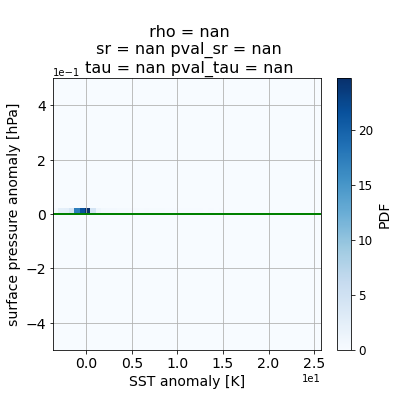

<ipython-input-7-8184677110f0>:60: RuntimeWarning: invalid value encountered in double_scalars
  erd = (distribution[-1]-distribution[0])/(std*distance_percentiles)
<ipython-input-7-8184677110f0>:61: RuntimeWarning: invalid value encountered in double_scalars
  erd_a = (distribution[-1]-distribution[0])*std_control/(std*(distribution_control[-1]-distribution_control[0]))
/home/agostino/miniconda3/envs/eureca/lib/python3.9/site-packages/scipy/stats/stats.py:4264: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = nan
t value spearman r of the distr = nan
p value spearman r of the distr = nan
In the percentile bins there are [2760. 2760. 2759. 2760. 2759. 2758. 2762. 2760. 2759. 2760. 2760. 2759.
 2760. 2760. 2758. 2761. 2760. 2759. 2760. 2759.] points.
2014-10-06_01:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


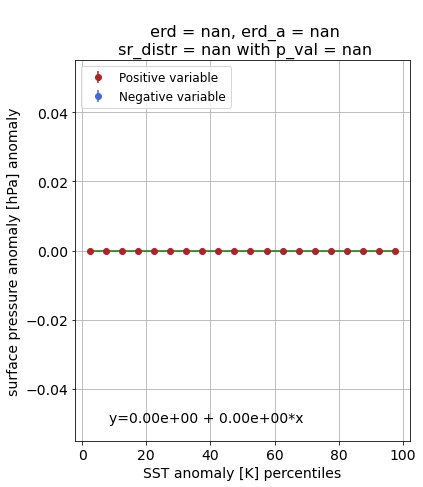

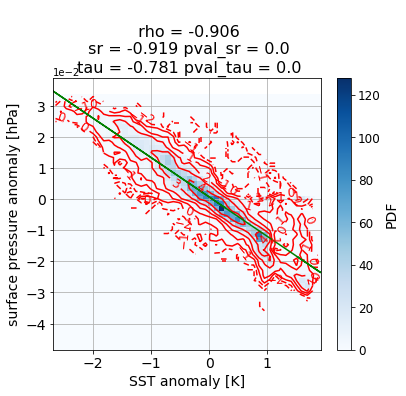

<ipython-input-7-8184677110f0>:74: RuntimeWarning: divide by zero encountered in double_scalars
  t_value = np.abs(sr_distr)*np.sqrt((df)/(1-sr_distr**2))


------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -1.0
t value spearman r of the distr = inf
p value spearman r of the distr = 0.0
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_02:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


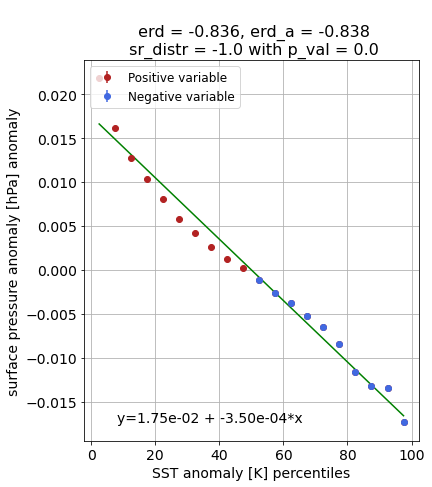

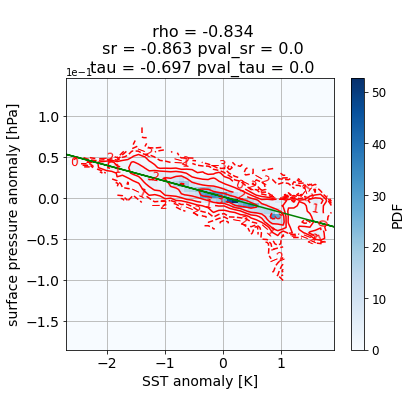

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.993984962406015
t value spearman r of the distr = 38.50666922314394
p value spearman r of the distr = 0.0
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_03:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


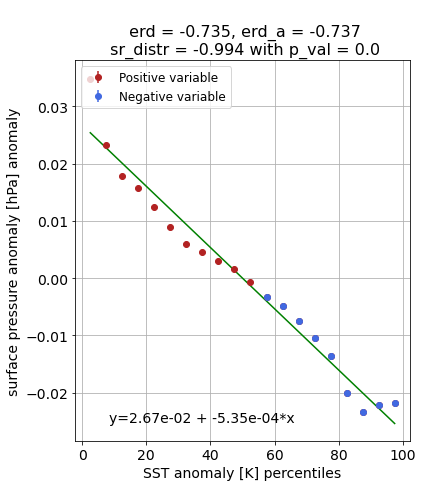

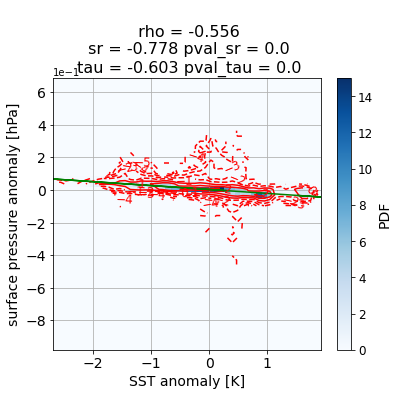

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9834586466165413
t value spearman r of the distr = 23.035373613673723
p value spearman r of the distr = 4.107825191113079e-15
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_04:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


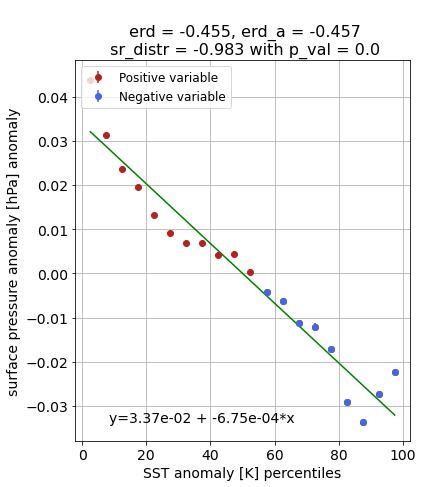

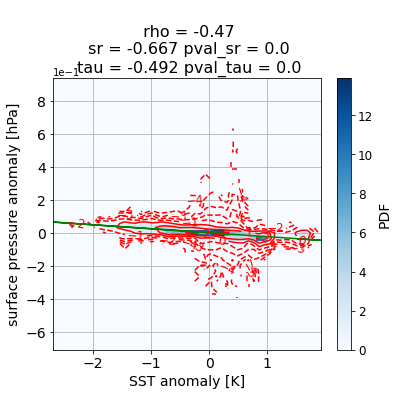

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9789473684210527
t value spearman r of the distr = 20.348166313956302
p value spearman r of the distr = 3.574918139293004e-14
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_05:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


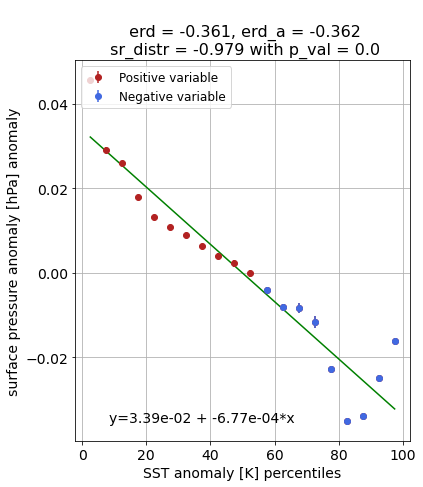

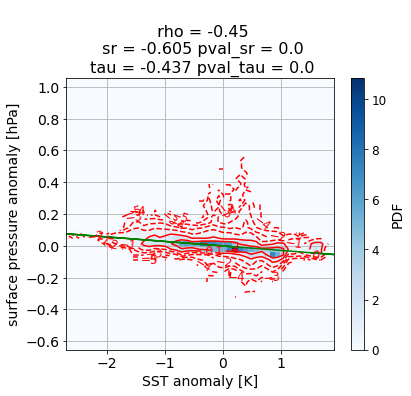

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9639097744360902
t value spearman r of the distr = 15.36091453178096
p value spearman r of the distr = 4.32676117156916e-12
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_06:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


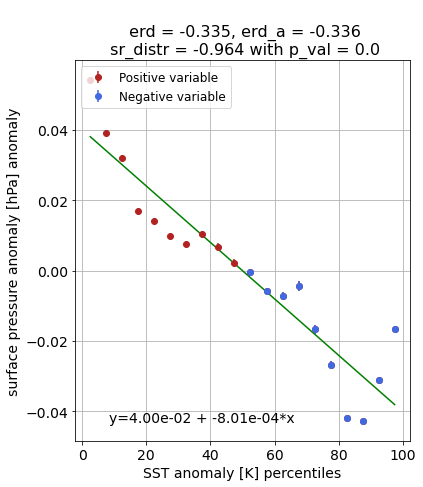

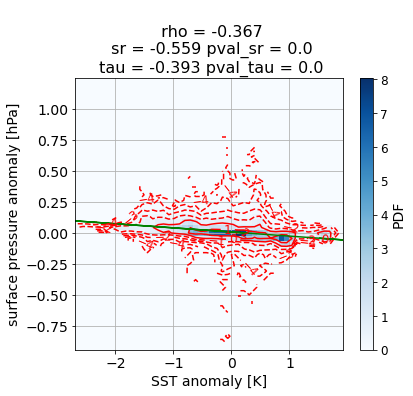

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.956390977443609
t value spearman r of the distr = 13.89171039867412
p value spearman r of the distr = 2.3114954394998222e-11
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2757. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_07:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


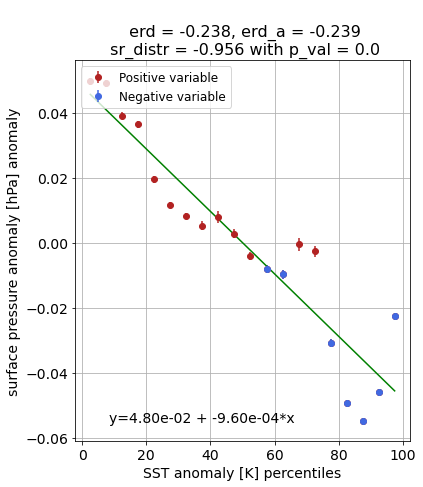

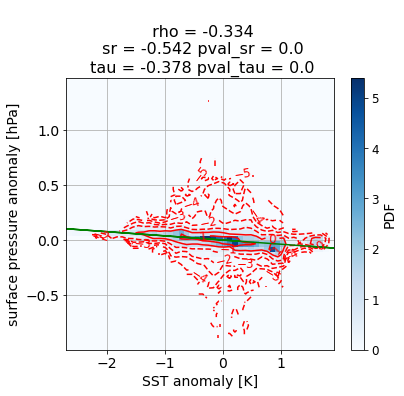

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9518796992481202
t value spearman r of the distr = 13.177336221996834
p value spearman r of the distr = 5.5140336741033025e-11
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2755. 2757. 2754. 2758. 2758.
 2758. 2754. 2758. 2754. 2759. 2760. 2759. 2759.] points.
2014-10-06_08:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


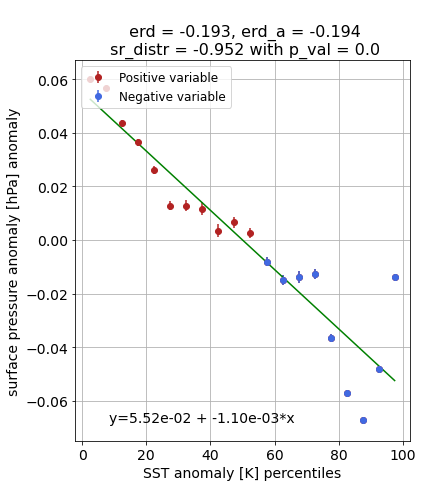

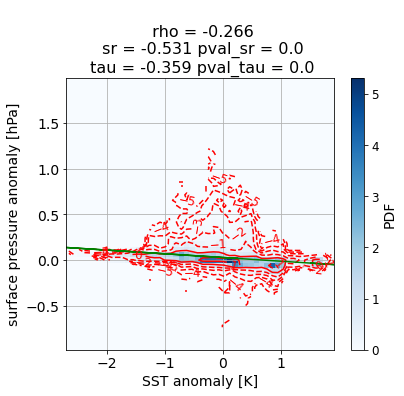

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.831578947368421
t value spearman r of the distr = 6.352266768913933
p value spearman r of the distr = 2.761186401856186e-06
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2757. 2759. 2758. 2757. 2757. 2760.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_09:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


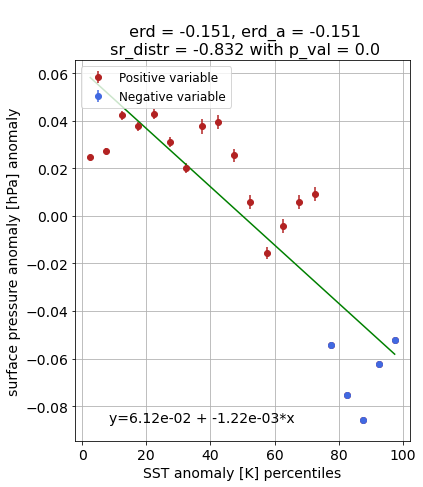

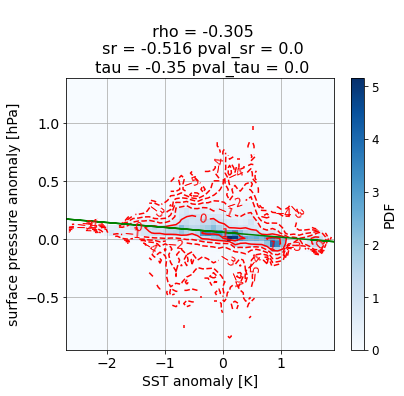

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.7834586466165413
t value spearman r of the distr = 5.348726424825096
p value spearman r of the distr = 2.196113697339186e-05
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2759.
 2745. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_10:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


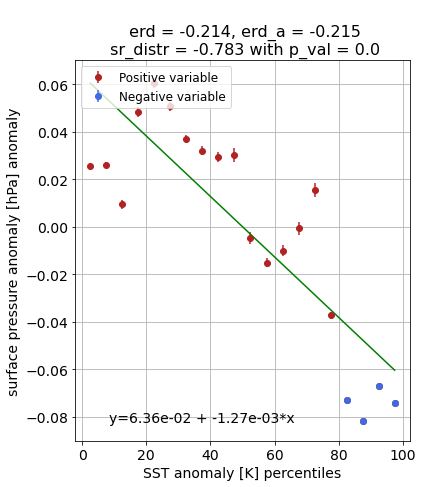

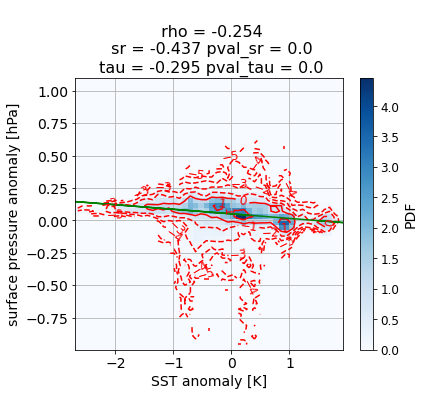

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8706766917293233
t value spearman r of the distr = 7.510267405585661
p value spearman r of the distr = 2.9769391129974565e-07
In the percentile bins there are [2760. 2759. 2758. 2759. 2756. 2758. 2756. 2758. 2758. 2758. 2756. 2753.
 2740. 2749. 2749. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_11:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


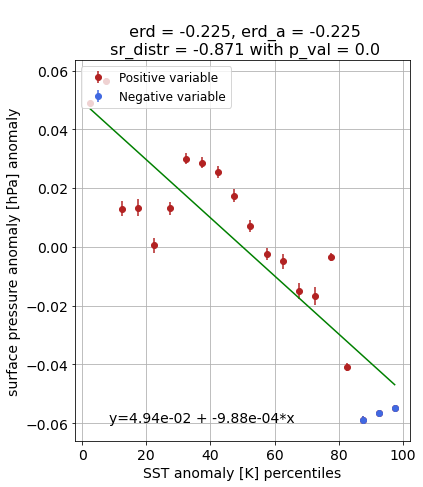

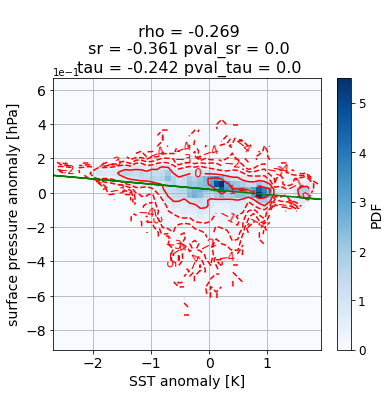

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.42105263157894735
t value spearman r of the distr = 1.9694638556693236
p value spearman r of the distr = 0.03224403756448524
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2758. 2760. 2757. 2758. 2761.
 2759. 2759. 2758. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_12:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


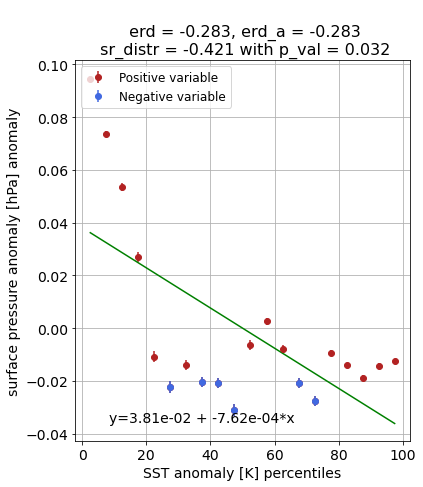

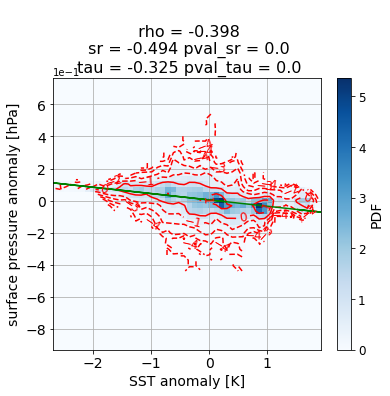

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9293233082706768
t value spearman r of the distr = 10.677325205517805
p value spearman r of the distr = 1.6137609026856126e-09
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_13:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


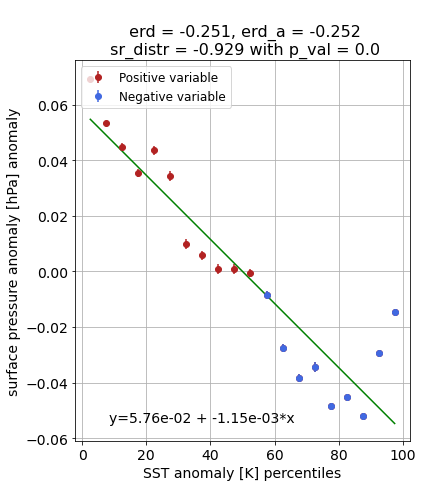

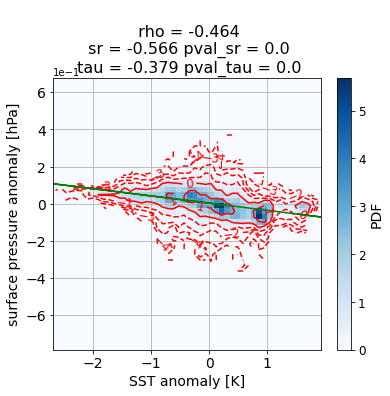

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9714285714285714
t value spearman r of the distr = 17.36563322747847
p value spearman r of the distr = 5.432321259490891e-13
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_14:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


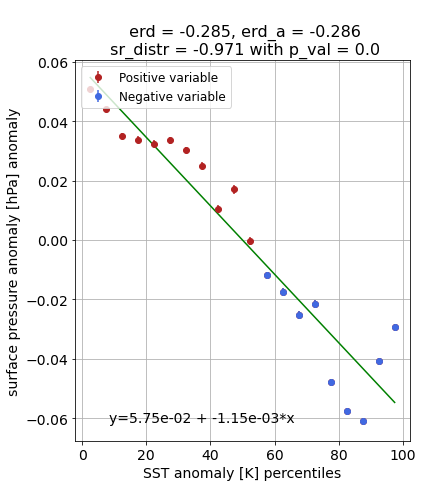

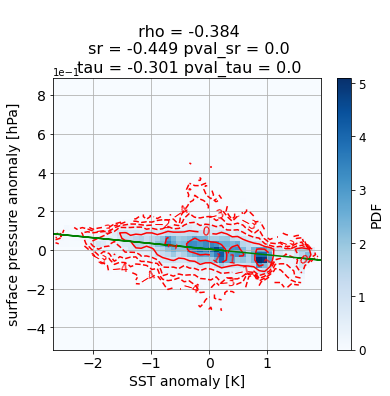

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9714285714285714
t value spearman r of the distr = 17.36563322747847
p value spearman r of the distr = 5.432321259490891e-13
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_15:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


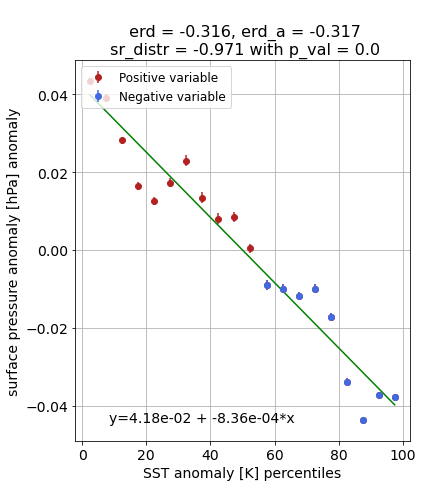

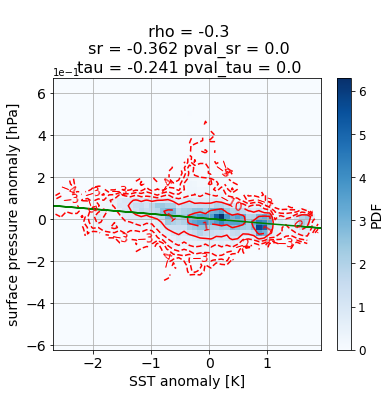

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9473684210526315
t value spearman r of the distr = 12.554744984332473
p value spearman r of the distr = 1.2148648753651514e-10
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_16:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


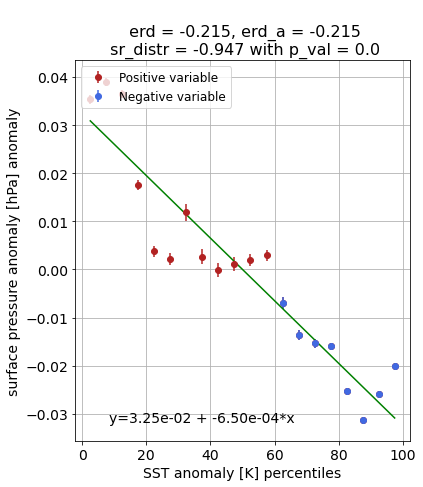

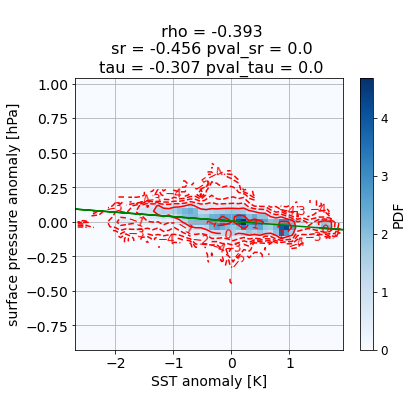

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9654135338345864
t value spearman r of the distr = 15.709760669302051
p value spearman r of the distr = 2.9661828548910307e-12
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_17:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


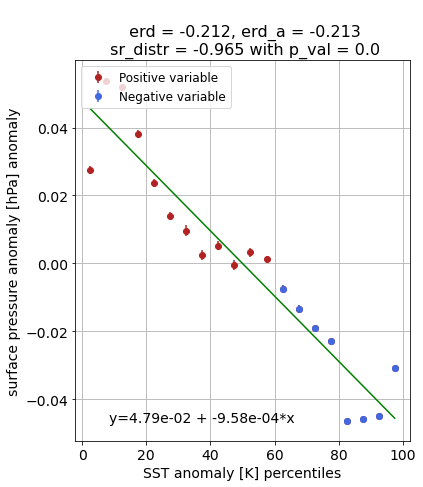

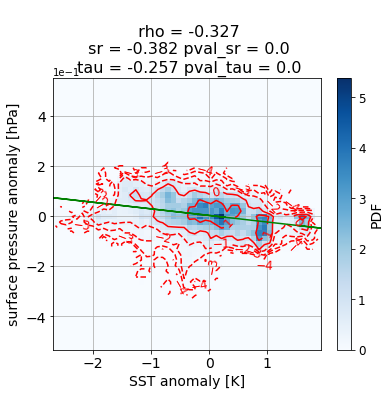

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8812030075187969
t value spearman r of the distr = 7.908455369587445
p value spearman r of the distr = 1.443042437765385e-07
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_18:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


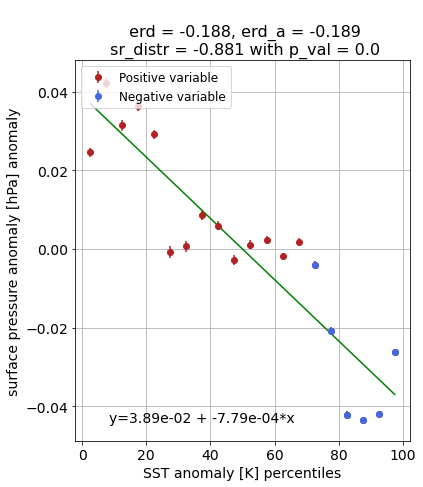

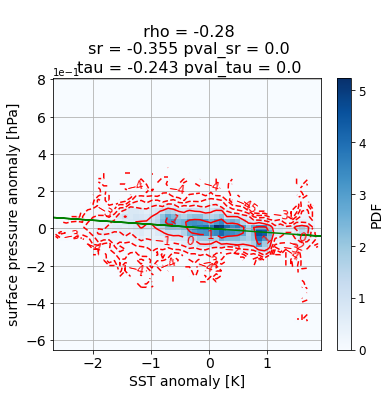

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9293233082706768
t value spearman r of the distr = 10.677325205517805
p value spearman r of the distr = 1.6137609026856126e-09
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_19:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


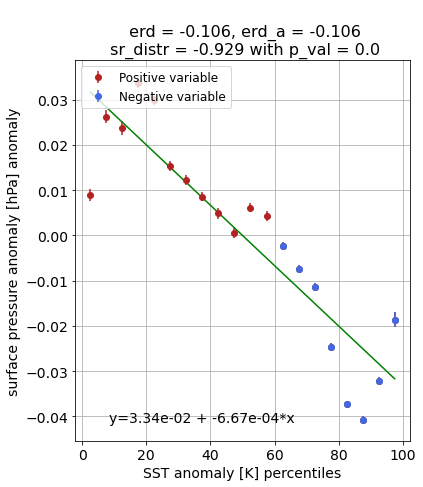

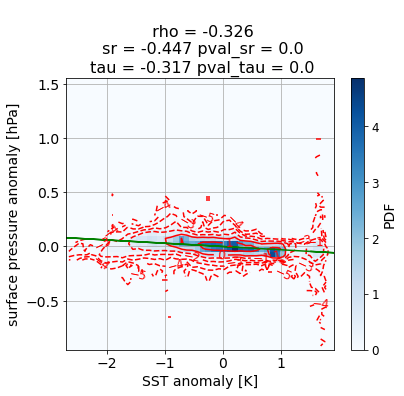

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8887218045112781
t value spearman r of the distr = 8.224567208486619
p value spearman r of the distr = 8.242637061783853e-08
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2750.] points.
2014-10-06_20:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


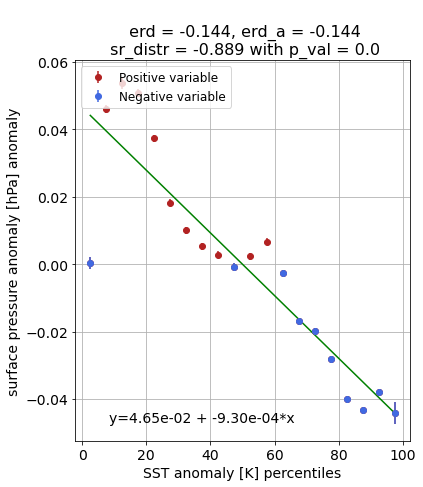

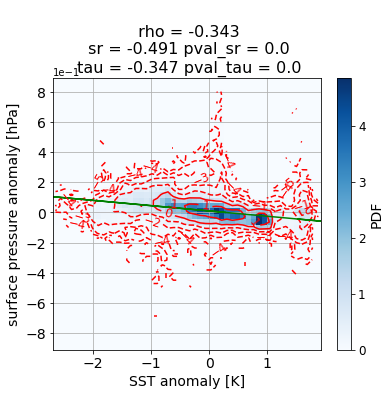

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9458646616541352
t value spearman r of the distr = 12.36427083169005
p value spearman r of the distr = 1.5568024647194534e-10
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_21:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


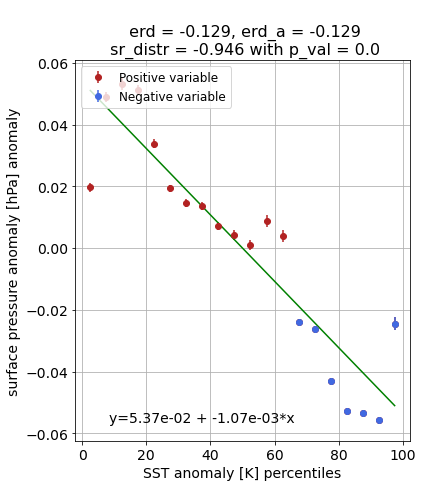

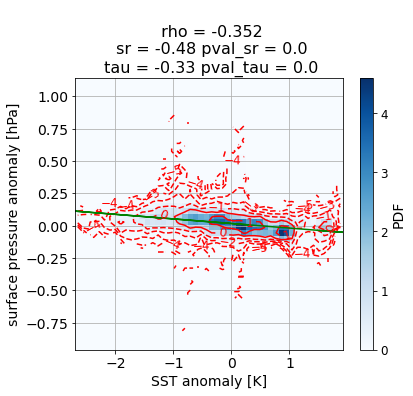

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9458646616541352
t value spearman r of the distr = 12.36427083169005
p value spearman r of the distr = 1.5568024647194534e-10
In the percentile bins there are [2760. 2759. 2758. 2758. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_22:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


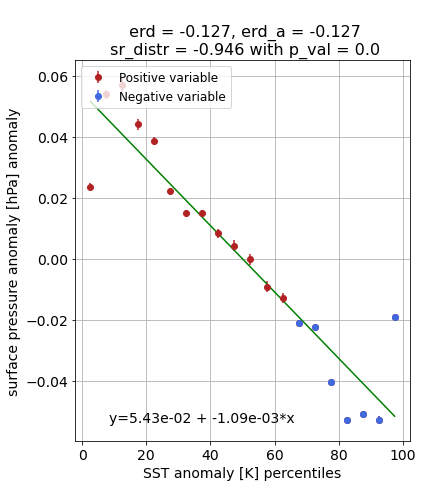

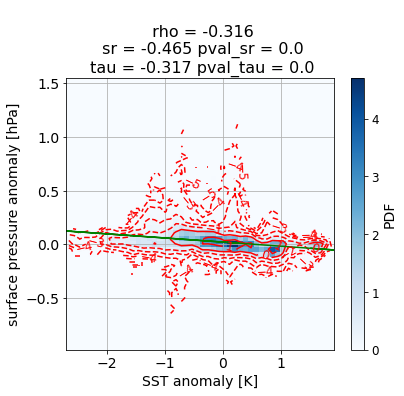

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9218045112781955
t value spearman r of the distr = 10.088570386219406
p value spearman r of the distr = 3.898137146407521e-09
In the percentile bins there are [2760. 2759. 2755. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-06_23:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


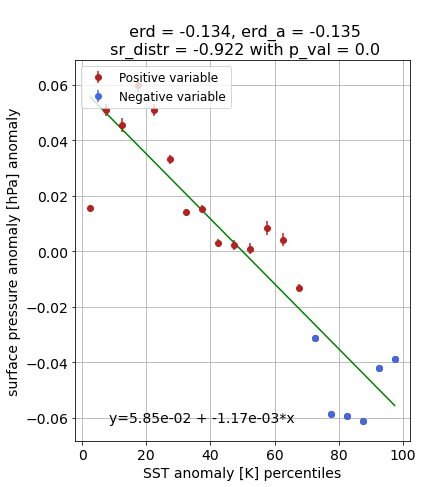

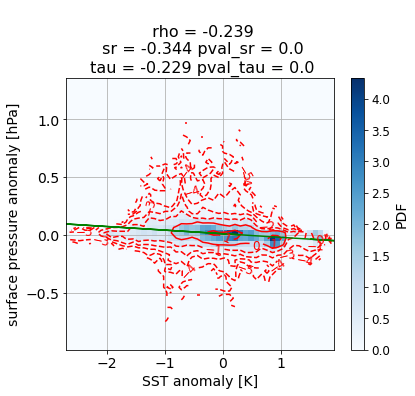

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8872180451127819
t value spearman r of the distr = 8.158978140845141
p value spearman r of the distr = 9.248391430460856e-08
In the percentile bins there are [2760. 2759. 2758. 2754. 2754. 2758. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_00:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


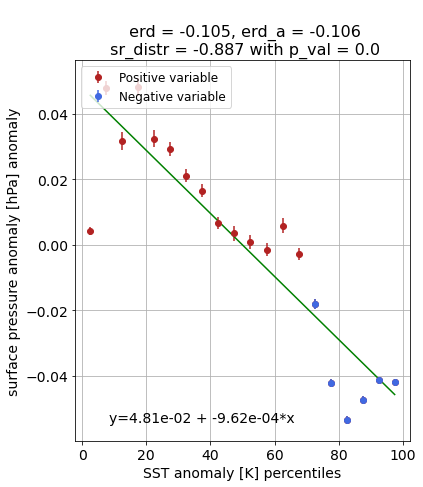

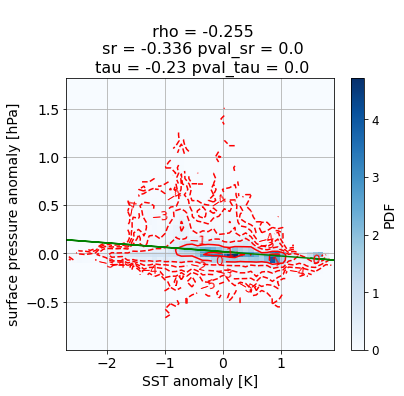

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8225563909774435
t value spearman r of the distr = 6.136648742997436
p value spearman r of the distr = 4.264591635827486e-06
In the percentile bins there are [2760. 2759. 2751. 2759. 2757. 2760. 2758. 2759. 2760. 2759. 2758. 2760.
 2759. 2759. 2759. 2758. 2759. 2760. 2758. 2759.] points.
2014-10-07_01:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


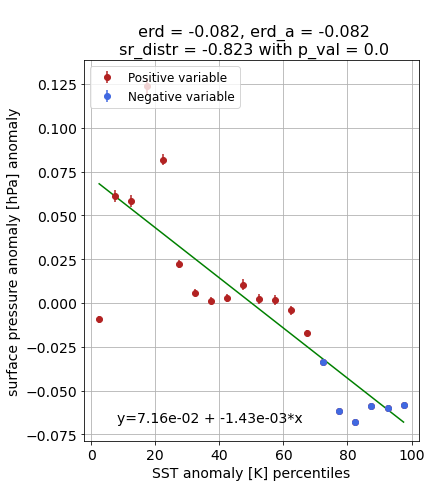

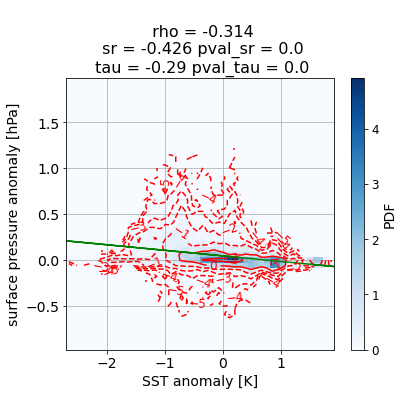

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9308270676691727
t value spearman r of the distr = 10.806012706148573
p value spearman r of the distr = 1.3372128959687757e-09
In the percentile bins there are [2760. 2757. 2758. 2758. 2757. 2760. 2757. 2758. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_02:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


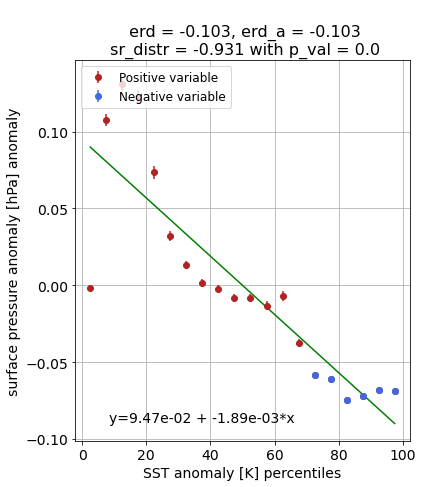

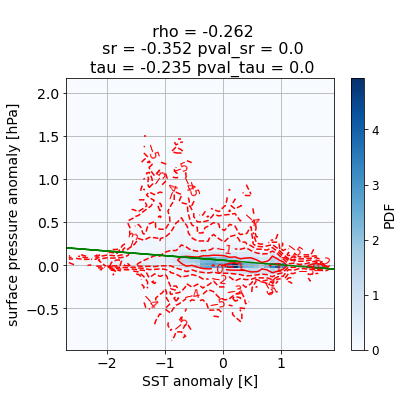

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9669172932330825
t value spearman r of the distr = 16.081702105773736
p value spearman r of the distr = 1.999067578140057e-12
In the percentile bins there are [2760. 2759. 2743. 2749. 2757. 2759. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2758. 2760. 2759. 2759.] points.
2014-10-07_03:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


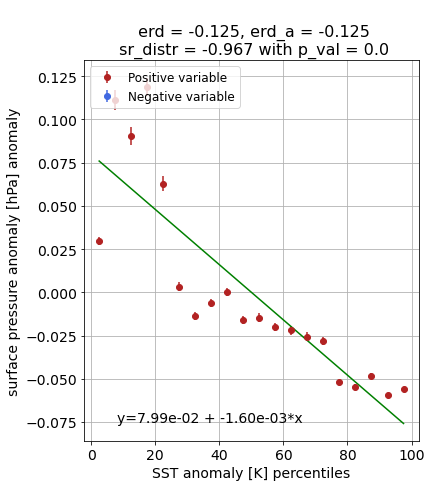

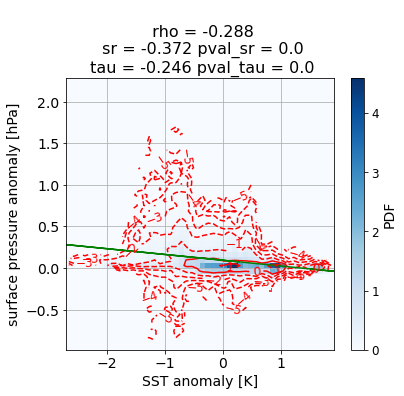

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.863157894736842
t value spearman r of the distr = 7.2525677689909935
p value spearman r of the distr = 4.810761595752666e-07
In the percentile bins there are [2760. 2748. 2743. 2754. 2757. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_04:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


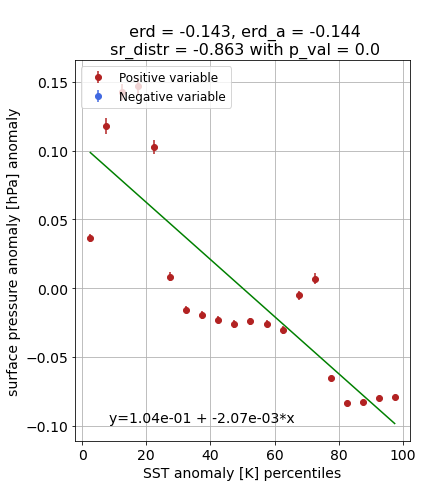

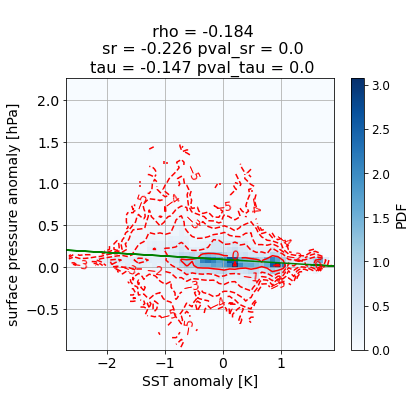

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9248120300751879
t value spearman r of the distr = 10.313863546217771
p value spearman r of the distr = 2.7695825632889637e-09
In the percentile bins there are [2759. 2745. 2746. 2738. 2758. 2758. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2758. 2758. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_05:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


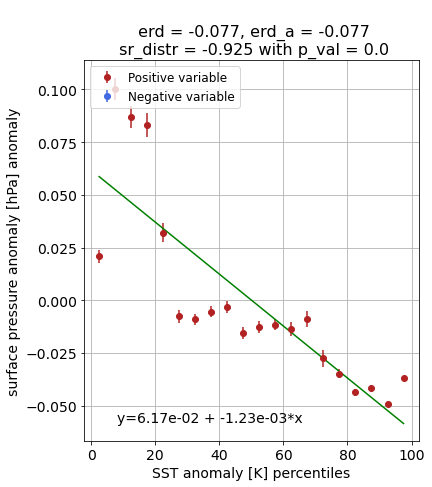

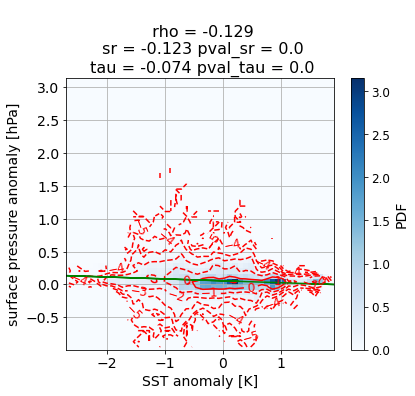

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.6721804511278194
t value spearman r of the distr = 3.8517947355708455
p value spearman r of the distr = 0.0005842151451861399
In the percentile bins there are [2754. 2744. 2751. 2744. 2756. 2757. 2758. 2759. 2760. 2759. 2758. 2760.
 2758. 2758. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_06:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


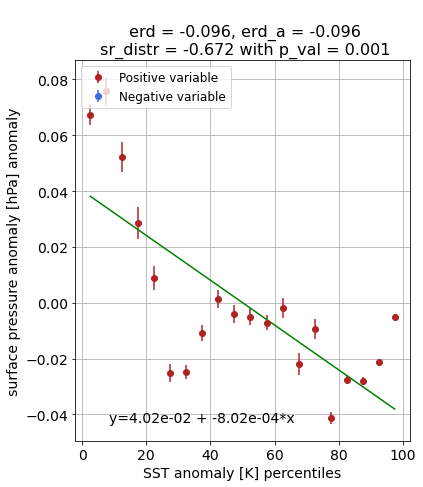

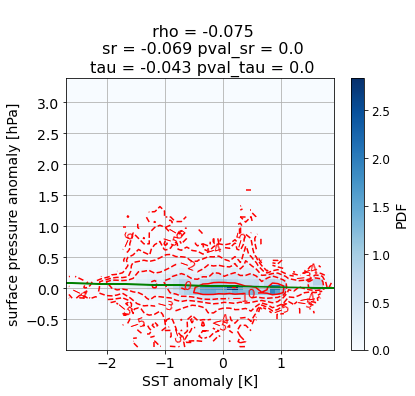

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.4827067669172932
t value spearman r of the distr = 2.33842586582894
p value spearman r of the distr = 0.015552608434771686
In the percentile bins there are [2751. 2733. 2749. 2724. 2749. 2756. 2758. 2759. 2759. 2758. 2758. 2761.
 2755. 2752. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_07:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


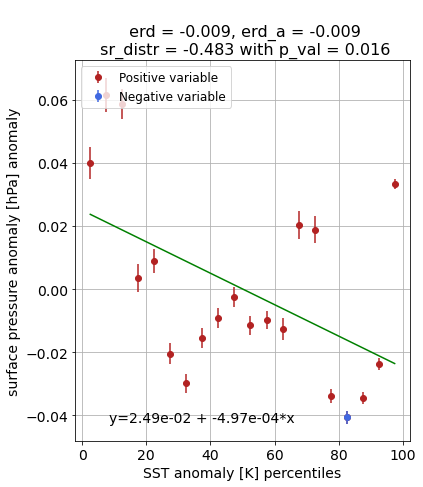

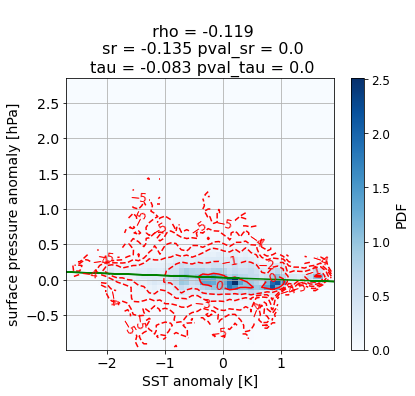

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.7172932330827068
t value spearman r of the distr = 4.367597965378896
p value spearman r of the distr = 0.00018557046683342904
In the percentile bins there are [2740. 2737. 2751. 2754. 2755. 2758. 2758. 2758. 2750. 2749. 2757. 2760.
 2758. 2750. 2753. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_08:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


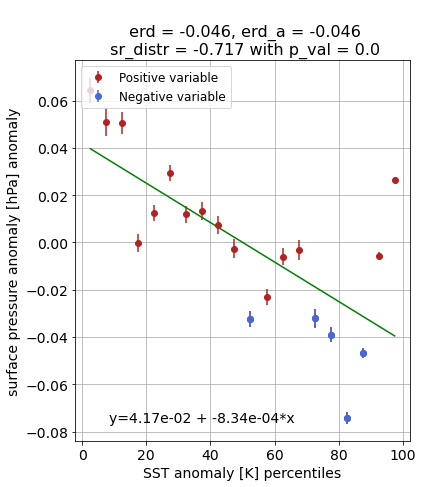

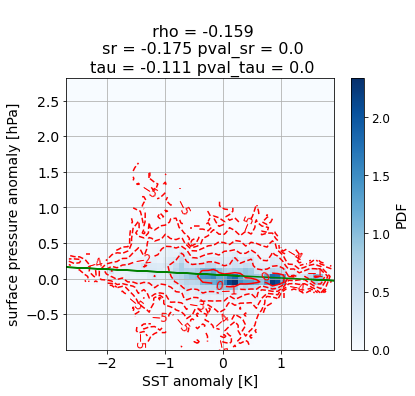

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.3924812030075188
t value spearman r of the distr = 1.8104251912212708
p value spearman r of the distr = 0.04347797122949537
In the percentile bins there are [2746. 2722. 2753. 2759. 2756. 2755. 2751. 2750. 2753. 2750. 2752. 2761.
 2757. 2756. 2751. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_09:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


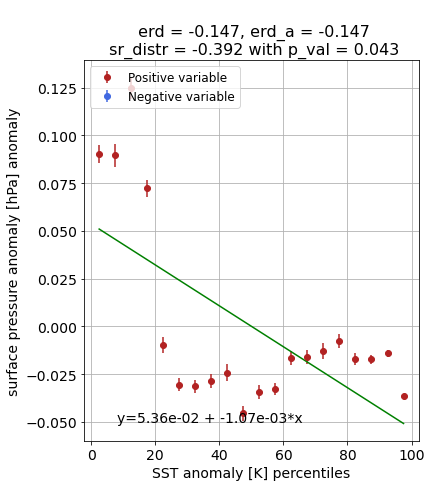

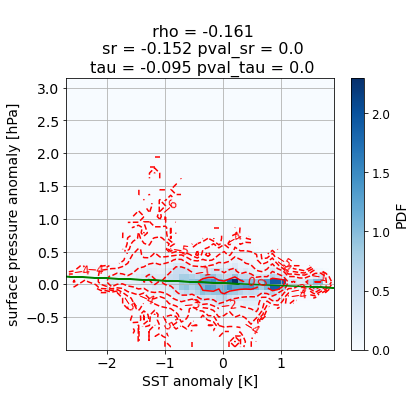

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.4060150375939849
t value spearman r of the distr = 1.8849318960890313
p value spearman r of the distr = 0.03784468605719893
In the percentile bins there are [2754. 2742. 2749. 2749. 2754. 2757. 2756. 2756. 2760. 2757. 2758. 2761.
 2757. 2744. 2756. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_10:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


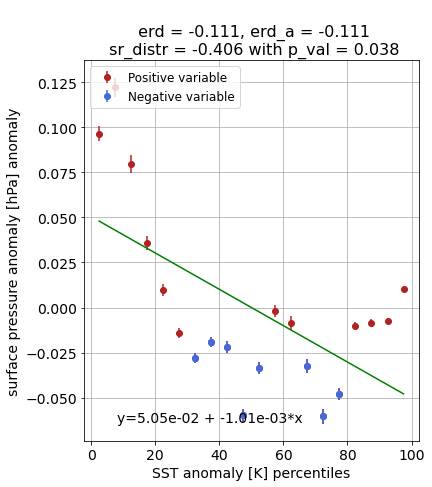

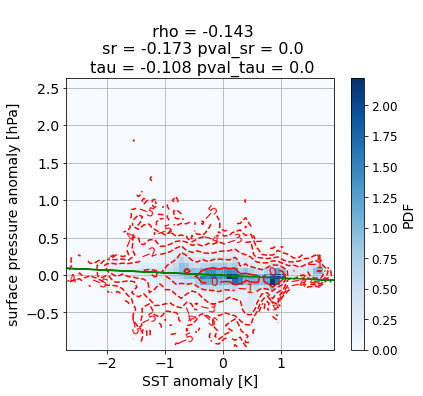

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5924812030075187
t value spearman r of the distr = 3.1203251308738444
p value spearman r of the distr = 0.002955232951092124
In the percentile bins there are [2716. 2747. 2747. 2737. 2756. 2760. 2758. 2754. 2757. 2755. 2757. 2760.
 2755. 2754. 2754. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_11:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


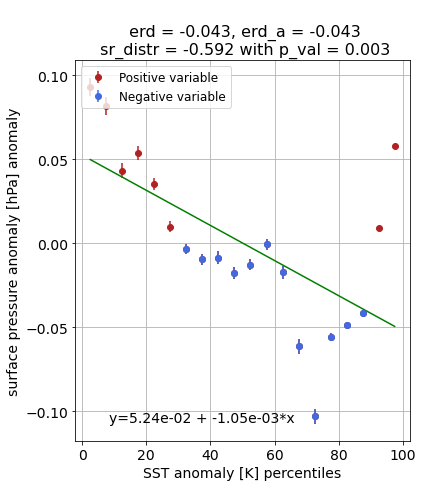

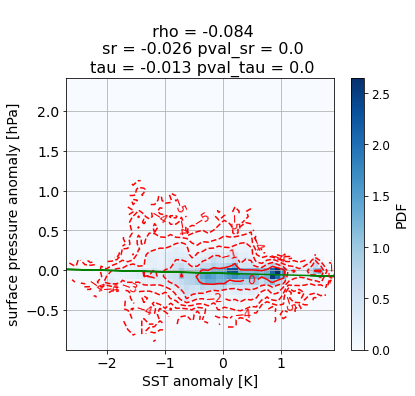

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.34586466165413526
t value spearman r of the distr = 1.563896264988186
p value spearman r of the distr = 0.06762617156675821
In the percentile bins there are [2752. 2755. 2758. 2758. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2759.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_12:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


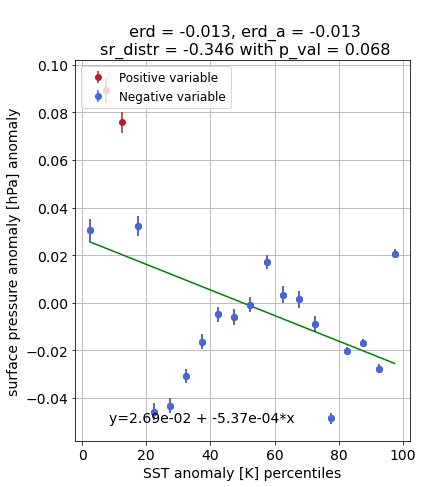

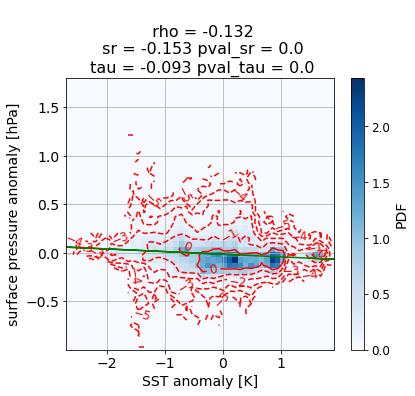

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.6270676691729322
t value spearman r of the distr = 3.415331287932747
p value spearman r of the distr = 0.0015424703495702241
In the percentile bins there are [2760. 2756. 2759. 2757. 2757. 2757. 2754. 2756. 2755. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_13:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


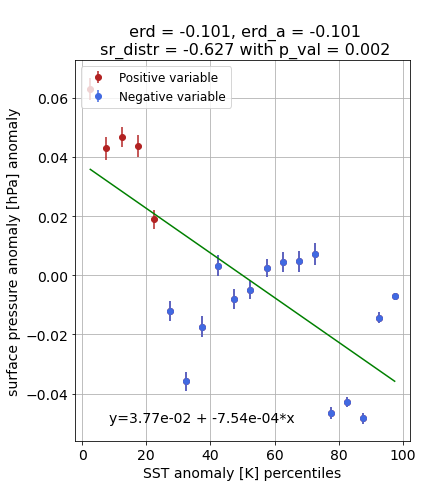

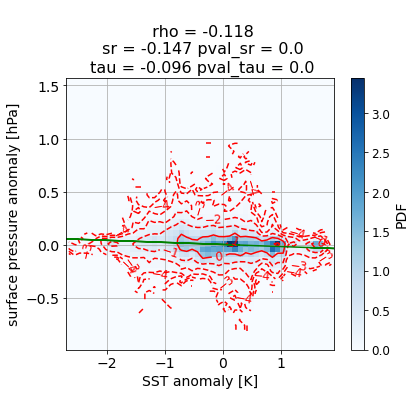

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.7864661654135338
t value spearman r of the distr = 5.402385224308096
p value spearman r of the distr = 1.959510769566908e-05
In the percentile bins there are [2760. 2758. 2759. 2759. 2758. 2760. 2758. 2758. 2755. 2758. 2758. 2761.
 2758. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_14:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


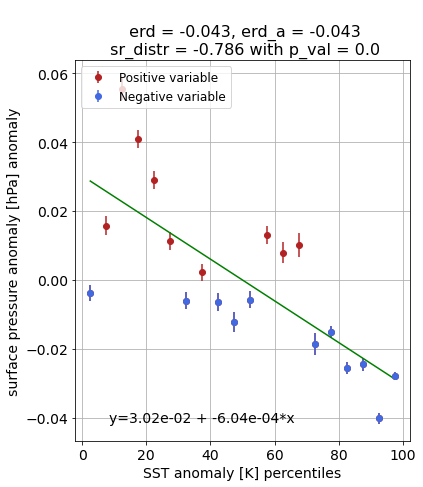

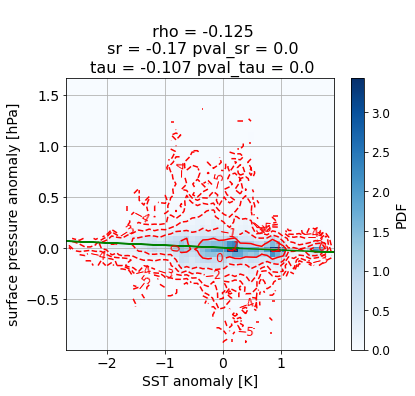

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8586466165413533
t value spearman r of the distr = 7.107210829549534
p value spearman r of the distr = 6.331503228373947e-07
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2758. 2757. 2753. 2750.
 2748. 2753. 2754. 2757. 2758. 2760. 2759. 2759.] points.
2014-10-07_15:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


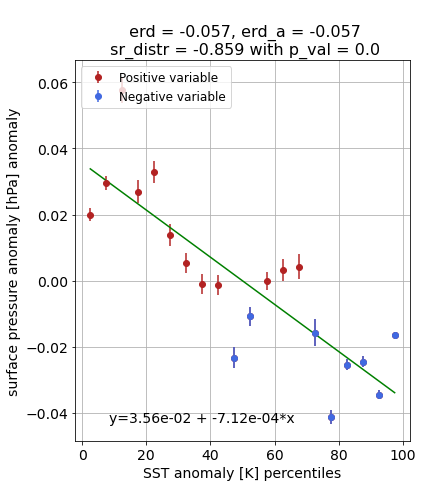

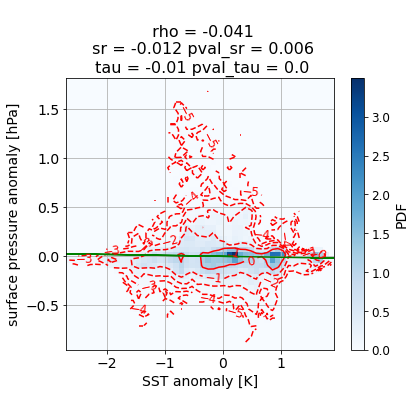

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.3413533834586466
t value spearman r of the distr = 1.5407870771943855
p value spearman r of the distr = 0.07038234858015402
In the percentile bins there are [2760. 2759. 2752. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2757. 2758. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_16:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


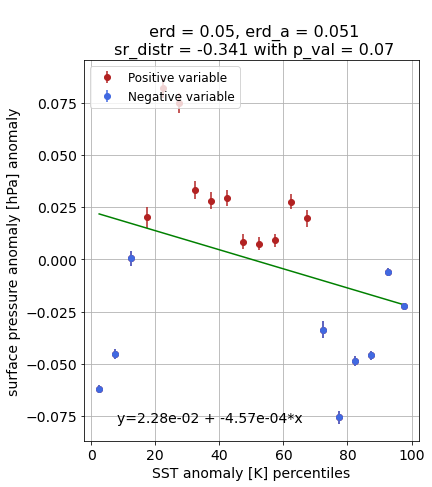

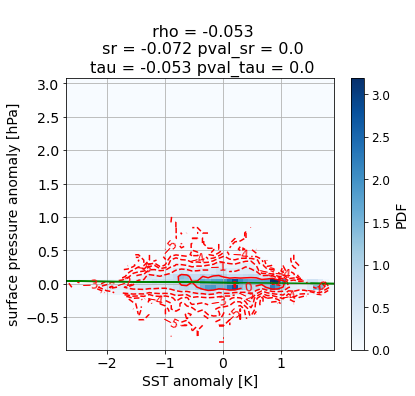

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.38496240601503756
t value spearman r of the distr = 1.7696392765887956
p value spearman r of the distr = 0.04686273169384003
In the percentile bins there are [2760. 2759. 2757. 2759. 2755. 2759. 2758. 2759. 2760. 2759. 2758. 2761.
 2757. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_17:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


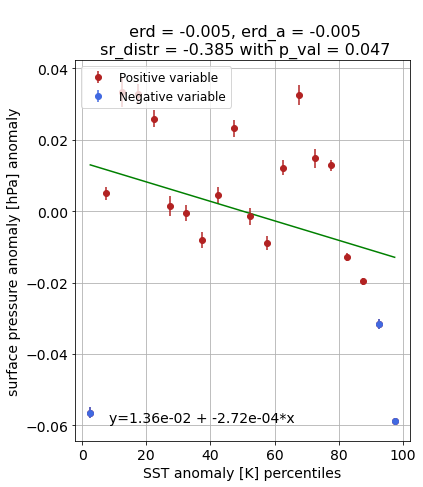

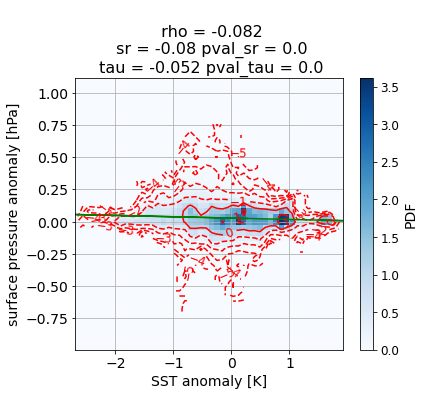

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5097744360902255
t value spearman r of the distr = 2.5139711780383496
p value spearman r of the distr = 0.01083448331076764
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2757. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_18:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


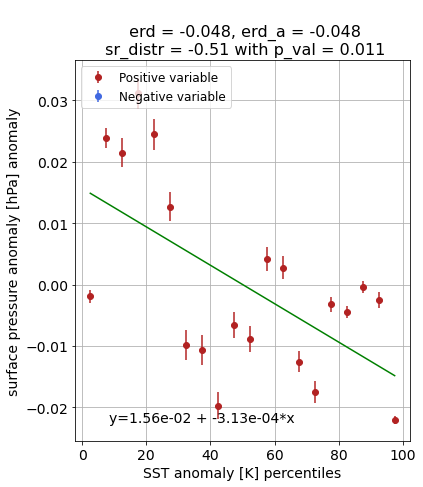

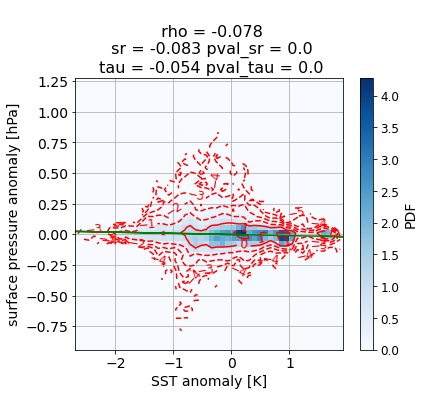

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5924812030075187
t value spearman r of the distr = 3.1203251308738444
p value spearman r of the distr = 0.002955232951092124
In the percentile bins there are [2760. 2759. 2758. 2758. 2757. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_19:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


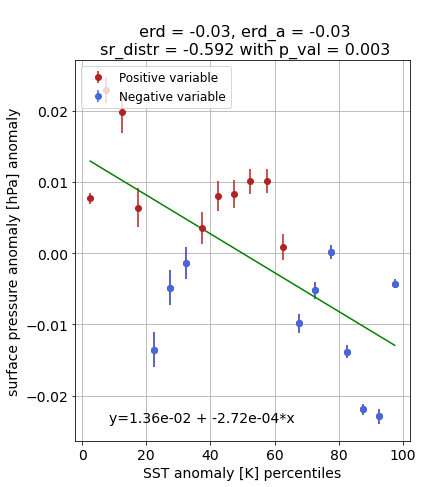

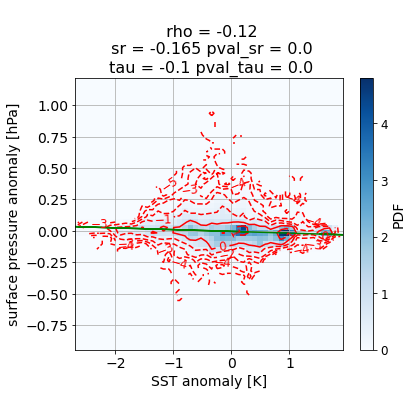

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.7563909774436091
t value spearman r of the distr = 4.905974753304473
p value spearman r of the distr = 5.692097559528708e-05
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_20:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


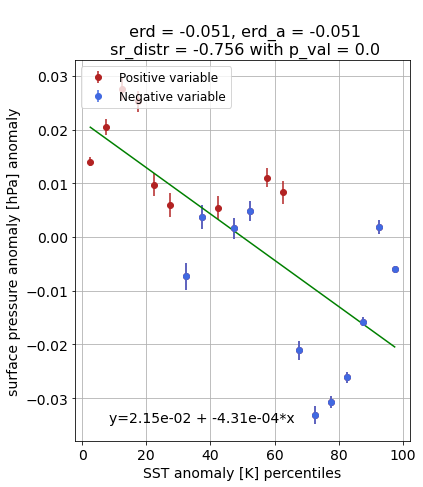

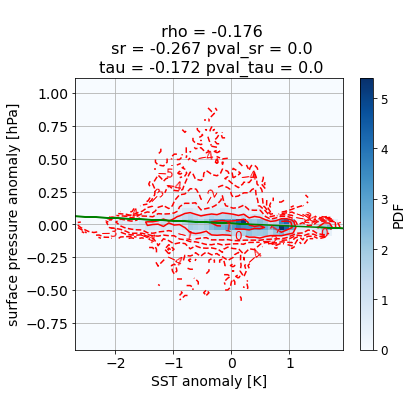

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.831578947368421
t value spearman r of the distr = 6.352266768913933
p value spearman r of the distr = 2.761186401856186e-06
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2758. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_21:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


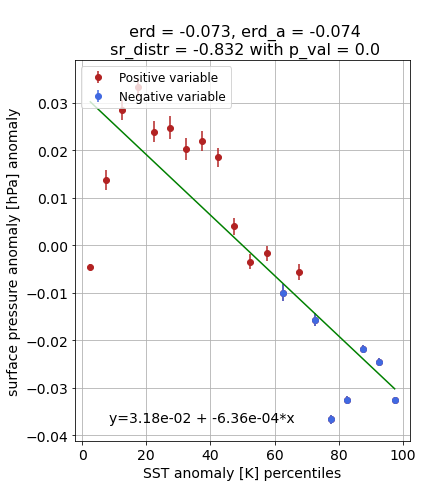

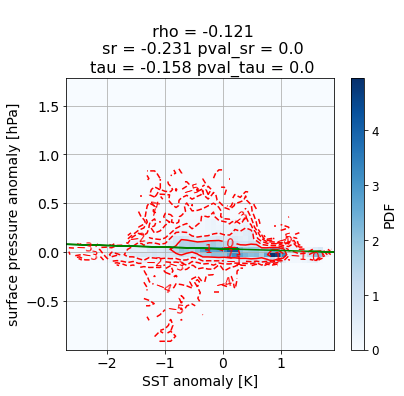

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5353383458646617
t value spearman r of the distr = 2.689020664996486
p value spearman r of the distr = 0.0074985648218163226
In the percentile bins there are [2760. 2753. 2755. 2759. 2758. 2758. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_22:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


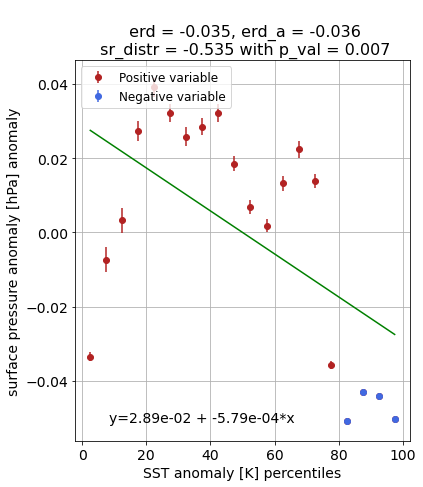

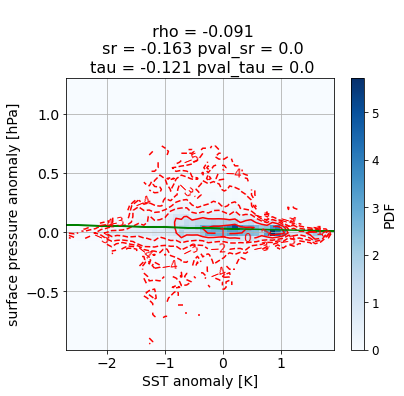

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5639097744360902
t value spearman r of the distr = 2.8970223897634018
p value spearman r of the distr = 0.004803485768788307
In the percentile bins there are [2760. 2749. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-07_23:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


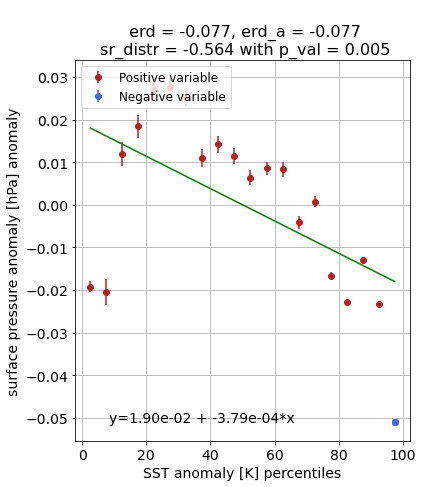

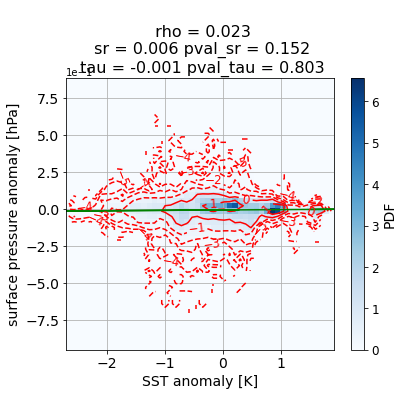

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = 0.10075187969924812
t value spearman r of the distr = 0.42964021251519185
p value spearman r of the distr = 0.3362782177428909
In the percentile bins there are [2760. 2757. 2758. 2759. 2758. 2760. 2757. 2759. 2760. 2759. 2758. 2761.
 2759. 2758. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_00:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


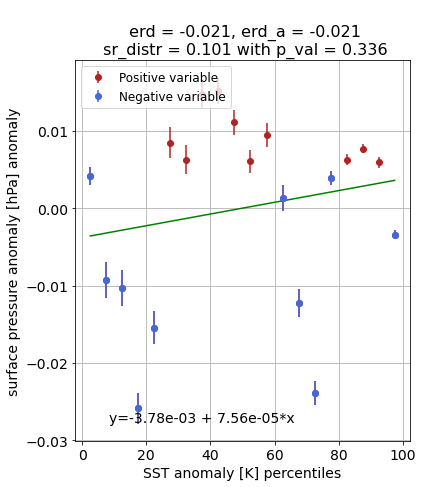

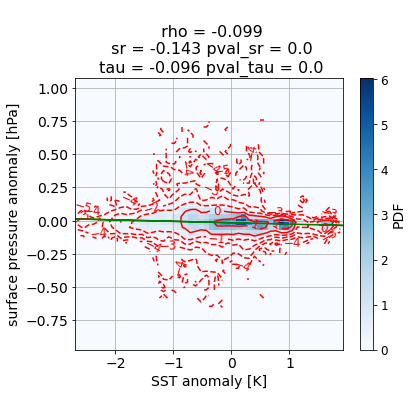

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8390977443609022
t value spearman r of the distr = 6.54433216193934
p value spearman r of the distr = 1.8845309646131625e-06
In the percentile bins there are [2760. 2758. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2758. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_01:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


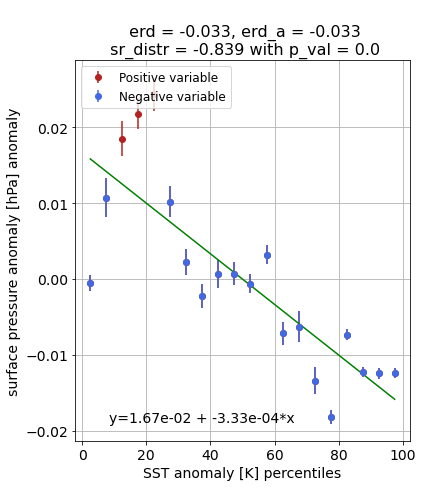

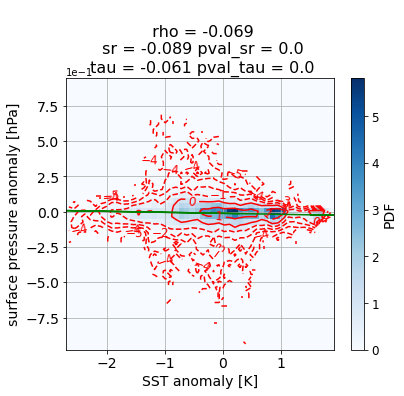

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5804511278195488
t value spearman r of the distr = 3.0242667701355432
p value spearman r of the distr = 0.0036450366122421363
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2759. 2757. 2758. 2760.
 2755. 2755. 2758. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_02:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


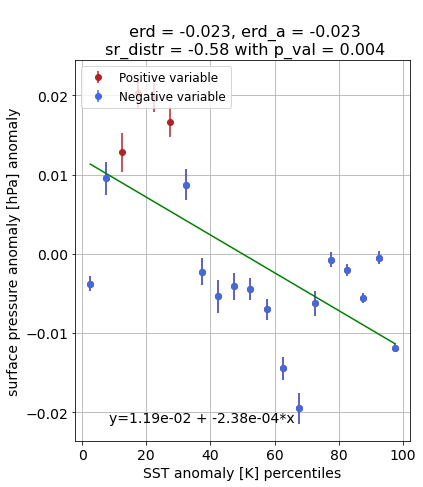

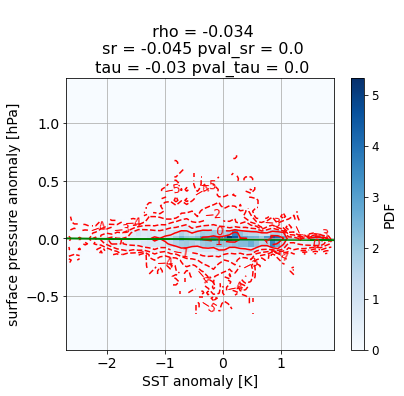

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.4676691729323308
t value spearman r of the distr = 2.244760965484853
p value spearman r of the distr = 0.018794255102074442
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2758. 2757. 2758. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_03:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


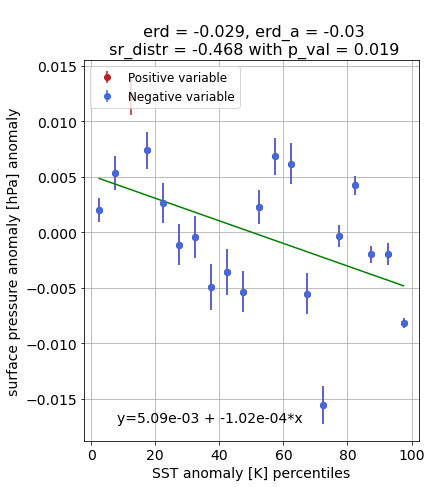

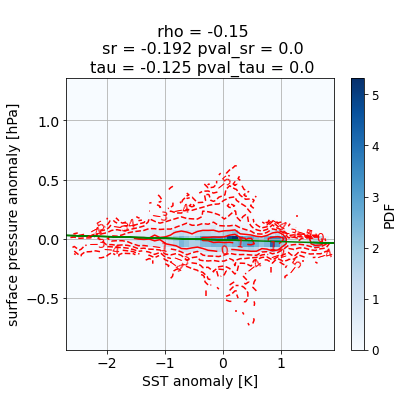

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8586466165413533
t value spearman r of the distr = 7.107210829549534
p value spearman r of the distr = 6.331503228373947e-07
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2758. 2758. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_04:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


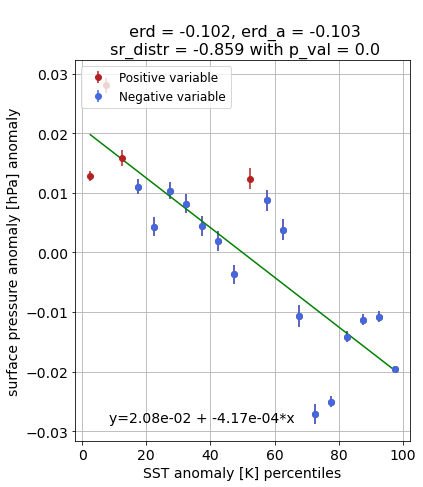

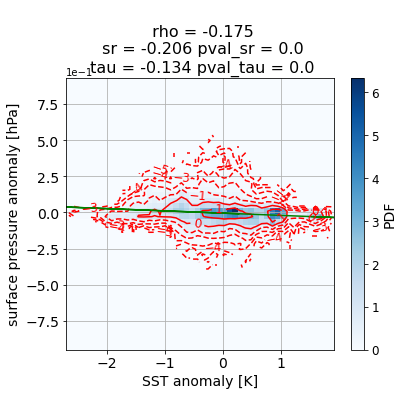

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.831578947368421
t value spearman r of the distr = 6.352266768913933
p value spearman r of the distr = 2.761186401856186e-06
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_05:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


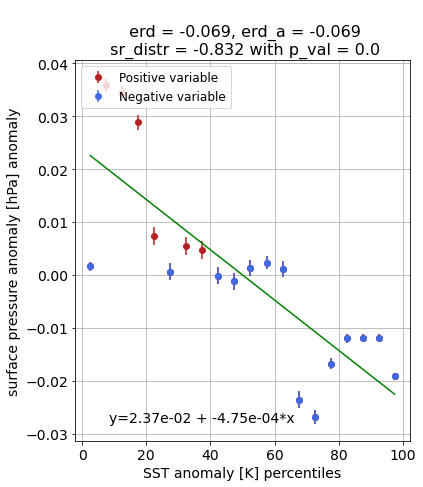

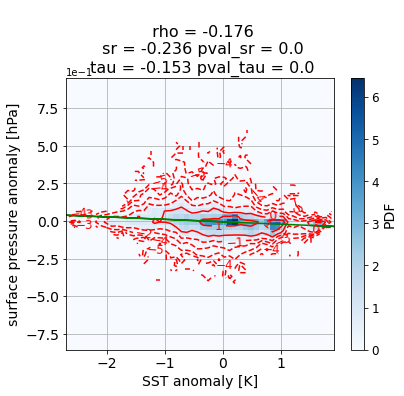

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8887218045112781
t value spearman r of the distr = 8.224567208486619
p value spearman r of the distr = 8.242637061783853e-08
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_06:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


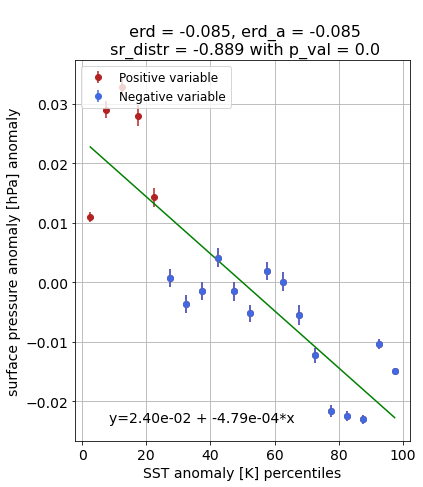

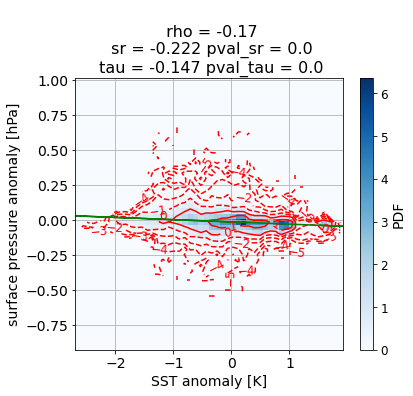

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.7909774436090224
t value spearman r of the distr = 5.484773730402293
p value spearman r of the distr = 1.64593636400312e-05
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_07:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


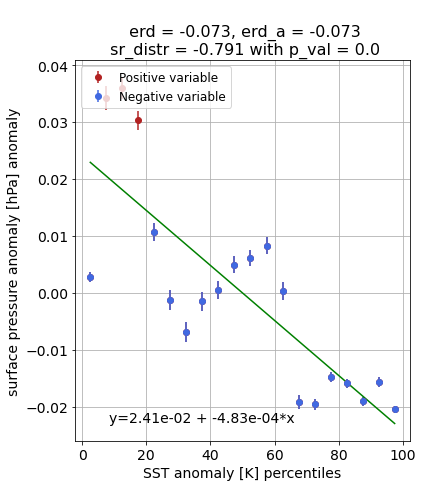

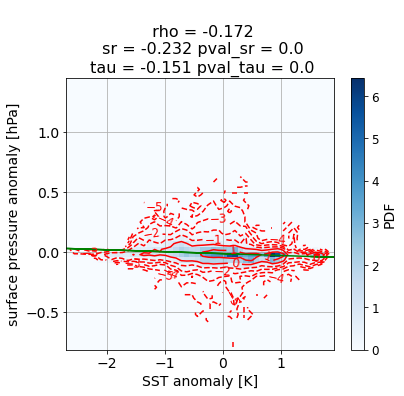

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8345864661654135
t value spearman r of the distr = 6.427661208714173
p value spearman r of the distr = 2.3753028894901718e-06
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_08:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


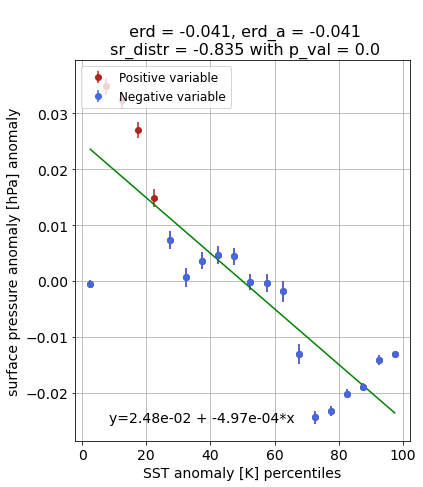

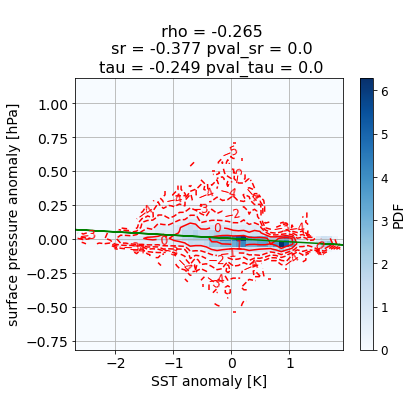

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9458646616541352
t value spearman r of the distr = 12.36427083169005
p value spearman r of the distr = 1.5568024647194534e-10
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_09:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


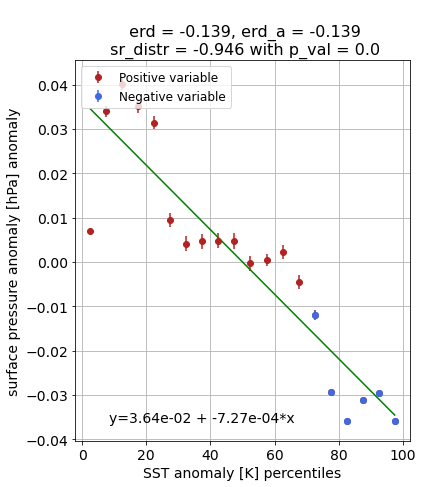

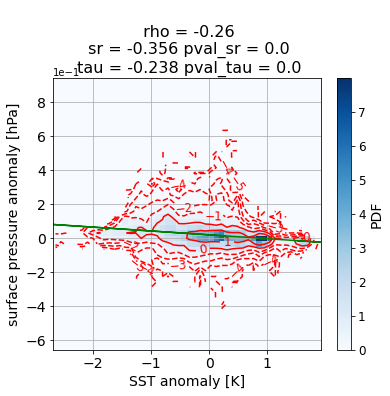

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9067669172932331
t value spearman r of the distr = 9.124269264453865
p value spearman r of the distr = 1.7946166330773394e-08
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_10:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


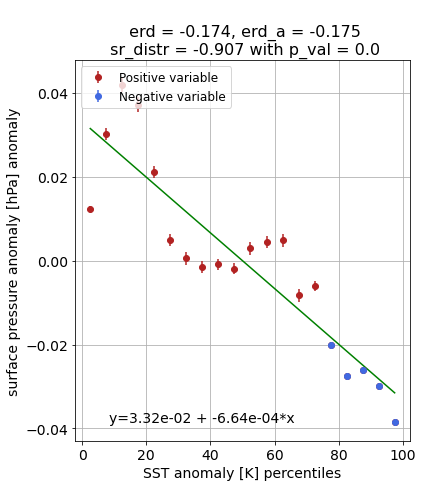

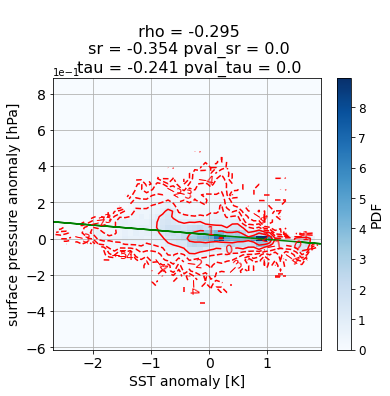

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8661654135338346
t value spearman r of the distr = 7.353224777009601
p value spearman r of the distr = 3.9841280707886284e-07
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_11:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


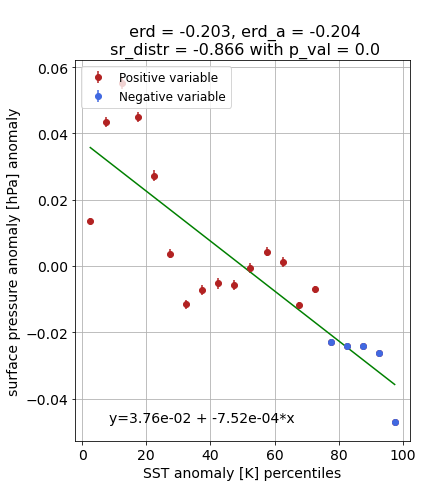

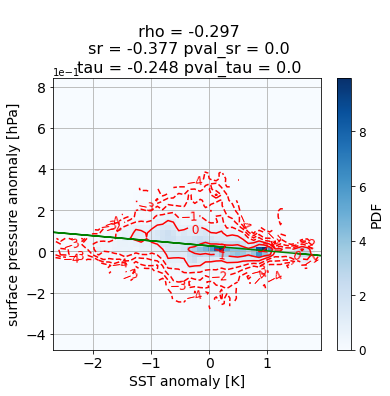

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9488721804511278
t value spearman r of the distr = 12.753331616493833
p value spearman r of the distr = 9.410849877156124e-11
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_12:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


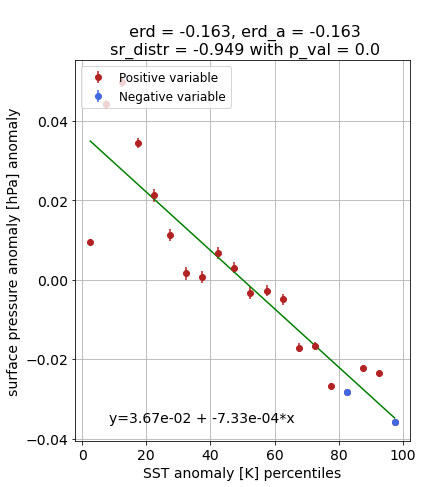

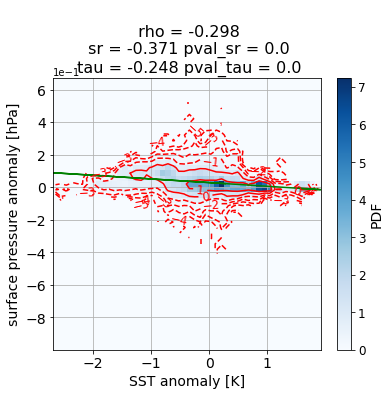

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.918796992481203
t value spearman r of the distr = 9.875412508083222
p value spearman r of the distr = 5.4138639127288e-09
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_13:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


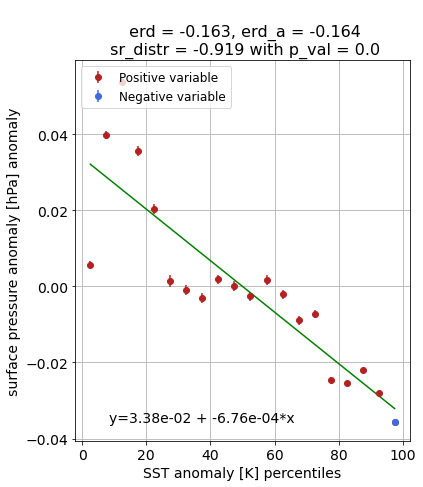

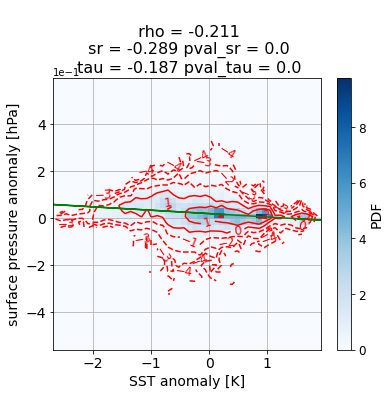

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8872180451127819
t value spearman r of the distr = 8.158978140845141
p value spearman r of the distr = 9.248391430460856e-08
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_14:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


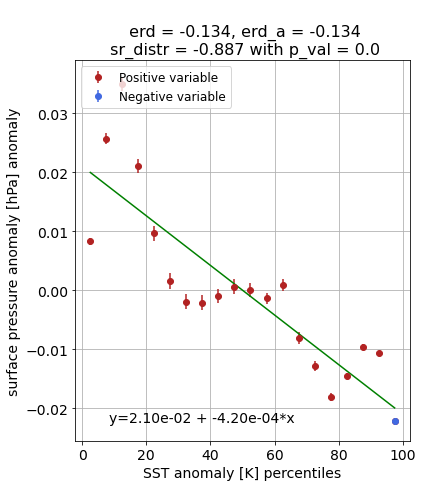

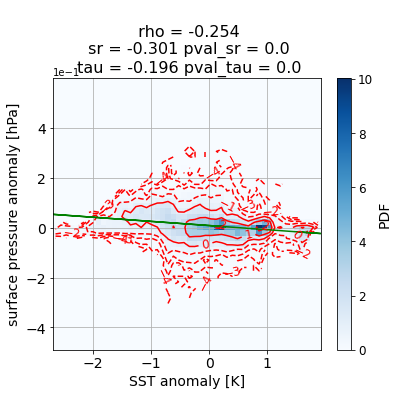

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8345864661654135
t value spearman r of the distr = 6.427661208714173
p value spearman r of the distr = 2.3753028894901718e-06
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_15:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


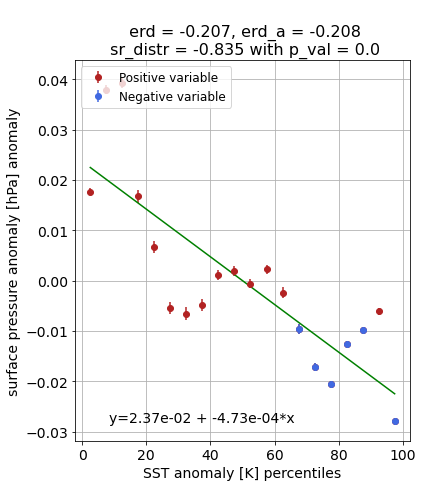

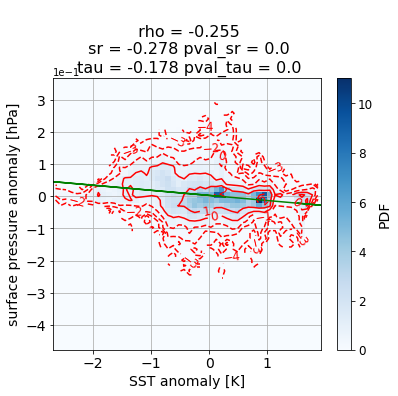

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.793984962406015
t value spearman r of the distr = 5.541019386918575
p value spearman r of the distr = 1.461866939844736e-05
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_16:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


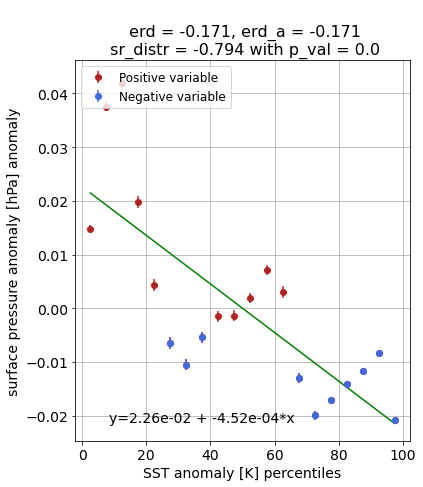

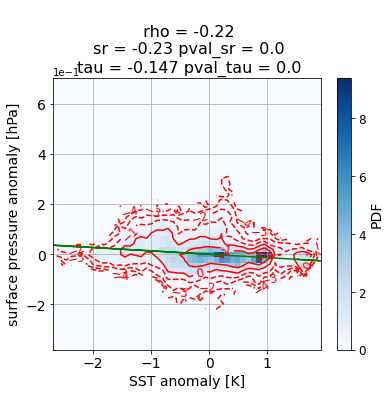

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.6736842105263157
t value spearman r of the distr = 3.8675578407900186
p value spearman r of the distr = 0.0005640483686185638
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_17:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


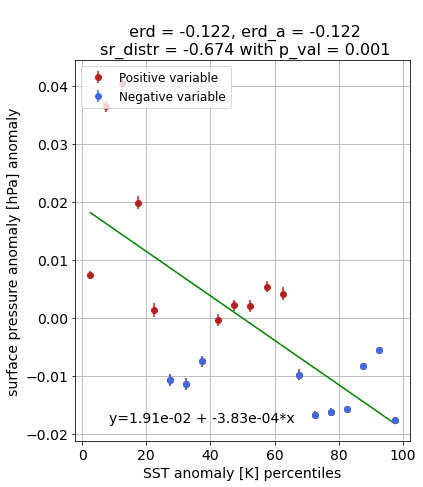

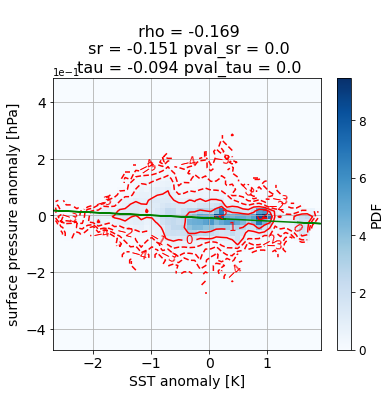

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.4827067669172932
t value spearman r of the distr = 2.33842586582894
p value spearman r of the distr = 0.015552608434771686
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_18:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


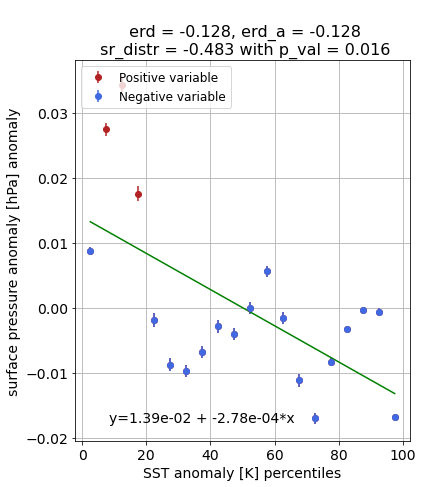

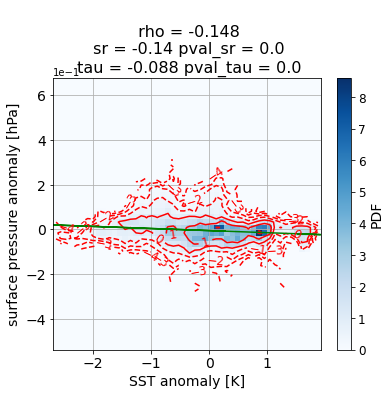

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5142857142857143
t value spearman r of the distr = 2.544171376130346
p value spearman r of the distr = 0.010173064143490285
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_19:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


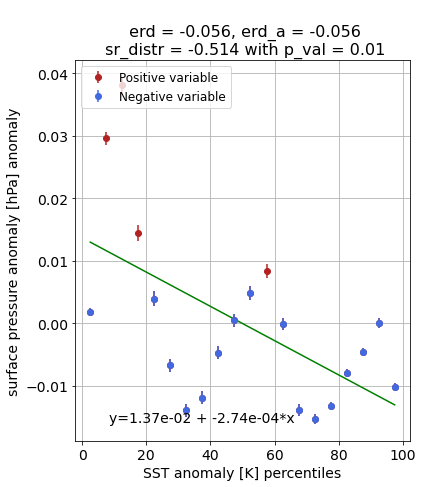

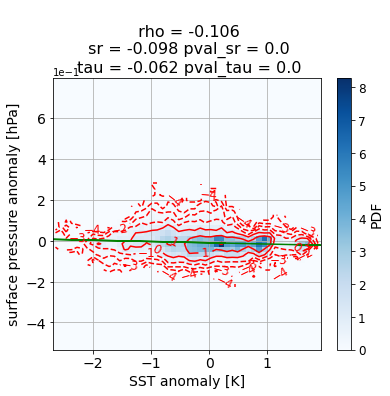

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.4661654135338345
t value spearman r of the distr = 2.2355349400174895
p value spearman r of the distr = 0.019145249438152545
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_20:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


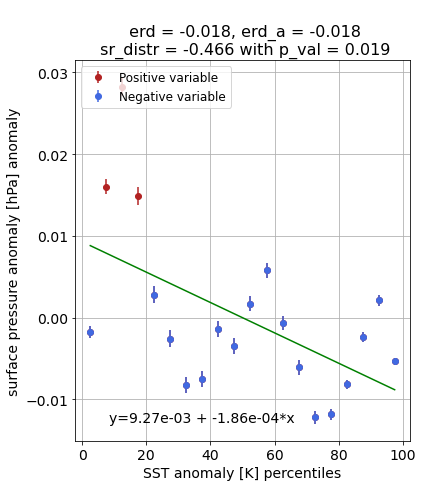

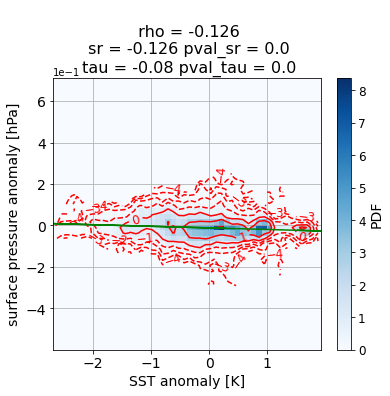

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5759398496240601
t value spearman r of the distr = 2.9890269516875496
p value spearman r of the distr = 0.003935470088722526
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_21:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


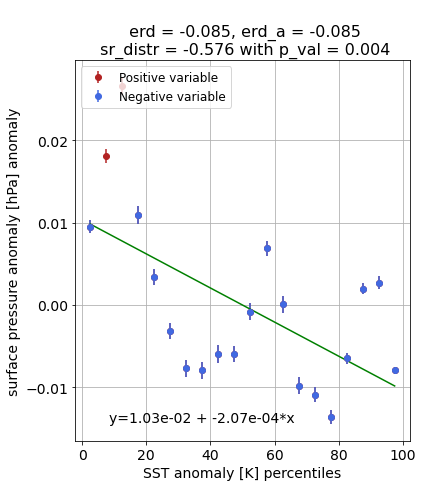

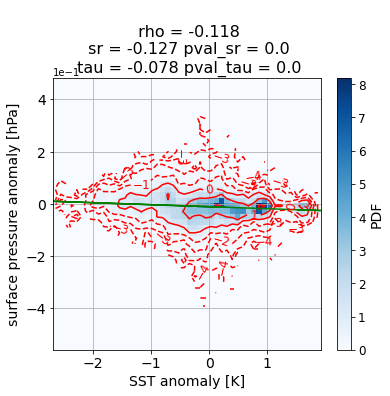

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.4090225563909774
t value spearman r of the distr = 1.9016872115177386
p value spearman r of the distr = 0.03667043287182403
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_22:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


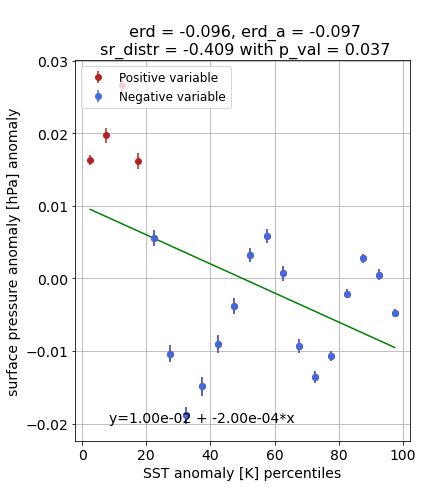

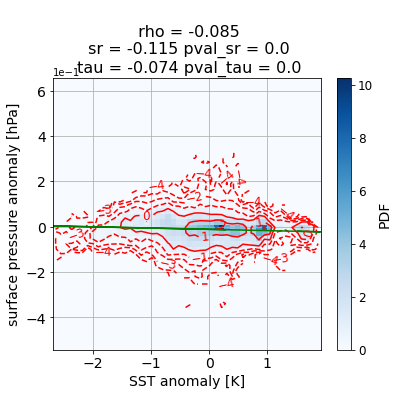

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.42556390977443603
t value spearman r of the distr = 1.9952018459935859
p value spearman r of the distr = 0.030692460037702096
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-08_23:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


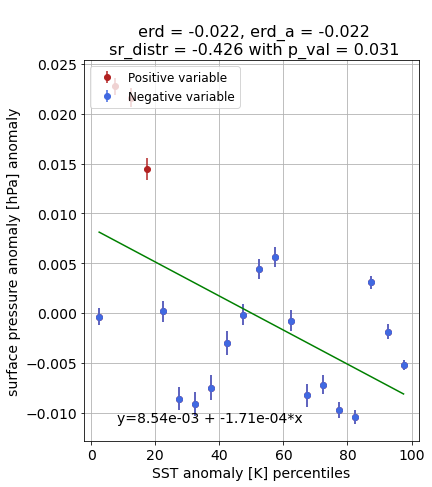

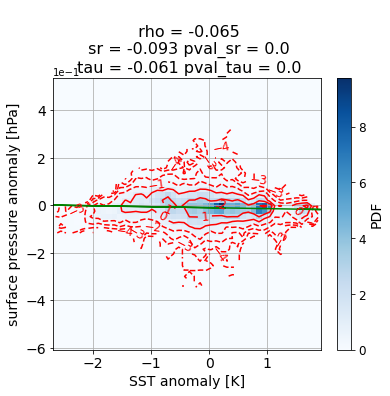

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.38496240601503756
t value spearman r of the distr = 1.7696392765887956
p value spearman r of the distr = 0.04686273169384003
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_00:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


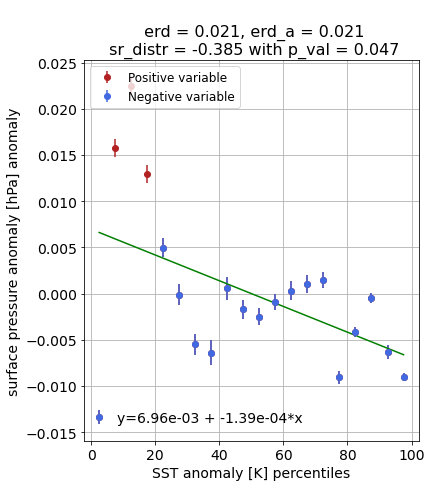

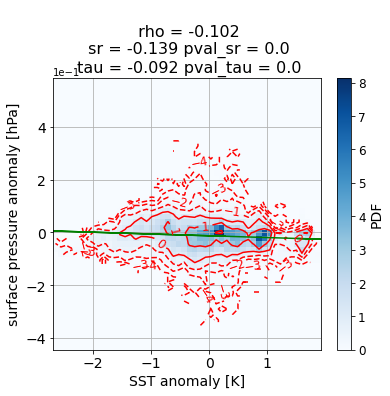

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5052631578947367
t value spearman r of the distr = 2.4840511952701583
p value spearman r of the distr = 0.011529614737087135
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_01:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


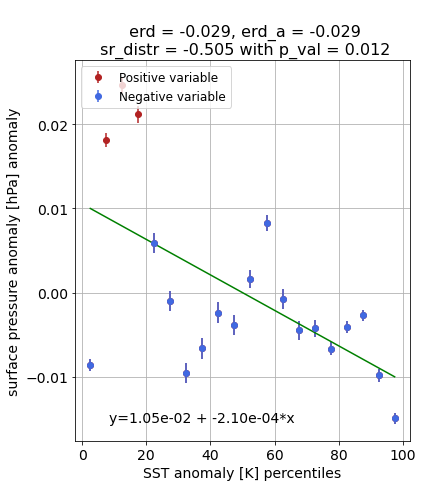

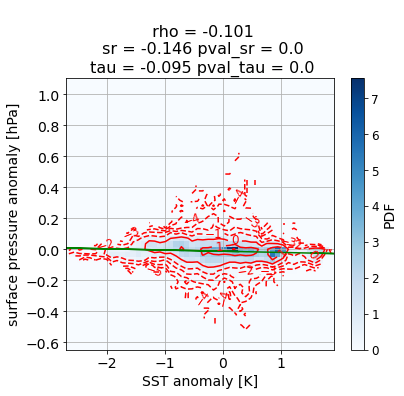

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.4917293233082706
t value spearman r of the distr = 2.395906242061286
p value spearman r of the distr = 0.01382911375652307
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_02:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


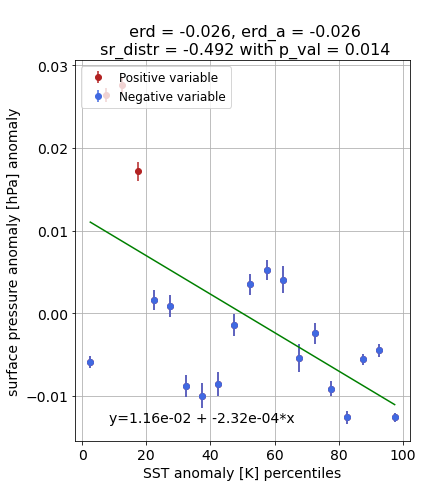

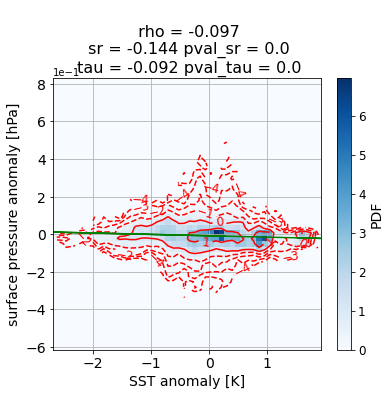

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5984962406015037
t value spearman r of the distr = 3.169546018682814
p value spearman r of the distr = 0.0026529181002094004
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_03:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


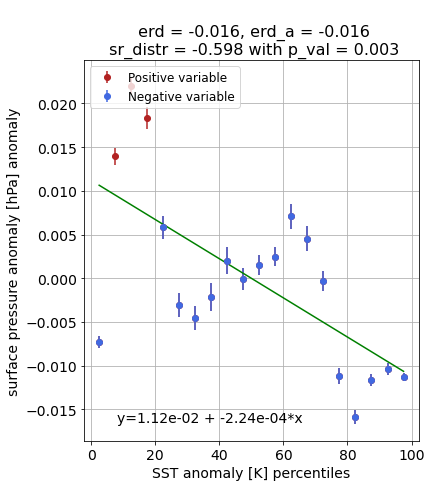

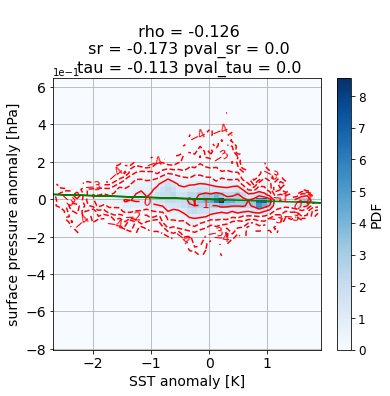

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.6105263157894737
t value spearman r of the distr = 3.2705264717206854
p value spearman r of the distr = 0.002124391325973529
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_04:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


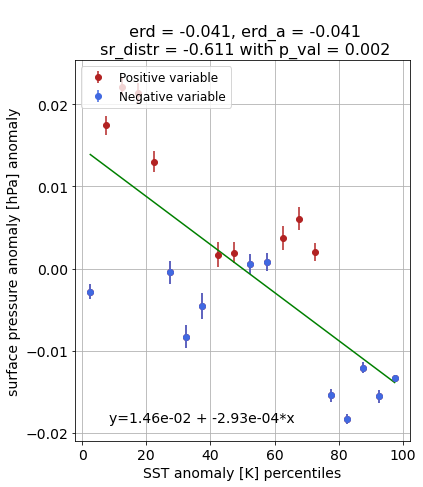

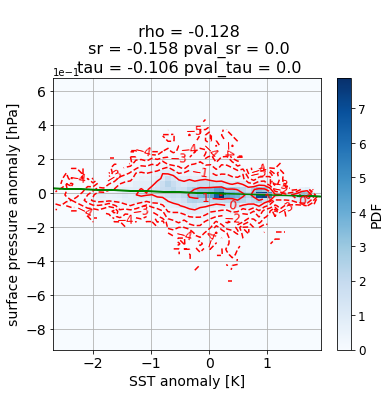

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.6060150375939849
t value spearman r of the distr = 3.232250614456023
p value spearman r of the distr = 0.0023113073353610014
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2756. 2758. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_05:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


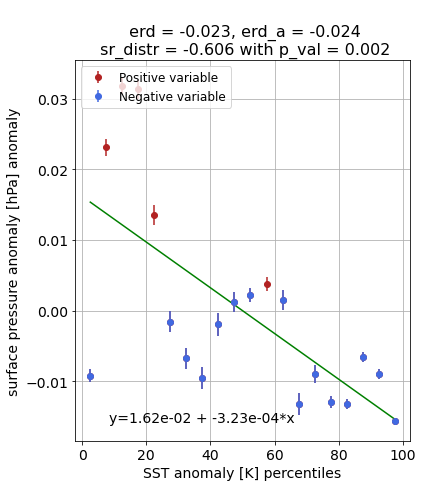

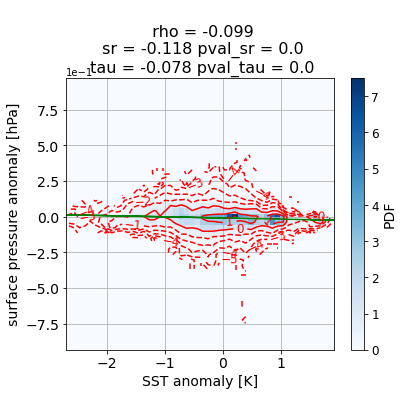

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.6902255639097743
t value spearman r of the distr = 4.046990382288772
p value spearman r of the distr = 0.0003781974189169812
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2758. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_06:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


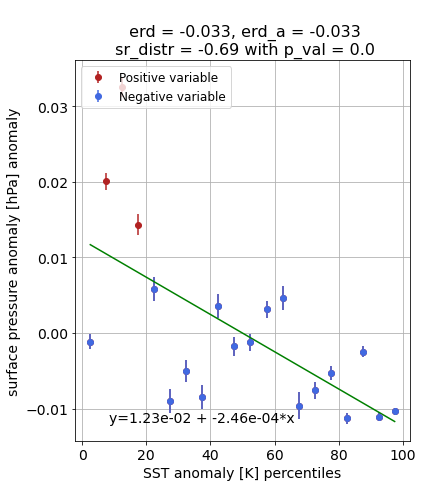

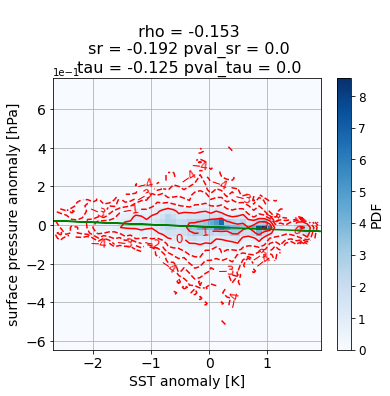

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.7203007518796991
t value spearman r of the distr = 4.405571780312068
p value spearman r of the distr = 0.0001706164478363359
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_07:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


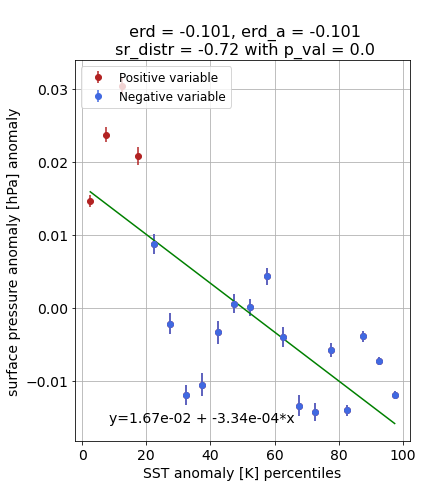

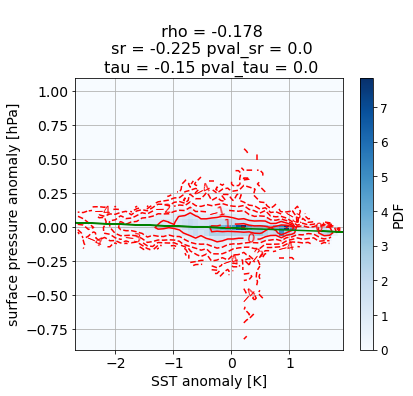

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8481203007518796
t value spearman r of the distr = 6.791703659506551
p value spearman r of the distr = 1.1607151821912964e-06
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2751. 2756. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_08:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


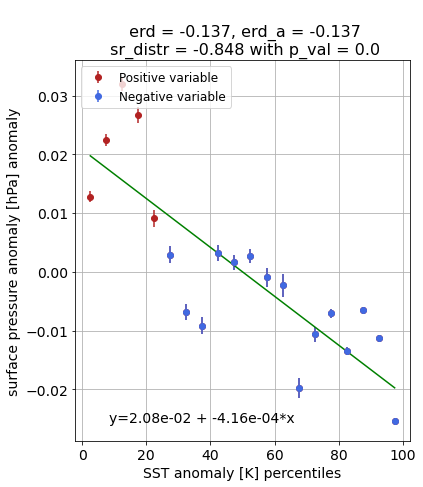

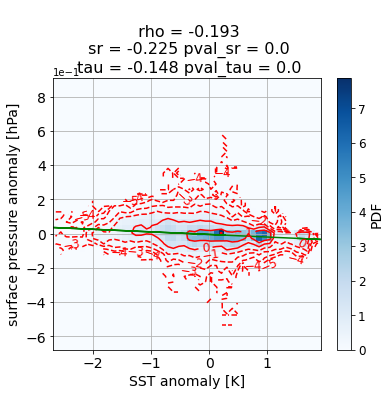

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.9052631578947368
t value spearman r of the distr = 9.040119297115348
p value spearman r of the distr = 2.0609368989177312e-08
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_09:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


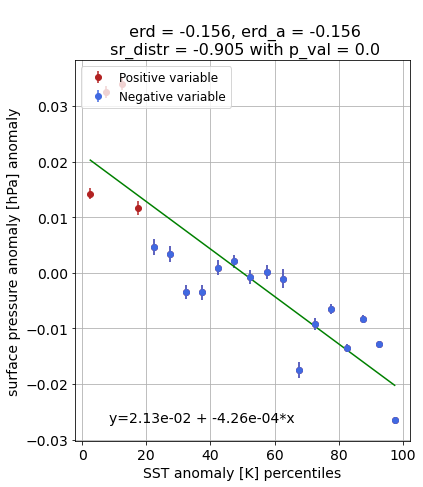

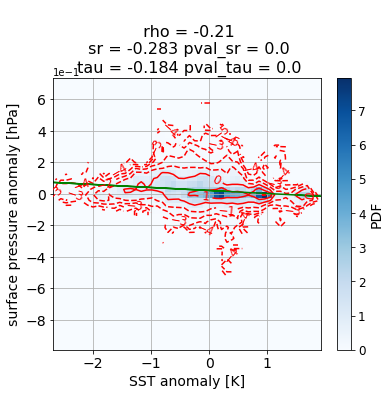

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8661654135338346
t value spearman r of the distr = 7.353224777009601
p value spearman r of the distr = 3.9841280707886284e-07
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2758. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_10:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


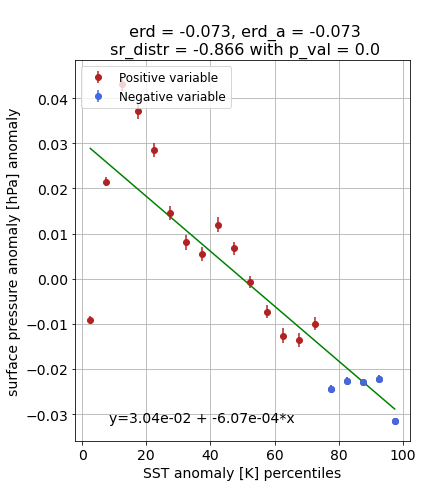

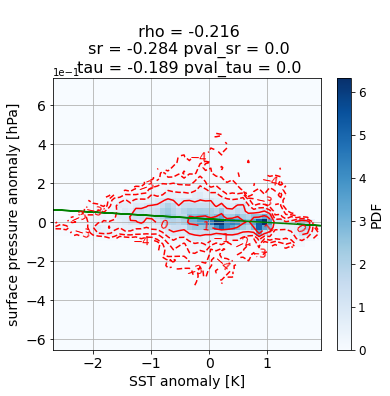

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8481203007518796
t value spearman r of the distr = 6.791703659506551
p value spearman r of the distr = 1.1607151821912964e-06
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_11:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


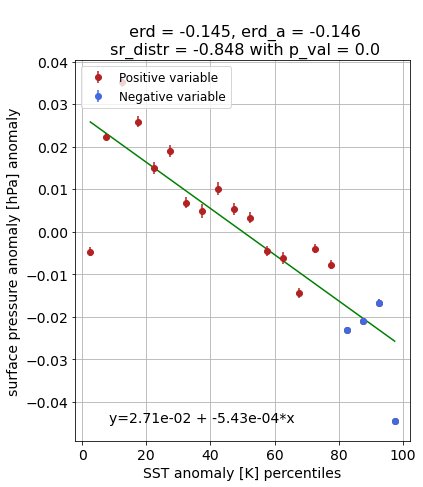

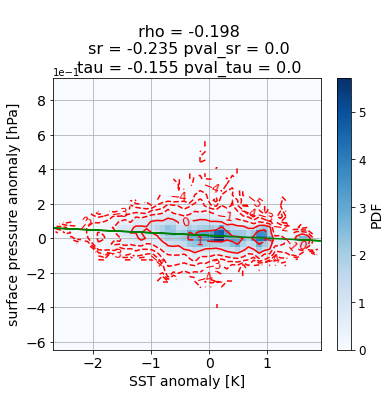

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8616541353383457
t value spearman r of the distr = 7.203385187906013
p value spearman r of the distr = 5.277622665555981e-07
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_12:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


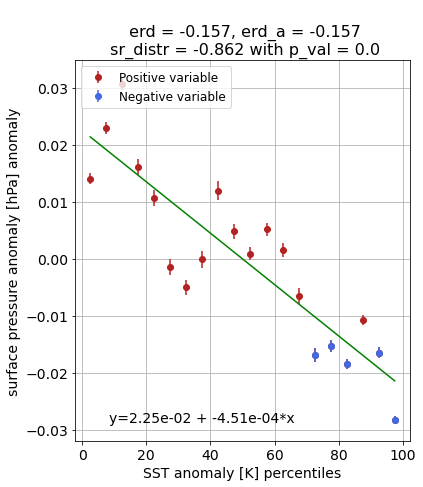

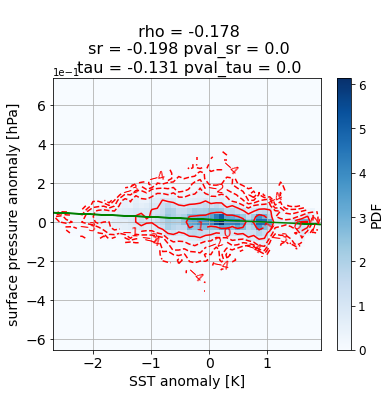

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.8661654135338346
t value spearman r of the distr = 7.353224777009601
p value spearman r of the distr = 3.9841280707886284e-07
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_13:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


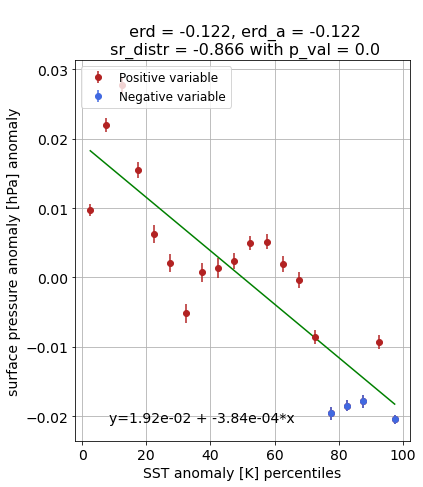

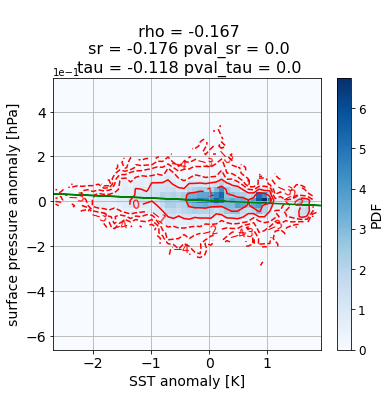

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.706766917293233
t value spearman r of the distr = 4.238565257915897
p value spearman r of the distr = 0.00024702205765747554
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_14:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


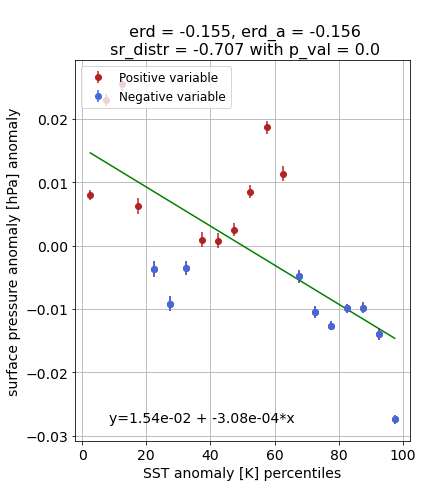

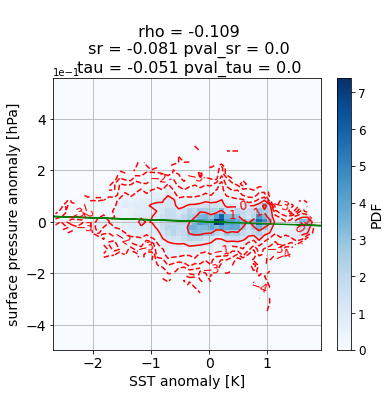

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.2857142857142857
t value spearman r of the distr = 1.2649110640673518
p value spearman r of the distr = 0.11101747446970045
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_15:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


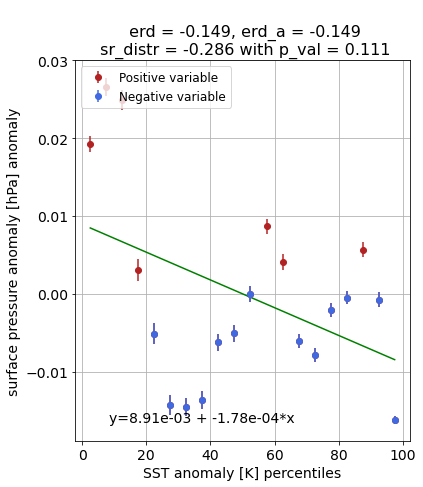

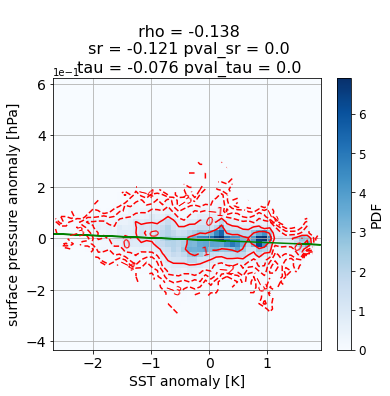

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.24962406015037594
t value spearman r of the distr = 1.0936882741137226
p value spearman r of the distr = 0.14425629484859614
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_16:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


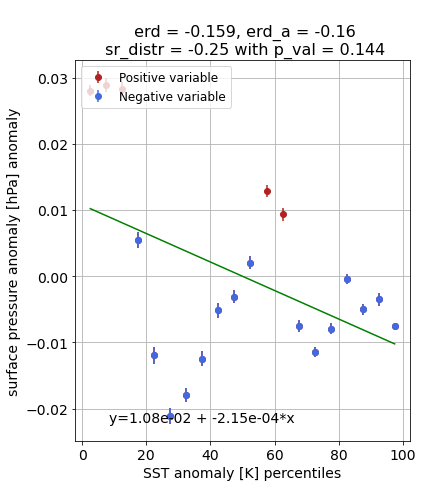

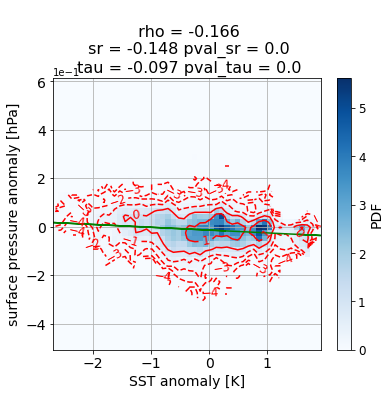

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.26917293233082706
t value spearman r of the distr = 1.1857685449964368
p value spearman r of the distr = 0.12556572684539524
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2758. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_17:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


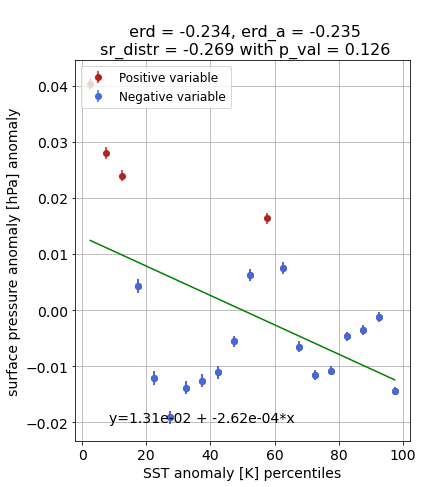

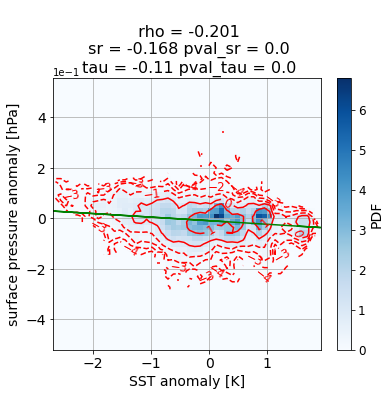

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.35488721804511275
t value spearman r of the distr = 1.6104869645311148
p value spearman r of the distr = 0.0623440637800694
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_18:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


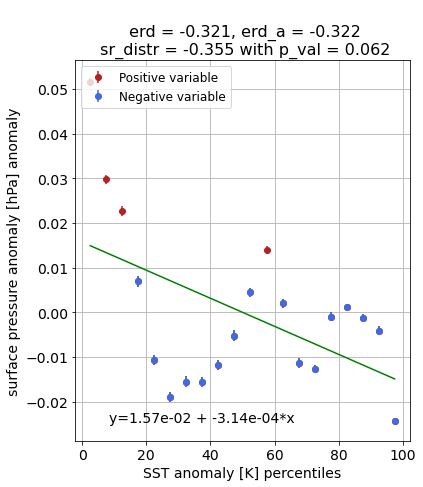

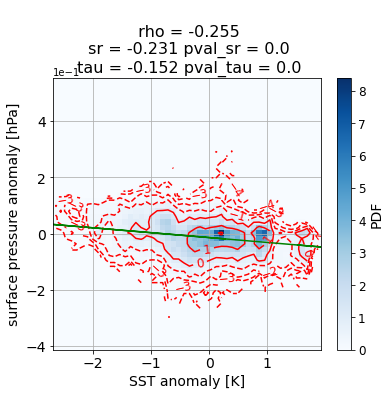

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5157894736842105
t value spearman r of the distr = 2.5543015721991655
p value spearman r of the distr = 0.00995988172985185
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_19:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


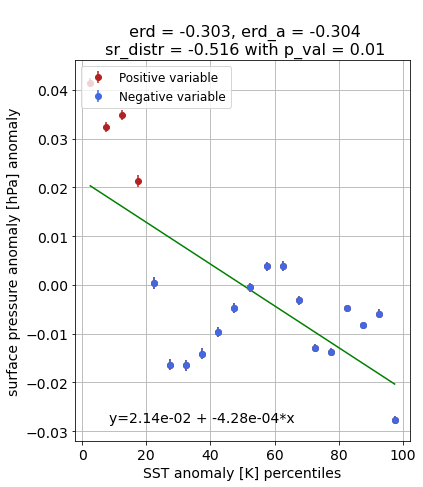

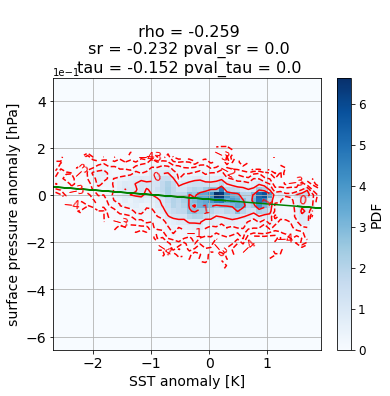

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5142857142857143
t value spearman r of the distr = 2.544171376130346
p value spearman r of the distr = 0.010173064143490285
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_20:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


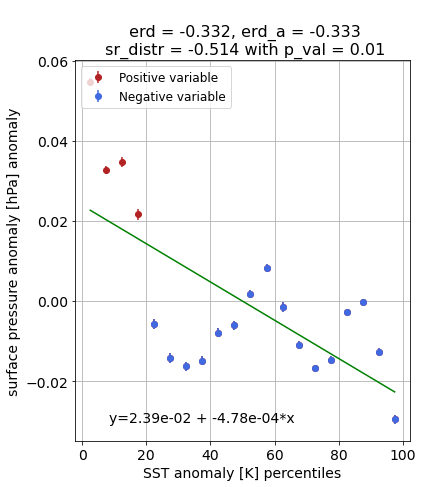

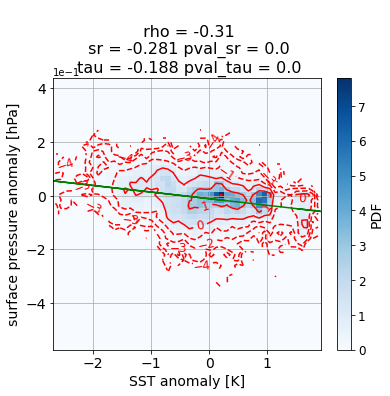

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.5864661654135337
t value spearman r of the distr = 3.0719085509869717
p value spearman r of the distr = 0.0032853091855526984
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_21:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


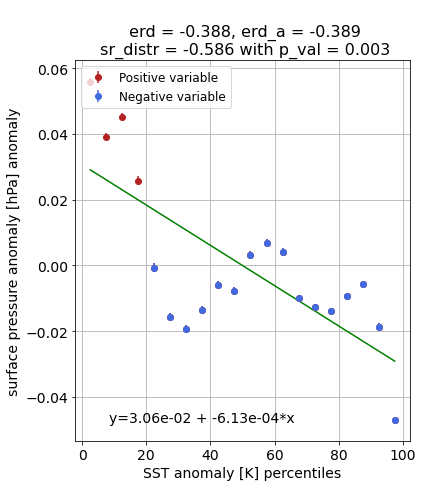

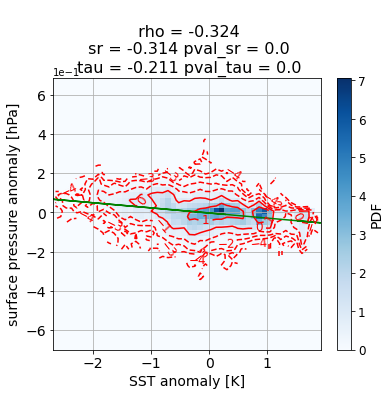

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.6571428571428571
t value spearman r of the distr = 3.698788245190393
p value spearman r of the distr = 0.0008215438021171861
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_22:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


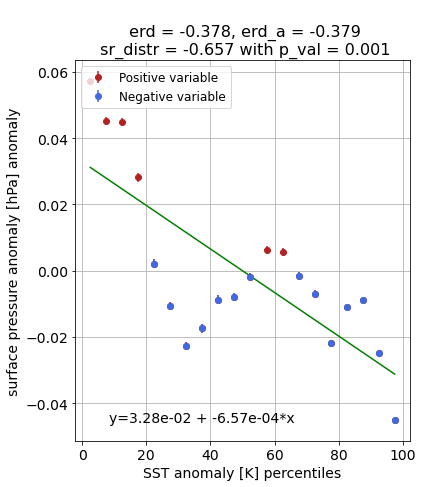

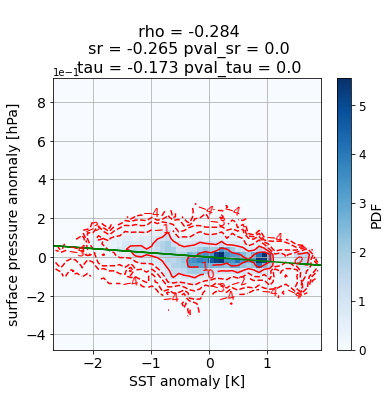

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.6631578947368421
t value spearman r of the distr = 3.759008167730324
p value spearman r of the distr = 0.0007184074325536915
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-09_23:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


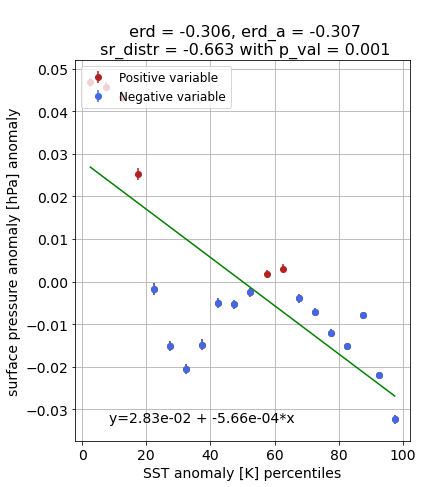

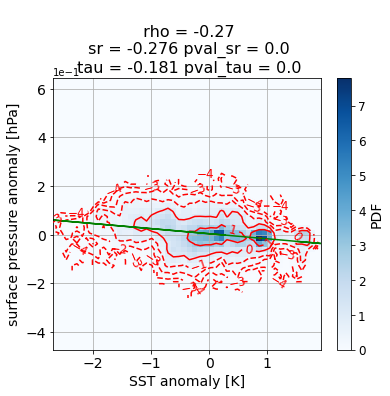

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.7533834586466165
t value spearman r of the distr = 4.860744340495147
p value spearman r of the distr = 6.280607865394305e-05
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.
2014-10-10_00:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


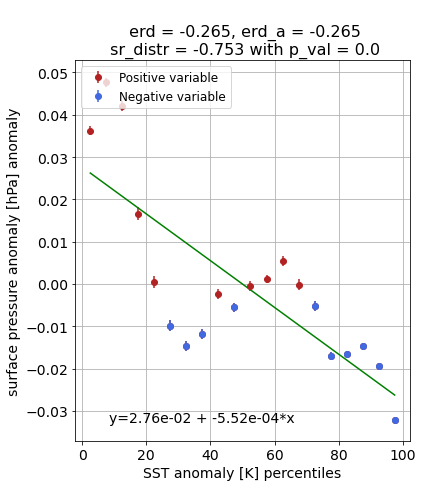

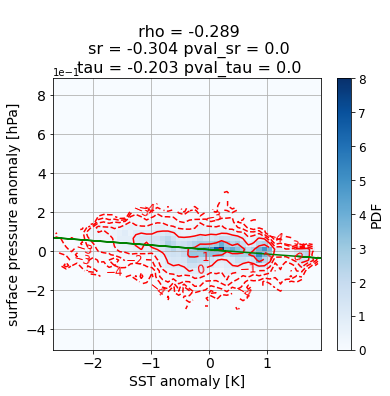

------------------------------------------------------
PERCENTILE DISTRIBUTION
spearman r of the distr = -0.7172932330827068
t value spearman r of the distr = 4.367597965378896
p value spearman r of the distr = 0.00018557046683342904
In the percentile bins there are [2760. 2759. 2759. 2759. 2758. 2760. 2758. 2759. 2760. 2759. 2758. 2761.
 2759. 2759. 2759. 2758. 2759. 2760. 2759. 2759.] points.


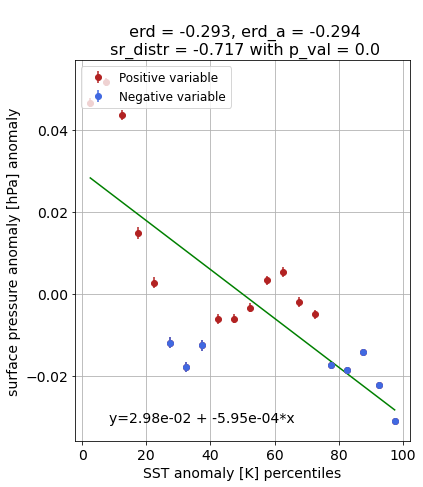

In [12]:
# Calculate the reference correlation using the 3CPLD and the UNIF output fields on a daily basis.
# Save the correlation coefficient between surface pressure and SST anomalies.

first_day = ["2014", "10", "06", "00"]
last_day = ["2014", "10", "10", "00"]
instant_start = np.datetime64(first_day[0]+'-'+first_day[1]+'-'+first_day[2])
instant_end = np.datetime64(last_day[0]+'-'+last_day[1]+'-'+last_day[2])

rho_daily = np.zeros(97) # Fours days [h] plus one.
ws_daily = np.zeros(97)
erd_a_daily = np.zeros(97)
sr_distr_daily = np.zeros(97)
p_val_daily = np.zeros(97)
dd = 0

instant = instant_start
while instant<=instant_end:
    
    YYYY = pd.to_datetime(instant).year
    MM = pd.to_datetime(instant).month
    DD = pd.to_datetime(instant).day
    HH = pd.to_datetime(instant).hour
    
    filename = path2EXP + 'wrfout_d01_' + str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00'
    filenameU = path2UNIF + 'wrfout_d01_' + str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00'

    ds = xr.open_dataset(filename)
    dsU = xr.open_dataset(filenameU)

    # Get some static fields.
    llon = ds.XLONG[0].values
    llat = ds.XLAT[0].values
    landmask = ds.LANDMASK[0].values
    lakemask = ds.LAKEMASK[0].values
    seamask = 1-landmask-lakemask # 1 over the sea, 0 elsewhere
    seamask_nan = seamask; seamask_nan[seamask==0]=np.nan

    # Read surface pressure, 2m air temperature and SST.
    p = ds.PSFC[0].values
    pU = dsU.PSFC[0].values
    delta_p = (p-pU)*seamask_nan/100 #[hPa]
    delta_p[delta_p<-1] = np.nan

    t2 = ds.T2[0].values
    t2U = dsU.T2[0].values
    delta_t2 = (t2-t2U)*seamask_nan
    delta_t2[delta_t2<-5] = np.nan

    sst = ds.SST[0].values
    sstU = dsU.SST[0].values
    delta_sst = (sst - sstU)*seamask_nan
    # There are few outliers: remove them.
    delta_sst[delta_sst<-10] = np.nan

    # Read the wind components and get the wind speed
    u10_grd = ds.U10[0].values
    v10_grd = ds.V10[0].values
    ws_grd = np.sqrt(u10_grd**2+v10_grd**2)
    u10_grdU = dsU.U10[0].values
    v10_grdU = dsU.V10[0].values
    ws_grdU = np.sqrt(u10_grdU**2+v10_grdU**2)
    delta_ws = (ws_grd - ws_grdU)*seamask_nan

    #a = delta_t2; y_string = '2m air temperature anomaly [K]'; varname='t2'
    a = delta_p; y_string = 'surface pressure anomaly [hPa]'; varname='psfc'
    #a = delta_ws; y_string = 'surface wind speed anomaly [m/s]'; varname='ws'
    b = delta_sst; x_string = 'SST anomaly [K]'; controlname='sst'
    #b = delta_p; x_string = 'surface pressure anomaly [hPa]'; varname='psfc'

    print(str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00')
    rho_daily[dd] = plot_a_histogram(b,a,x_string,y_string,controlname,varname)
    ws_daily[dd] = np.nanmean(ws_grd*seamask_nan)
    erd, erd_a, sr_distr, t_value, p_value = percentile_distribution(b,a,x_string,y_string)
    erd_a_daily[dd] = erd_a
    sr_distr_daily[dd] = sr_distr
    p_val_daily[dd] = p_value
    
    dd += 1
    instant += np.timedelta64(1,'h')

# T2 is more correlated with SST than with PSFC. At least in terms of anomalies with respect to the uniform field.
# Check if there is a diurnal cycle in the correlations or if there is a negative trend, meaning that the 
# correlation decreseas going far away from the initial state (i.e. diverging dynamics).

2014-10-06_01:00:00


<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


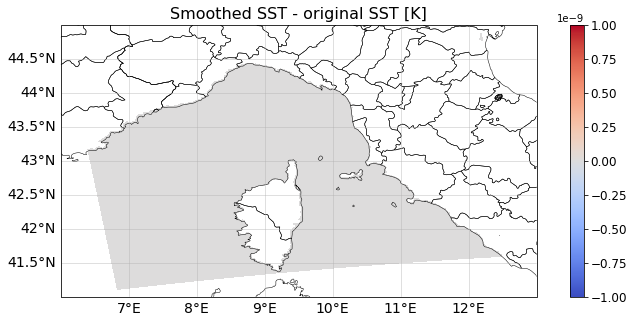

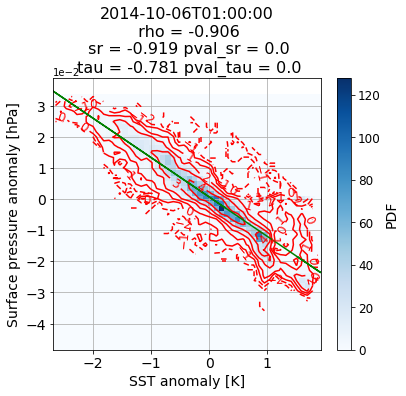

<ipython-input-3-49619acc8e96>:22: RuntimeWarning: divide by zero encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-3-49619acc8e96>:22: RuntimeWarning: invalid value encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-4-77f796127e56>:13: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


2014-10-06_01:00:00


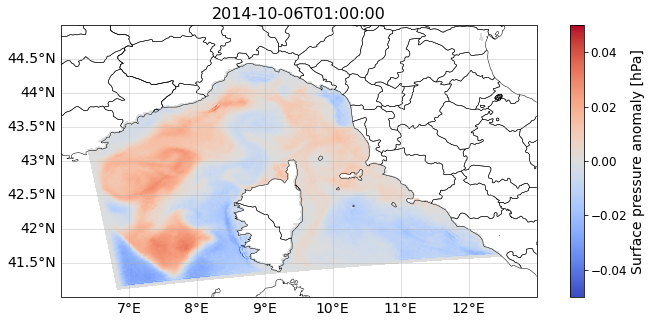

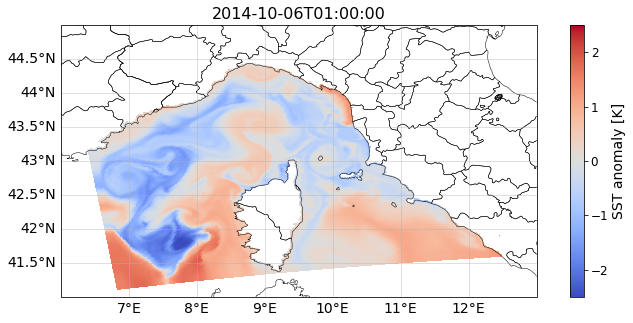

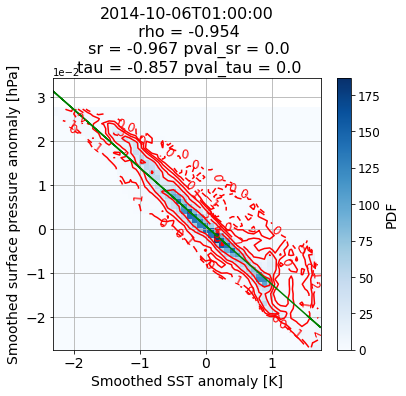

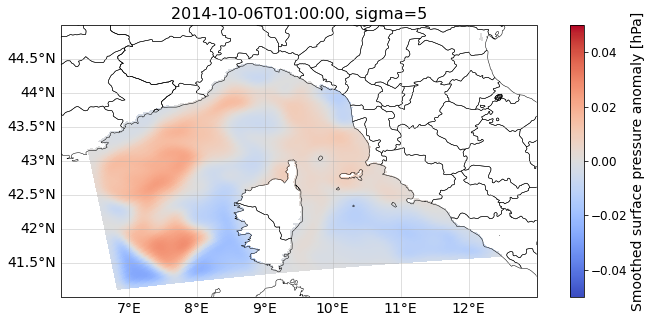

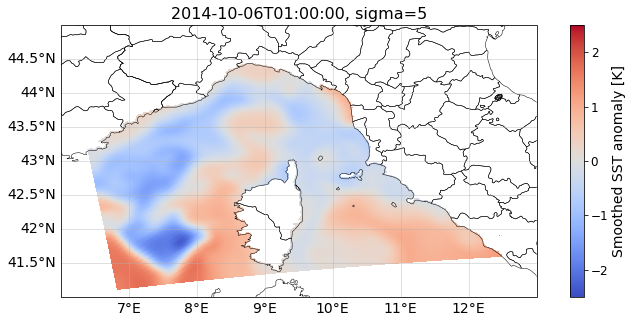

In [54]:
# There is no explicit trend towards zero but in the first 5 hours the correlation appears significantly higher 
# than in the rest of the simulation. We start looking at the instant 2014-10-06_01:00:00, where the correlation
# is very high and the local variations in pressure are due to the SST structures (in agreement with Lambaerts et 
# al., 2013, who show that the PA response is very quick).
# However, the instant is within the spinup period of the model, meaning that the small scale dynamics has not
# developed yet.
# The correlation drops also because many waves develop in the surface pressure field: to remove them we should 
# time average the fields over some hours before taking the correlation coefficient.

str_instant = '2014-10-06T01:00:00'
instant = np.datetime64(str_instant)

YYYY = pd.to_datetime(instant).year
MM = pd.to_datetime(instant).month
DD = pd.to_datetime(instant).day
HH = pd.to_datetime(instant).hour

filename = path2EXP + 'wrfout_d01_' + str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00'
filenameU = path2UNIF + 'wrfout_d01_' + str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00'

ds = xr.open_dataset(filename)
dsU = xr.open_dataset(filenameU)

# Get some static fields.
llon = ds.XLONG[0].values
llat = ds.XLAT[0].values
landmask = ds.LANDMASK[0].values
lakemask = ds.LAKEMASK[0].values
seamask = 1-landmask-lakemask # 1 over the sea, 0 elsewhere
seamask_nan = seamask; seamask_nan[seamask==0]=np.nan

# Read surface pressure, 2m air temperature and SST.
p = ds.PSFC[0].values
pU = dsU.PSFC[0].values
delta_p = (p-pU)*seamask_nan/100 #[hPa]
delta_p[delta_p<-1] = np.nan

t2 = ds.T2[0].values
t2U = dsU.T2[0].values
delta_t2 = (t2-t2U)*seamask_nan
delta_t2[delta_t2<-5] = np.nan

# We need to smooth the SST field, otherwise the SST Laplacian gets noisy.
# We use the same sigma of the filter as prescribed in the WRF lower boundary.
sst_orig = ds.SST[0].astype('double').values
# Note that in the NetCDF files the SST has been saved as a single precision variable. 
# I looked this up with the Matlab function ncdisp. Thus, I try to smooth the SST Laplacian.
#if ~np.isnan(sigma_sst):
#    sst = nan_gaussian_filter(sst_orig*seamask_nan,0.3)
#else:
#    sst = sst_orig
sst = sst_orig
    
fig = plt.figure(figsize=(12., 5.))
ax = fig.add_subplot(1, 1, 1, projection=crs)
plot_background(ax)
pc = ax.pcolor(llon,llat,(sst-sst_orig)*seamask_nan,shading='nearest',cmap='coolwarm',vmin=-1e-9,vmax=1e-9)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
plt.title('Smoothed SST - original SST [K]', fontsize=16)

sstU = dsU.SST[0].values
delta_sst = (sst_orig - sstU)*seamask_nan
# There are few outliers: remove them.
delta_sst[delta_sst<-6] = np.nan

# Read the wind components and get the wind speed
u10_grd = ds.U10[0].values
v10_grd = ds.V10[0].values
ws_grd = np.sqrt(u10_grd**2+v10_grd**2)
u10_grdU = dsU.U10[0].values
v10_grdU = dsU.V10[0].values
ws_grdU = np.sqrt(u10_grdU**2+v10_grdU**2)
delta_ws = (ws_grd - ws_grdU)*seamask_nan

# Rotate the wind to the true Earth coordinates.
cosalpha = ds.COSALPHA[0].values
sinalpha = ds.COSALPHA[0].values
u10 = u10_grd*cosalpha - v10_grd*sinalpha
v10 = u10_grd*sinalpha + v10_grd*cosalpha

# Calculate the difference of the components of the wind from the current experiments and the wind from the UNIF
# experiment.
cosalphaU = dsU.COSALPHA[0].values
sinalphaU = dsU.COSALPHA[0].values
u10U = u10_grdU*cosalphaU - v10_grdU*sinalphaU
v10U = u10_grdU*sinalphaU + v10_grdU*cosalphaU

hat_u10 = u10-u10U
hat_v10 = v10-v10U

# Look at the PBLH.
pblh = ds.PBLH[0].values
pblhU = dsU.PBLH[0].values
delta_pblh = pblh-pblhU

# See some correlation.

#a = delta_t2; y_string = '2m air temperature anomaly [K]'; varname='t2'
a = delta_p; y_string = 'Surface pressure anomaly [hPa]'; varname='psfc'
#a = delta_ws; y_string = 'surface wind speed anomaly [m/s]'; varname='ws'
b = delta_sst; x_string = 'SST anomaly [K]'; controlname='sst'
#b = delta_p; x_string = 'surface pressure anomaly [hPa]'; varname='psfc'

print(str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00')
plot_a_histogram(b,a,x_string,y_string,controlname,varname,title=str_instant)

fig = plt.figure(figsize=(12., 5.))
ax = fig.add_subplot(1, 1, 1, projection=crs)
plot_background(ax)
pc = ax.pcolor(llon,llat,delta_p*seamask_nan,shading='nearest',cmap='coolwarm',vmin=-0.05,vmax=0.05)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
cbar.set_label(y_string,size=14)
plt.title(str_instant, fontsize=16)

figure_name = 'map_' + varname + '_' + str_instant + '_' + experiment + '.png'
plt.savefig(figure_name,bbox_inches='tight')

fig = plt.figure(figsize=(12., 5.))
ax = fig.add_subplot(1, 1, 1, projection=crs)
plot_background(ax)
pc = ax.pcolor(llon,llat,delta_sst*seamask_nan,shading='nearest',cmap='coolwarm',vmin=-2.5,vmax=2.5)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
cbar.set_label(x_string,size=14)
plt.title(str_instant, fontsize=16)

figure_name = 'map_' + controlname + '_' + str_instant + '_' + experiment + '.png'
plt.savefig(figure_name,bbox_inches='tight')

# Try to filter the fields.

sigma_delta = 5
smooth_delta_p = nan_gaussian_filter(delta_p*seamask_nan, sigma=sigma_delta)
smooth_delta_sst = nan_gaussian_filter(delta_sst*seamask_nan, sigma=sigma_delta)

a = smooth_delta_p; y_string = 'Smoothed surface pressure anomaly [hPa]'; varname='sm_psfc'
b = smooth_delta_sst; x_string = 'Smoothed SST anomaly [K]'; controlname='sm_sst'
a[np.isinf(a)] = np.nan
b[np.isinf(b)] = np.nan
print(str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00')
plot_a_histogram(b,a,x_string,y_string,controlname,varname,title=str_instant)

In [55]:
# Create a coastal mask to remove the points near the coasts.
# With N = 31 centered points this corresponds to removing (N-1)/2*dx = 15*1.4 km = 21 km from all the coasts.
# This also removes some points at the edges of the domain, which is good because they contain some sponge effects.

coastal_mask = np.zeros(np.shape(seamask_nan))

for ii in range(np.size(seamask_nan,0)):
    for jj in range(np.size(seamask_nan,1)):
        ind_ii = range(ii-15,ii+16)
        ind_jj = range(jj-15,jj+16)
        coastal_mask[ii,jj] = seamask_nan.take(ind_ii,axis=0,mode='wrap').take(ind_jj,axis=1,mode='wrap').mean()

29105
LinregressResult(slope=-0.013248785643686535, intercept=0.000962778542539794, rvalue=-0.9403394944408159, pvalue=0.0, stderr=2.8099904464017035e-05, intercept_stderr=2.527731624790474e-05)


<ipython-input-62-182f014dee69>:34: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


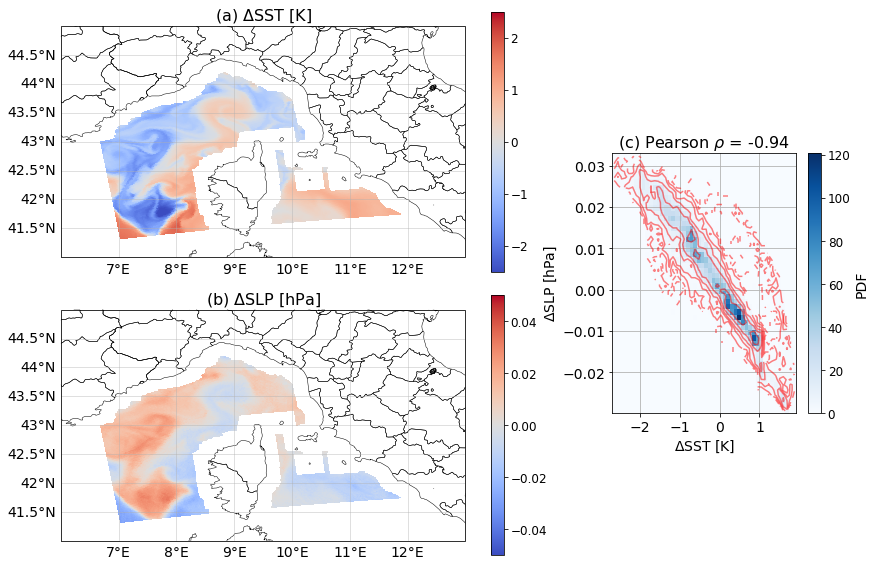

In [62]:
##### MANUSCRIPT FIGURE
##### With experiment = 'FS_CONST' and str_instant = '2014-10-06T01:00:00' this is figure 2 of the manuscript.

fig = plt.figure(figsize=(14,10))

gs = GridSpec(4, 3, figure=fig)
ax1 = fig.add_subplot(gs[:2, :2], projection=crs)
plot_background(ax1)
pc = ax1.pcolor(llon,llat,delta_sst*coastal_mask,shading='nearest',cmap='coolwarm',vmin=-2.5,vmax=2.5)
ax1.set_xticks([])
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
#cbar.set_label('[K]',size=14)
plt.title('(a) $\Delta$SST [K]', fontsize=16)

ax2 = fig.add_subplot(gs[2:, :2], projection=crs)
plot_background(ax2)
pc = ax2.pcolor(llon,llat,delta_p*coastal_mask,shading='nearest',cmap='coolwarm',vmin=-0.05,vmax=0.05)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
#cbar.set_label('[hPa]',size=14)
plt.title('(b) $\Delta$SLP [hPa]', fontsize=16)

ax3 = fig.add_subplot(gs[1:-1, 2:])
x = delta_sst*coastal_mask
y = delta_p*coastal_mask
x, y = x[(~np.isnan(x))&(~np.isnan(y))], y[(~np.isnan(x))&(~np.isnan(y))]
    
H, xedges, yedges = np.histogram2d(x, y, bins=50, density=True)
print(len(x))

X, Y = np.meshgrid(xedges, yedges)
pc = ax3.pcolormesh(X, Y, H.T,cmap='Blues')
cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',
                levels=np.arange(-100,100),alpha=0.5)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
cbar.set_label('PDF',size=14)
ax3.grid()

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#plt.ticklabel_format(axis="both", style="sci", scilimits=(0,0))

plt.xlabel('$\Delta$SST [K]',fontsize=14)
plt.ylabel('$\Delta$SLP [hPa]',fontsize=14)

rho = np.corrcoef([x,y])
sr,pval_sr = stats.spearmanr(x,y)
tau,pval_tau = stats.kendalltau(x,y)
    
lsq_res = stats.linregress(x, y)
print(lsq_res)
#ax3.plot(x, lsq_res[1] + lsq_res[0] * x, 'g-')
    
str_title = '(c) Pearson $\\rho$ = '+ str(np.round(rho[0,1]*1000)/1000)
ax3.set_title(str_title, fontsize=16)    

figure_name = 'fig2.pdf'#'fig2_' + str_instant + '_' + experiment + '.png'
plt.savefig(figure_name,bbox_inches='tight',dpi=300)

In [56]:
# Before looking at the dependence on the background wind speed, check how the standard and the new metrics behave
# with respect to the explicit PA response.

# In the script eureca_case_studies_longer_statistics I use sigma = 20*5 km = 100 km. 
# To be on the same scale we would basically filter over the entire domain, which we can try to do setting
# sigma = 70, so that, in km it is sigma = 70*1.4 km = 98 km. However, this appears to be over a too large scale,
# and thus I try with the same number of grid point, i.e. 20. It is still a very smooth field, thus I try with 
# sigma = 10.
sigma = 10#30
smooth_u = nan_gaussian_filter(u10*seamask_nan, sigma=sigma)
smooth_v = nan_gaussian_filter(v10*seamask_nan, sigma=sigma)
# I try to average over the entire numerical domain.
#smooth_u = np.nanmean(u10*seamask_nan)*u10/u10
#smooth_v = np.nanmean(v10*seamask_nan)*v10/v10
smooth_ws = np.sqrt(smooth_u**2+smooth_v**2)

sigma_new = 2 # This is the sigma of the filter to remove the numerical noise.
# I use a small scale filter, just to remove the noise. The difference introduced by this filter can be seen in
# the maps produced in the next section.
# For the SM set of simulations the Laplacian should be a very smoothj field, anyway.

u_prime = u10-smooth_u
v_prime = v10-smooth_v

div = div_sphere(u10,v10,llon,llat)
div_prime = div_sphere(u_prime,v_prime,llon,llat)
smooth_div = div_sphere(smooth_u,smooth_v,llon,llat)
stretched_div = stretched_div_sphere(u10,v10,llon,llat,smooth_u,smooth_v)
stretched_div_prime = stretched_div_sphere(u_prime,v_prime,llon,llat,smooth_u,smooth_v)

dsst_dx, dsst_dy = grad_sphere(sst,llon,llat)
lapl_sst = div_sphere(dsst_dx,dsst_dy,llon,llat)
new_lapl_sst = nan_gaussian_filter(lapl_sst*seamask_nan,sigma_new) 

smooth_sst = nan_gaussian_filter(sst*seamask_nan, sigma=sigma)
sm_dsst_dx, sm_dsst_dy = grad_sphere(smooth_sst,llon,llat)
smooth_lapl_sst = div_sphere(sm_dsst_dx,sm_dsst_dy,llon,llat)
stretched_lapl = stretched_div_sphere(dsst_dx,dsst_dy,llon,llat,smooth_u,smooth_v)

cosphi = smooth_u/smooth_ws
sinphi = smooth_v/smooth_ws

r_dot_prime = u_prime*cosphi + v_prime*sinphi
dr_dot_prime_dx, dr_dot_prime_dy = grad_sphere(r_dot_prime,llon,llat)
dr_dot_prime_dr = dr_dot_prime_dx*cosphi + dr_dot_prime_dy*sinphi

s_dot_prime = -u_prime*sinphi + v_prime*cosphi
ds_dot_prime_dx, ds_dot_prime_dy = grad_sphere(s_dot_prime,llon,llat)
ds_dot_prime_ds = -ds_dot_prime_dx*sinphi + ds_dot_prime_dy*cosphi

dsst_dx, dsst_dy = grad_sphere(sst,llon,llat)
dsst_dr = dsst_dx*cosphi + dsst_dy*sinphi
ddsst_dr_dx, ddsst_dr_dy = grad_sphere(dsst_dr,llon,llat)
d2sst_dr2 = ddsst_dr_dx*cosphi + ddsst_dr_dy*sinphi
dsst_ds = -dsst_dx*sinphi + dsst_dy*cosphi
ddsst_ds_dx, ddsst_ds_dy = grad_sphere(dsst_ds,llon,llat)
d2sst_ds2 = -ddsst_ds_dx*sinphi + ddsst_ds_dy*cosphi
new_d2sst_ds2 = nan_gaussian_filter(d2sst_ds2*seamask_nan,sigma_new)

# Consider also the wind difference with respect to the UNIF simulation.

smooth_hat_u = nan_gaussian_filter(hat_u10*seamask_nan, sigma=sigma)
smooth_hat_v = nan_gaussian_filter(hat_v10*seamask_nan, sigma=sigma)
hat_smooth_div = div_sphere(smooth_hat_u,smooth_hat_v,llon,llat)

hat_div = div_sphere(hat_u10,hat_v10,llon,llat)
hat_stretched_div = stretched_div_sphere(hat_u10,hat_v10,llon,llat,smooth_u,smooth_v)

hat_s_dot = -hat_u10*sinphi + hat_v10*cosphi
hat_ds_dot_dx, hat_ds_dot_dy = grad_sphere(hat_s_dot,llon,llat)
hat_ds_dot_ds = -hat_ds_dot_dx*sinphi + hat_ds_dot_dy*cosphi

<ipython-input-3-49619acc8e96>:22: RuntimeWarning: divide by zero encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-3-49619acc8e96>:22: RuntimeWarning: invalid value encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-2-bb09044d123a>:36: RuntimeWarning: invalid value encountered in subtract
  div_a = field_a-field_a
<ipython-input-2-bb09044d123a>:37: RuntimeWarning: invalid value encountered in subtract
  div_a[:,1:-1] = (field_a[:,2:]-field_a[:,:-2])/(R*costheta[:,1:-1]*(llon[:,2:]-llon[:,:-2])*np.pi/180)
<ipython-input-2-bb09044d123a>:38: RuntimeWarning: invalid value encountered in subtract
  div_a[:,0] = (field_a[:,1]-field_a[:,0])/(R*costheta[:,0]*(llon[:,1]-llon[:,0])*np.pi/180)
<ipython-input-2-bb09044d123a>:39: RuntimeWarning: invalid value encountered in subtract
  div_a[:,-1] =

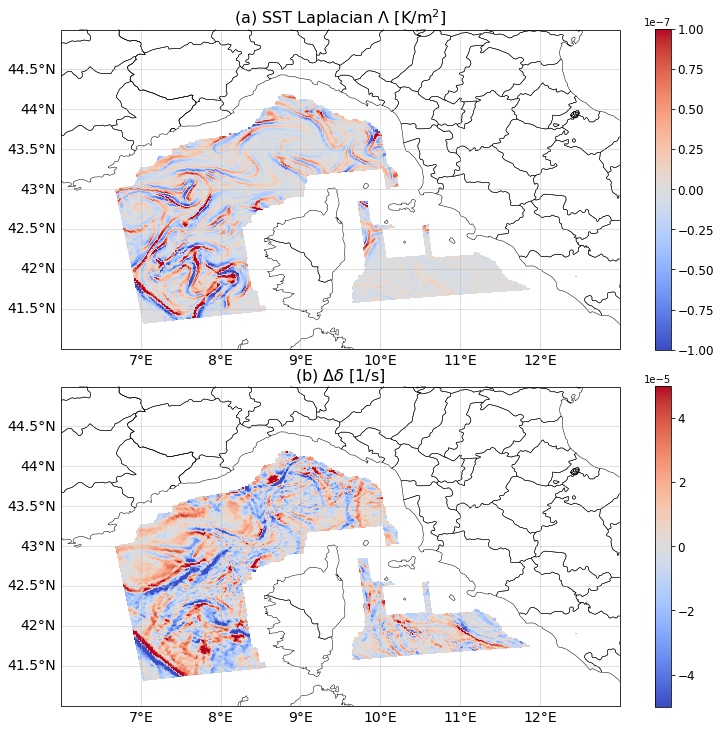

In [24]:
##### FIGURE FOR THE REVIEWERS COMMENTS

fig = plt.figure(figsize=(10,10))#(14,10))

x = lapl_sst*coastal_mask; xstr = 'SST Laplacian $\Lambda$ [K/m$^2$]'
y = hat_div*coastal_mask; ystr = '$\Delta\delta$ [1/s]'
#y = hat_ds_dot_ds*coastal_mask; ystr = '$\Delta\delta_s$ [1/s]'

gs = GridSpec(4, 2, figure=fig)# 3 instead of 2
ax1 = fig.add_subplot(gs[:2, :2], projection=crs)
plot_background(ax1)
pc = ax1.pcolor(llon,llat,x,shading='nearest',cmap='coolwarm',vmin=-1e-7,vmax=1e-7)
ax1.set_xticks([])
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
#cbar.set_label('[K]',size=14)
plt.title('(a) '+xstr, fontsize=16)

ax2 = fig.add_subplot(gs[2:, :2], projection=crs)
plot_background(ax2)
pc = ax2.pcolor(llon,llat,y,shading='nearest',cmap='coolwarm',vmin=-0.5e-4,vmax=0.5e-4)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
#cbar.set_label('[hPa]',size=14)
plt.title('(b) '+ystr, fontsize=16)

plt.tight_layout()

figure_name = 'fig_maps_delta_div_' + str_instant + '_' + experiment + '.png'
plt.savefig(figure_name,bbox_inches='tight')

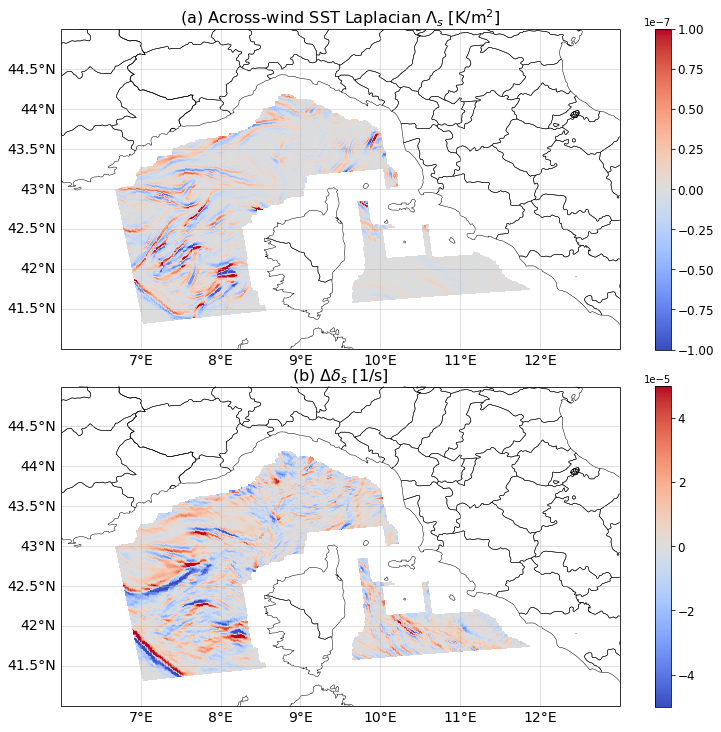

In [43]:
##### MANUSCRIPT FIGURE
##### With experiment = 'FS_CONST' and str_instant = '2014-10-06T01:00:00' this is figure 2 of the manuscript.

fig = plt.figure(figsize=(10,10))#(14,10))

x = d2sst_ds2*coastal_mask; xstr = 'Across-wind SST Laplacian $\Lambda_s$ [K/m$^2$]'
y = hat_div*coastal_mask; ystr = '$\Delta\delta$ [1/s]'
y = hat_ds_dot_ds*coastal_mask; ystr = '$\Delta\delta_s$ [1/s]'

gs = GridSpec(4, 2, figure=fig)# 3 instead of 2
ax1 = fig.add_subplot(gs[:2, :2], projection=crs)
plot_background(ax1)
pc = ax1.pcolor(llon,llat,x,shading='nearest',cmap='coolwarm',vmin=-1e-7,vmax=1e-7)
ax1.set_xticks([])
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
#cbar.set_label('[K]',size=14)
plt.title('(a) '+xstr, fontsize=16)

ax2 = fig.add_subplot(gs[2:, :2], projection=crs)
plot_background(ax2)
pc = ax2.pcolor(llon,llat,y,shading='nearest',cmap='coolwarm',vmin=-0.5e-4,vmax=0.5e-4)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
#cbar.set_label('[hPa]',size=14)
plt.title('(b) '+ystr, fontsize=16)

plt.tight_layout()

figure_name = 'fig6.pdf'#'fig_maps_across_' + str_instant + '_' + experiment + '.png'
plt.savefig(figure_name,bbox_inches='tight',dpi=300)

In [57]:
def plot_2d_distr_manuscript(ax,x,y,xstr,ystr,letter='a',extratitle=''):
    
    x, y = x[(~np.isnan(x))&(~np.isnan(y))], y[(~np.isnan(x))&(~np.isnan(y))]
    
    H, xedges, yedges = np.histogram2d(x, y, bins=50, density=True)
    X, Y = np.meshgrid(xedges, yedges)
    pc = ax.pcolormesh(X, Y, H.T,cmap='Blues')
    cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',
                levels=np.arange(-100,100),alpha=0.5)
    cbar = plt.colorbar(pc)
    cbar.ax.tick_params(labelsize=12) 
    #cbar.set_label('PDF',size=14)
    ax.grid()

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.ticklabel_format(axis="both", style="sci", scilimits=(0,0))

    ax.set_xlabel(xstr,fontsize=14)
    ax.set_ylabel(ystr,fontsize=14)

    rho = np.corrcoef([x,y])

    lsq_res = stats.linregress(x, y)
    print(lsq_res)
    
    # Sometimes you do not want to add the lines and the equation...
    ax.plot(x, lsq_res[1] + lsq_res[0] * x, 'g-')
    
    float_formatter = "{:.2e}".format
#    ax.annotate('y=' + str(float_formatter(lsq_res[1])) + ' + ' + str(float_formatter(lsq_res[0])) + '*x', xy=(0.1, 0.05), xycoords='axes fraction', fontsize=14)
    ax.annotate('slope=' + str(float_formatter(lsq_res[0])), xy=(0.1, 0.05), xycoords='axes fraction', fontsize=14)

    str_title = '('+letter+')'  + extratitle + ' Pearson $\\rho$ = '+ str(np.round(rho[0,1]*1000)/1000)
    ax.set_title(str_title, fontsize=16, y=1.03)    
    return ax

def plot_perc_distr_manuscript(ax,control,variable,perc_step,xstr,ystr,letter='b',extratitle=''):

    mean = np.nanmean(variable)
    mean_control = np.nanmean(control)
    std = np.nanstd(variable)
    std_control = np.nanstd(control)

    distribution = np.zeros(int(100/perc_step))
    std_distribution = np.zeros(int(100/perc_step))
    std_err_distribution = np.zeros(int(100/perc_step))
    #distribution_control = np.zeros(int(100/perc_step))
    negative = np.zeros(int(100/perc_step), dtype=bool)
    number_of_points = np.zeros(int(100/perc_step))
    percentiles = np.zeros(int(100/perc_step)+1)
    zero_not_found = 1
    print('x-variable is negative until')

    for pp in range(0,100,perc_step):
        qq = int(pp/perc_step)
        lower = np.percentile(control[~np.isnan(control)],pp)
        upper = np.percentile(control[~np.isnan(control)],pp+perc_step)
        percentiles[qq] = lower
        cond_mean = np.nanmean(variable[(control>=lower)&(control<upper)])
        cond_std = np.nanstd(variable[(control>=lower)&(control<upper)])
        cond_mean_control = np.nanmean(control[(control>=lower)&(control<upper)])
        if zero_not_found:
            print(str(pp)+' percentile')
            if cond_mean_control>0:
                qq0 = qq # Index of the first positive cond_mean_control
                zero_not_found = 0
        distribution[qq] = cond_mean#-mean # We do not remove the sample mean.
        std_distribution[qq] = cond_std
        #distribution_control[qq] = cond_mean_control-mean_control
        number_of_points[qq] = np.sum(~np.isnan(variable[(control>=lower)&(control<upper)]))
        std_err_distribution[qq] = std_distribution[qq]/np.sqrt(number_of_points[qq])
        if cond_mean<0:
            negative[qq] = 1
    percentiles[-1] = upper

    perc = np.arange(perc_step/2,100,perc_step)
    ax.errorbar(perc[~negative],distribution[~negative],std_err_distribution[~negative],fmt='^',color='firebrick')
    ax.errorbar(perc[negative],distribution[negative],std_err_distribution[negative],fmt='v',color='royalblue') # Blue the variable is negative
    xlimiti = ax.get_xlim()
    ylimiti = ax.get_ylim()
    ax.hlines(mean,xlimiti[0],xlimiti[1],'k',linestyles='--')
    ax.vlines(0.5*(perc[qq0-1]+perc[qq0]),ylimiti[0],ylimiti[1],'k')
    #plt.legend(['Positive variable','Negative variable'], fontsize=12,loc='upper left')
    plt.ticklabel_format(axis='y', style="sci", scilimits=(0,0))
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlabel(xstr,fontsize=14)
    plt.ylabel(ystr,fontsize=14)
    plt.grid()
    #cbar = plt.colorbar()

    # Calculate the spearman r
    percentiles_center = 0.5*(percentiles[:-1]+percentiles[1:])
    sr_distr, trash = stats.spearmanr(perc,distribution)
    df = len(perc)-2 # degrees of freedom.
    t_value = np.abs(sr_distr)*np.sqrt((df)/(1-sr_distr**2))
    #p-value after comparison with the t 
    p_value = 1 - stats.t.cdf(t_value,df=df)

    str_title = _a = '('+letter+')'  + extratitle + ' Spearman $r$ = '+ str(np.round(sr_distr*100)/100) +' (p = ' + str(np.round(p_value*100)/100) + ')'
    ax.set_title(str_title, fontsize=16, y=1.03)

<ipython-input-57-fe3f29faf9a6>:8: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


LinregressResult(slope=72.0231609416706, intercept=-3.583313913588323e-05, rvalue=0.02559765457970381, pvalue=1.2565614001086508e-05, stderr=16.48772721593336, intercept_stderr=5.682954396568073e-07)
x-variable is negative until
0 percentile
5 percentile
10 percentile
15 percentile
20 percentile
25 percentile
30 percentile
35 percentile
40 percentile
45 percentile
50 percentile
55 percentile


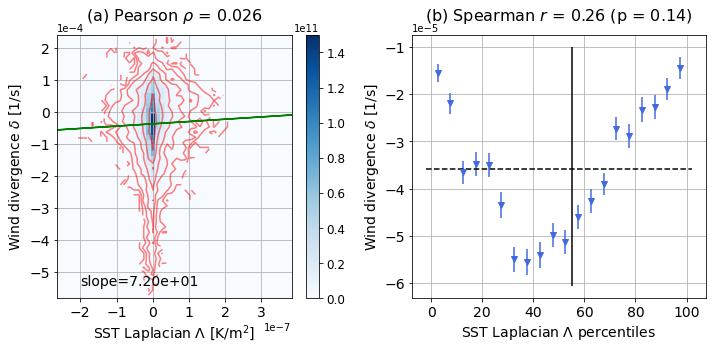

In [58]:
##### MANUSCRIPT FIGURE
##### With experiment = 'FS_CONST' and str_instant = '2014-10-06T01:00:00' this is figure 3 of the manuscript.

fig = plt.figure(figsize=(10,5))
gs = GridSpec(1, 2, figure=fig)

ax1 = fig.add_subplot(121)#gs[0, 0])
x = lapl_sst*coastal_mask
y = div*coastal_mask
xstr = 'SST Laplacian $\Lambda$ [K/m$^2$]'
ystr = 'Wind divergence $\delta$ [1/s]'
plot_2d_distr_manuscript(ax1,x,y,xstr,ystr)

ax2 = fig.add_subplot(122)#gs[0, 1])
perc_step = 5
xstr = 'SST Laplacian $\Lambda$ percentiles'
plot_perc_distr_manuscript(ax2,x,y,perc_step,xstr,ystr)
   
plt.tight_layout()   

figure_name = 'fig3.pdf'#'fig3_' + str_instant + '_' + experiment + '.png'
plt.savefig(figure_name,bbox_inches='tight',dpi=300)

<ipython-input-57-fe3f29faf9a6>:8: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',
<ipython-input-57-fe3f29faf9a6>:8: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


LinregressResult(slope=58.26818398271269, intercept=2.11131324424437e-06, rvalue=0.03844073408942899, pvalue=5.373413784407889e-11, stderr=8.878708891987285, intercept_stderr=1.921062385403279e-07)
x-variable is negative until
0 percentile
5 percentile
10 percentile
15 percentile
20 percentile
25 percentile
30 percentile
35 percentile
40 percentile
45 percentile
50 percentile
55 percentile
LinregressResult(slope=7.041348394406079, intercept=-8.639176017946554e-05, rvalue=0.0031093382300074355, pvalue=0.5958086776001537, stderr=13.274460739040792, intercept_stderr=1.4930926366474605e-06)
x-variable is negative until
0 percentile
5 percentile
10 percentile
15 percentile
20 percentile
25 percentile
30 percentile
35 percentile
40 percentile
45 percentile
50 percentile
55 percentile
LinregressResult(slope=52.005754219369216, intercept=2.2220749406196474e-06, rvalue=0.02792052017017289, pvalue=1.8977631550941781e-06, stderr=10.91414376278546, intercept_stderr=3.7618636255431564e-07)
x-variab

<ipython-input-57-fe3f29faf9a6>:8: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


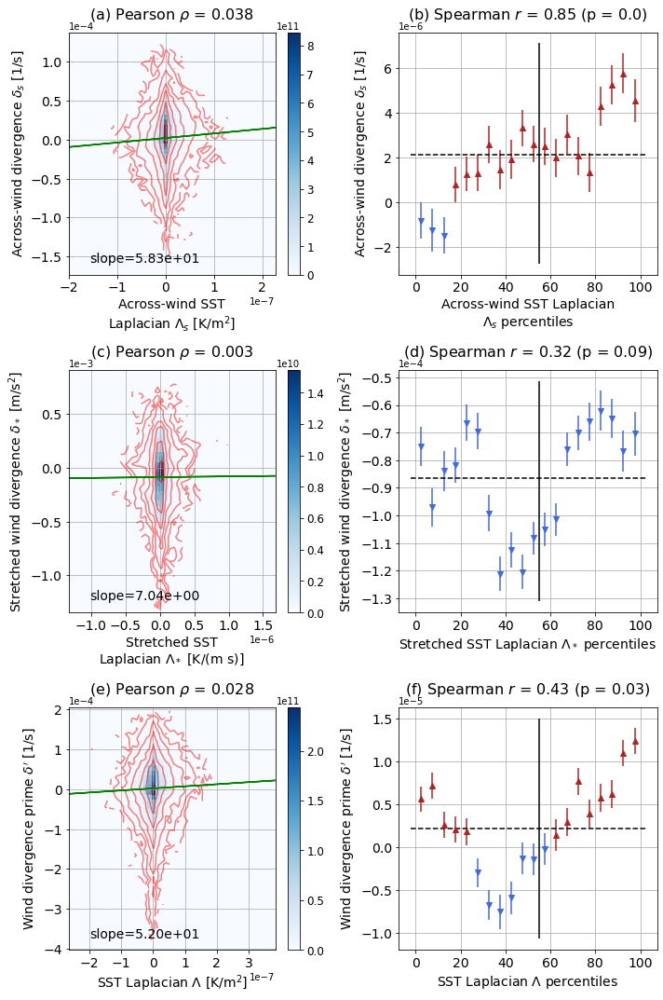

In [59]:
##### MANUSCRIPT FIGURE
##### With experiment = 'FS_CONST' and str_instant = '2014-10-06T01:00:00' this is figure 5 of the manuscript.

fig = plt.figure(figsize=(10,15))

gs = GridSpec(3, 2, figure=fig)

ax1 = fig.add_subplot(321)#gs[0, 0])
x = d2sst_ds2*coastal_mask
y = ds_dot_prime_ds*coastal_mask
xstr = 'Across-wind SST\nLaplacian $\Lambda_s$ [K/m$^2$]'
ystr = 'Across-wind divergence $\delta_s$ [1/s]'
plot_2d_distr_manuscript(ax1,x,y,xstr,ystr,'a')

ax2 = fig.add_subplot(322)#gs[0, 1])
perc_step = 5
xstr = 'Across-wind SST Laplacian\n$\Lambda_s$ percentiles'
plot_perc_distr_manuscript(ax2,x,y,perc_step,xstr,ystr,'b')
    
ax3 = fig.add_subplot(323)#gs[1, 0])
x = stretched_lapl*coastal_mask
y = stretched_div*coastal_mask
xstr = 'Stretched SST\nLaplacian $\Lambda_*$ [K/(m s)]'
ystr = 'Stretched wind divergence $\delta_*$ [m/s$^2$]'
plot_2d_distr_manuscript(ax3,x,y,xstr,ystr,'c')

ax4 = fig.add_subplot(324)#gs[1, 1])
perc_step = 5
xstr = 'Stretched SST Laplacian $\Lambda_*$ percentiles'
plot_perc_distr_manuscript(ax4,x,y,perc_step,xstr,ystr,'d')

ax5 = fig.add_subplot(325)#gs[2, 0])
x = lapl_sst*coastal_mask
y = div_prime*coastal_mask
xstr = 'SST Laplacian $\Lambda$ [K/m$^2$]'
ystr = 'Wind divergence prime $\delta\'$ [1/s]'
plot_2d_distr_manuscript(ax5,x,y,xstr,ystr,'e')

ax6 = fig.add_subplot(326)#gs[2, 1])
perc_step = 5
xstr = 'SST Laplacian $\Lambda$ percentiles'
plot_perc_distr_manuscript(ax6,x,y,perc_step,xstr,ystr,'f')
    
plt.tight_layout()   
    
figure_name = 'fig5.pdf' #'fig5_' + str_instant + '_' + experiment + '.png'
plt.savefig(figure_name,bbox_inches='tight',dpi=300)

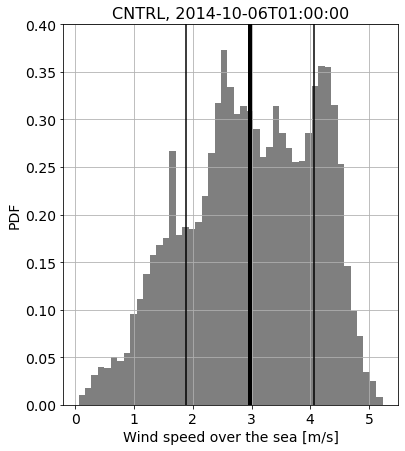

In [41]:
##### MANUSCRIPT FIGURE
# Check the histogram of the wind speed at this instant.

field = ws_grd*coastal_mask

fig = plt.figure(figsize=(6., 7.))
_ = plt.hist(field[~np.isnan(field)], bins='auto', density='True', alpha=0.5, color='k')
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylabel('PDF', fontsize=14)
plt.xlabel('Wind speed over the sea [m/s]', fontsize=14)
#plt.yscale('log')
#plt.xscale('log')
plt.ylim([0, 0.4])
#plt.ticklabel_format(axis="both", style="sci", scilimits=(0,0))
plt.title('CNTRL, '+str_instant, fontsize=16)
plt.grid()

media = np.nanmean(field)
dev_standard = np.nanstd(field)
plt.plot(media*np.array([1, 1]), np.array([0, 0.4]),'k',linewidth=4)
plt.plot((media+dev_standard)*np.array([1, 1]), np.array([0, 0.4]),'k')
plt.plot((media-dev_standard)*np.array([1, 1]), np.array([0, 0.4]),'k')

figure_name = 'fig4.pdf'#'histogram_ws_' + str_instant + '_' + experiment +'.png'
plt.savefig(figure_name,bbox_inches='tight',dpi=300)

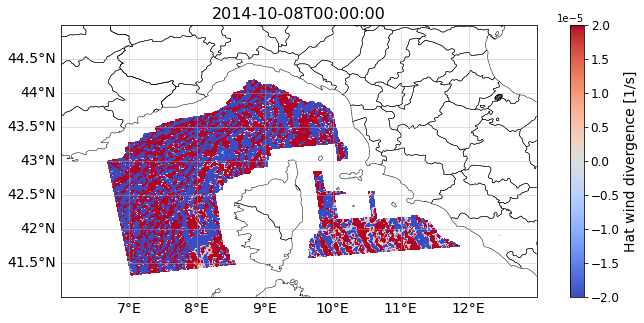

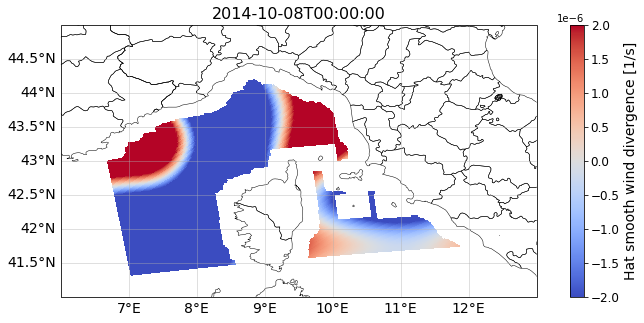

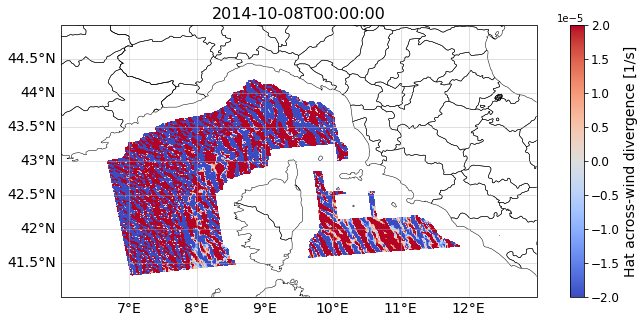

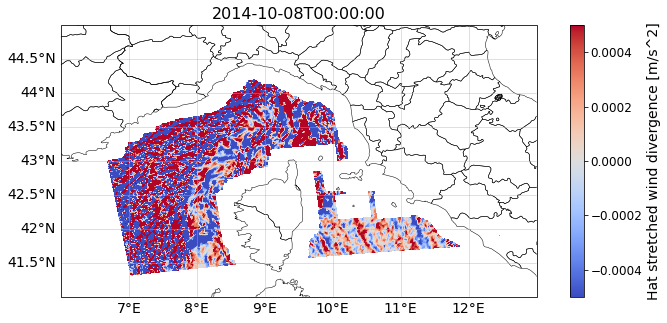

In [39]:
# Hat variables (with the UNIF wind removed)

fig = plt.figure(figsize=(12., 5.))
ax = fig.add_subplot(1, 1, 1, projection=crs)
plot_background(ax)
pc = ax.pcolor(llon,llat,hat_div*coastal_mask,shading='nearest',cmap='coolwarm',vmin=-2e-5,vmax=2e-5)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
cbar.set_label('Hat wind divergence [1/s]',size=14)
plt.title(str_instant, fontsize=16)

figure_name = 'map_hat_div_' + str_instant + '_' + experiment + '_sigma_' + str(sigma) + '.png'
plt.savefig(figure_name,bbox_inches='tight')

fig = plt.figure(figsize=(12., 5.))
ax = fig.add_subplot(1, 1, 1, projection=crs)
plot_background(ax)
pc = ax.pcolor(llon,llat,hat_smooth_div*coastal_mask,shading='nearest',cmap='coolwarm',vmin=-2e-6,vmax=2e-6)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
cbar.set_label('Hat smooth wind divergence [1/s]',size=14)
plt.title(str_instant, fontsize=16)

figure_name = 'map_hat_smooth_div_' + str_instant + '_' + experiment + '_sigma_' + str(sigma) + '.png'
plt.savefig(figure_name,bbox_inches='tight')

fig = plt.figure(figsize=(12., 5.))
ax = fig.add_subplot(1, 1, 1, projection=crs)
plot_background(ax)
pc = ax.pcolor(llon,llat,hat_ds_dot_ds*coastal_mask,shading='nearest',cmap='coolwarm',vmin=-2e-5,vmax=2e-5)#vmin=-2e-4,vmax=2e-4)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
cbar.set_label('Hat across-wind divergence [1/s]',size=14)
plt.title(str_instant, fontsize=16)

figure_name = 'map_hat_ds_dot_ds_' + str_instant + '_' + experiment + '_sigma_' + str(sigma) + '.png'
plt.savefig(figure_name,bbox_inches='tight')

fig = plt.figure(figsize=(12., 5.))
ax = fig.add_subplot(1, 1, 1, projection=crs)
plot_background(ax)
pc = ax.pcolor(llon,llat,hat_stretched_div*coastal_mask,shading='nearest',cmap='coolwarm',vmin=-5e-4,vmax=5e-4)#vmin=-2e-3,vmax=2e-3)
cbar = plt.colorbar(pc)
cbar.ax.tick_params(labelsize=12) 
cbar.set_label('Hat stretched wind divergence [m/s^2]',size=14)
plt.title(str_instant, fontsize=16)

figure_name = 'map_hat_stretched_div_' + str_instant + '_' + experiment + '_sigma_' + str(sigma) + '.png'
plt.savefig(figure_name,bbox_inches='tight')

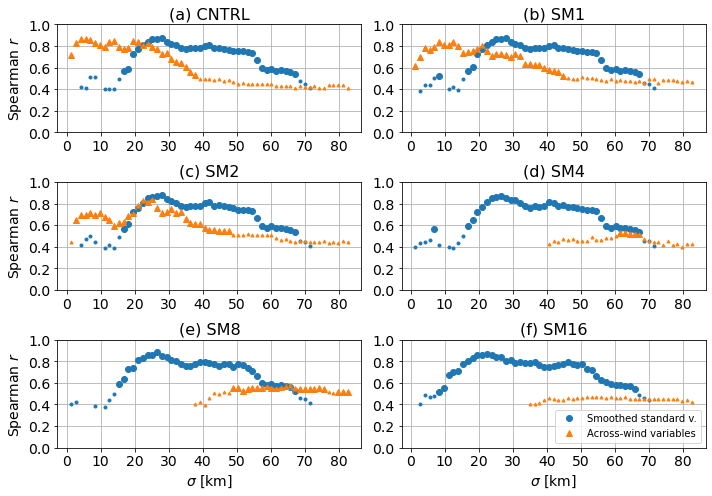

In [48]:
##### MANUSCRIPT FIGURE
# Plot the Sr of all the experiments, for the smooth and the across variables only.

experiment_list = ['FS_CONST','SM1_K','SM2_K','SM4_K','SM8_K','SM16_K']#,'SM32_K','SM64_K']
str_instant = '2014-10-06T01:00:00'
label_list = ['(a) CNTRL', '(b) SM1', '(c) SM2', '(d) SM4', '(e) SM8', '(f) SM16']#, '(g) SM32', '(h) SM64']

fig = plt.figure(figsize=(10,7))
#fig = plt.figure(figsize=(10,6))

#gs = GridSpec(4, 2, figure=fig)
gs = GridSpec(3, 2, figure=fig)

axid=0

for experiment in experiment_list:
    ndf = pd.read_csv('sr_vs_sigma_' + experiment + '_' + str_instant)
    
#    ax = fig.add_subplot(4,2,axid+1)
    ax = fig.add_subplot(3,2,axid+1)
    ax.plot(ndf.sigma[ndf.pval_sigma_smooth<0.01],ndf.sr_sigma_smooth[ndf.pval_sigma_smooth<0.01],
            'o',c='C0',markersize=6)
    ax.plot(ndf.sigma[ndf.pval_sigma_across<0.01],ndf.sr_sigma_across[ndf.pval_sigma_across<0.01],
            '^',c='C1',markersize=6)
#    ax.plot(ndf.sigma[ndf.pval_sigma_prime<0.01],ndf.sr_sigma_prime[ndf.pval_sigma_prime<0.01],
#            '*',c='C2',markersize=6)
    ax.plot(ndf.sigma[ndf.pval_sigma_smooth<0.05],ndf.sr_sigma_smooth[ndf.pval_sigma_smooth<0.05],
            'o',c='C0',markersize=3)
    ax.plot(ndf.sigma[ndf.pval_sigma_across<0.05],ndf.sr_sigma_across[ndf.pval_sigma_across<0.05],
            '^',c='C1',markersize=3)
#    ax.plot(ndf.sigma[ndf.pval_sigma_prime<0.05],ndf.sr_sigma_prime[ndf.pval_sigma_prime<0.05],
#            '*',c='C2',markersize=3)
    ax.set_title(label_list[axid], fontsize=16)
    ax.set_ylim(0,1)
#    if axid>5:
    if axid>3:
        plt.xlabel('$\\sigma$ [km]',fontsize=14)
    if axid%2==0:
        plt.ylabel('Spearman $r$',fontsize=14)
#    if axid==7:
    if axid==5:
#        plt.legend(['Standard','Across','Prime'])
        plt.legend(['Smoothed standard v.','Across-wind variables'])
        
    ax.grid()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    
    plt.tight_layout()
    
    axid += 1
    
figure_name = 'fig8.pdf'# 'fig_sigma_no32-64_' + str_instant
plt.savefig(figure_name,bbox_inches='tight',dpi=300)

/mnt/storage_unimib/agostino/genoa2014/ANML_DOUBLE/


<ipython-input-27-35f68c39a183>:8: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


LinregressResult(slope=-0.012380514197234741, intercept=0.00016886288252649252, rvalue=-0.9282699027483104, pvalue=0.0, stderr=2.907569834251244e-05, intercept_stderr=5.2310186539851375e-05)
/mnt/storage_unimib/agostino/genoa2014/FS_CONST/
LinregressResult(slope=-0.013248785643686535, intercept=0.000962778542539794, rvalue=-0.9403394944408159, pvalue=0.0, stderr=2.8099904464017035e-05, intercept_stderr=2.527731624790474e-05)


<ipython-input-27-35f68c39a183>:8: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


/mnt/storage_unimib/agostino/genoa2014/ANML_HALF/


<ipython-input-27-35f68c39a183>:8: RuntimeWarning: divide by zero encountered in log
  cn = plt.contour(0.5*(xedges[:-1]+xedges[1:]), 0.5*(yedges[:-1]+yedges[1:]), np.log(H.T), colors='r',


LinregressResult(slope=-0.013519603246273956, intercept=0.0006937295032193086, rvalue=-0.9384403487987008, pvalue=0.0, stderr=2.9171763943021668e-05, intercept_stderr=1.3120756131392421e-05)


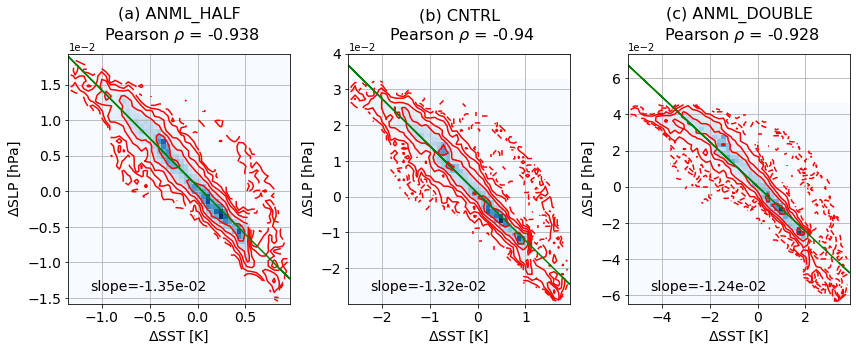

In [32]:
##### MANUSCRIPT FIGURE
# This is to plot the 2d distribution of DeltaSLP and DeltaSST as a function of the strength of the gradients
# (i.e. for the experiments ANML_HALF, FS_CONST and ANML_DOUBLE).

experiment_list = ['ANML_DOUBLE','FS_CONST','ANML_HALF']
letter = ['c','b','a']
experiment_label = [' ANML_DOUBLE\n',' CNTRL\n',' ANML_HALF\n']

fig = plt.figure(figsize=(12,5))

axid = 0
for experiment in experiment_list:
    path2EXP = '/mnt/storage_unimib/agostino/genoa2014/' + experiment + '/'
    print(path2EXP)

    # Read SLP and SST to calculate their difference wrt the UNIF simulation.
    str_instant = '2014-10-06T01:00:00'
    instant = np.datetime64(str_instant)

    YYYY = pd.to_datetime(instant).year
    MM = pd.to_datetime(instant).month
    DD = pd.to_datetime(instant).day
    HH = pd.to_datetime(instant).hour

    filename = path2EXP + 'wrfout_d01_' + str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00'
    filenameU = path2UNIF + 'wrfout_d01_' + str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00'

    ds = xr.open_dataset(filename)
    dsU = xr.open_dataset(filenameU)

    # Read surface pressure, 2m air temperature and SST.
    p = ds.PSFC[0].values
    pU = dsU.PSFC[0].values
    delta_p = (p-pU)*seamask_nan/100 #[hPa]
    delta_p[delta_p<-1] = np.nan

    sst = ds.SST[0].values
    sstU = dsU.SST[0].values
    delta_sst = (sst - sstU)*seamask_nan
    # There are few outliers: remove them.
    delta_sst[delta_sst<-6] = np.nan

    ax = fig.add_subplot(1,3,3-axid)
    
    x = delta_sst*coastal_mask
    y = delta_p*coastal_mask
    xstr = '$\Delta$SST [K]'
    ystr = '$\Delta$SLP [hPa]'
    plot_2d_distr_manuscript(ax,x,y,xstr,ystr,letter[axid],experiment_label[axid])
    # Here we want the lines and the equations of the least square fit.
    
#    if experiment=='ANML_DOUBLE':
#        xlimiti = ax.get_xlim()
#        ylimiti = ax.get_ylim()
#        print(ylimiti)
    
#    ax.set_xlim(xlimiti)
#    ax.set_ylim(ylimiti)

    axid +=1
    
# Change the extent of the x and y axis according to the largest one (from the ANML_DOUBLE case)

plt.tight_layout()   

figure_name = 'fig6_' + str_instant + '_with_slope.png'
plt.savefig(figure_name,bbox_inches='tight',dpi=300)

/mnt/storage_unimib/agostino/genoa2014/ANML_DOUBLE/


<ipython-input-3-49619acc8e96>:22: RuntimeWarning: divide by zero encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-3-49619acc8e96>:22: RuntimeWarning: invalid value encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-2-bb09044d123a>:36: RuntimeWarning: invalid value encountered in subtract
  div_a = field_a-field_a
<ipython-input-2-bb09044d123a>:37: RuntimeWarning: invalid value encountered in subtract
  div_a[:,1:-1] = (field_a[:,2:]-field_a[:,:-2])/(R*costheta[:,1:-1]*(llon[:,2:]-llon[:,:-2])*np.pi/180)
<ipython-input-2-bb09044d123a>:38: RuntimeWarning: invalid value encountered in subtract
  div_a[:,0] = (field_a[:,1]-field_a[:,0])/(R*costheta[:,0]*(llon[:,1]-llon[:,0])*np.pi/180)
<ipython-input-2-bb09044d123a>:39: RuntimeWarning: invalid value encountered in subtract
  div_a[:,-1] =

LinregressResult(slope=162.70039438086022, intercept=2.1373893330678404e-06, rvalue=0.07139493593936222, pvalue=3.2989406684914936e-34, stderr=13.32424581501783, intercept_stderr=4.5925724233376576e-07)
x-variable is negative until
0 percentile
5 percentile
10 percentile
15 percentile
20 percentile
25 percentile
30 percentile
35 percentile
40 percentile
45 percentile
50 percentile
55 percentile
(-1.4788100164841302e-05, 2.921242884140174e-05)
/mnt/storage_unimib/agostino/genoa2014/FS_CONST/


<ipython-input-3-49619acc8e96>:22: RuntimeWarning: divide by zero encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-3-49619acc8e96>:22: RuntimeWarning: invalid value encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-2-bb09044d123a>:36: RuntimeWarning: invalid value encountered in subtract
  div_a = field_a-field_a
<ipython-input-2-bb09044d123a>:37: RuntimeWarning: invalid value encountered in subtract
  div_a[:,1:-1] = (field_a[:,2:]-field_a[:,:-2])/(R*costheta[:,1:-1]*(llon[:,2:]-llon[:,:-2])*np.pi/180)
<ipython-input-2-bb09044d123a>:38: RuntimeWarning: invalid value encountered in subtract
  div_a[:,0] = (field_a[:,1]-field_a[:,0])/(R*costheta[:,0]*(llon[:,1]-llon[:,0])*np.pi/180)
<ipython-input-2-bb09044d123a>:39: RuntimeWarning: invalid value encountered in subtract
  div_a[:,-1] =

LinregressResult(slope=52.005754219369216, intercept=2.2220749406196474e-06, rvalue=0.02792052017017289, pvalue=1.8977631550941781e-06, stderr=10.91414376278546, intercept_stderr=3.7618636255431564e-07)
x-variable is negative until
0 percentile
5 percentile
10 percentile
15 percentile
20 percentile
25 percentile
30 percentile
35 percentile
40 percentile
45 percentile
50 percentile
55 percentile
/mnt/storage_unimib/agostino/genoa2014/ANML_HALF/


<ipython-input-3-49619acc8e96>:22: RuntimeWarning: divide by zero encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-3-49619acc8e96>:22: RuntimeWarning: invalid value encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-2-bb09044d123a>:36: RuntimeWarning: invalid value encountered in subtract
  div_a = field_a-field_a
<ipython-input-2-bb09044d123a>:37: RuntimeWarning: invalid value encountered in subtract
  div_a[:,1:-1] = (field_a[:,2:]-field_a[:,:-2])/(R*costheta[:,1:-1]*(llon[:,2:]-llon[:,:-2])*np.pi/180)
<ipython-input-2-bb09044d123a>:38: RuntimeWarning: invalid value encountered in subtract
  div_a[:,0] = (field_a[:,1]-field_a[:,0])/(R*costheta[:,0]*(llon[:,1]-llon[:,0])*np.pi/180)
<ipython-input-2-bb09044d123a>:39: RuntimeWarning: invalid value encountered in subtract
  div_a[:,-1] =

LinregressResult(slope=23.554997208694427, intercept=2.24878884436842e-06, rvalue=0.013106487436432092, pvalue=0.025352338601739334, stderr=10.53393313136001, intercept_stderr=3.6308134419015254e-07)
x-variable is negative until
0 percentile
5 percentile
10 percentile
15 percentile
20 percentile
25 percentile
30 percentile
35 percentile
40 percentile
45 percentile
50 percentile
55 percentile


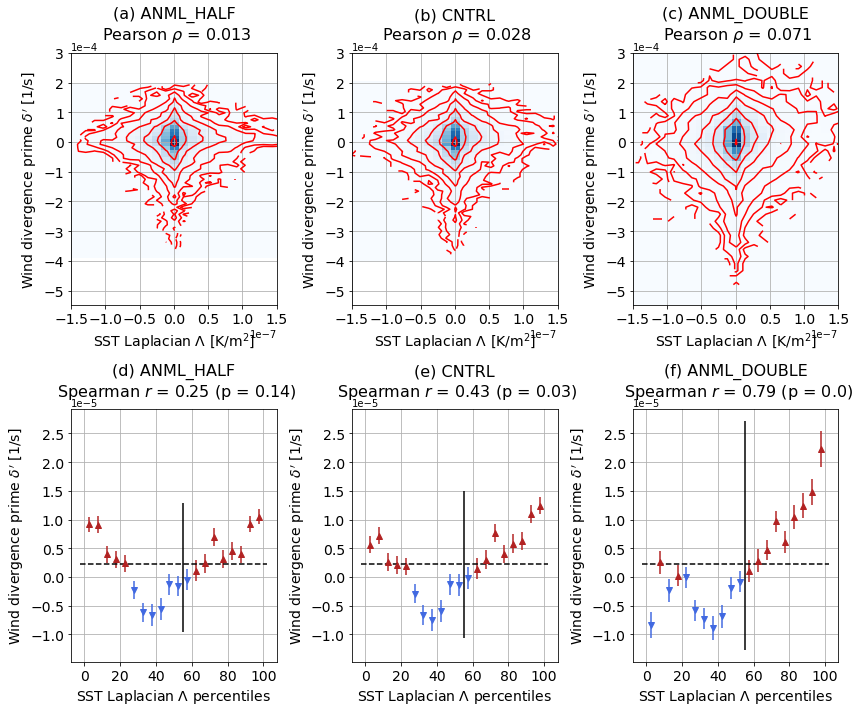

In [21]:
##### MANUSCRIPT FIGURE
# This is to plot the percentile distributions of wind div and SST Lapl or the corresponding across-wind variables
# for different strengths of the gradients (i.e. for the experiments ANML_HALF, FS_CONST and ANML_DOUBLE).
# This produces both figS2 and figS3 (the old fig 7 and 8).

experiment_list = ['ANML_DOUBLE','FS_CONST','ANML_HALF']
#letter = ['c','b','a']
letter = ['c','b','a','f','e','d']
experiment_label = [' ANML_DOUBLE\n',' CNTRL\n',' ANML_HALF\n']
perc_step = 5

#fig = plt.figure(figsize=(12,5))
fig = plt.figure(figsize=(12,10))

axid = 0
for experiment in experiment_list:
    path2EXP = '/mnt/storage_unimib/agostino/genoa2014/' + experiment + '/'
    print(path2EXP)

    # Read SLP and SST to calculate their difference wrt the UNIF simulation.
    str_instant = '2014-10-06T01:00:00'
    instant = np.datetime64(str_instant)

    YYYY = pd.to_datetime(instant).year
    MM = pd.to_datetime(instant).month
    DD = pd.to_datetime(instant).day
    HH = pd.to_datetime(instant).hour

    filename = path2EXP + 'wrfout_d01_' + str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00'
    ds = xr.open_dataset(filename)

    # Read the surface wind components.
    u10_grd = ds.U10[0].values
    v10_grd = ds.V10[0].values
    ws_grd = np.sqrt(u10_grd**2+v10_grd**2)
    # Rotate the wind to the true Earth coordinates.
    cosalpha = ds.COSALPHA[0].values
    sinalpha = ds.COSALPHA[0].values
    u10 = u10_grd*cosalpha - v10_grd*sinalpha
    v10 = u10_grd*sinalpha + v10_grd*cosalpha
    # Define the background wind field and the primed wind anomalies.
    sigma = 10#30
    smooth_u = nan_gaussian_filter(u10*seamask_nan, sigma=sigma)
    smooth_v = nan_gaussian_filter(v10*seamask_nan, sigma=sigma)
    smooth_ws = np.sqrt(smooth_u**2+smooth_v**2)
    u_prime = u10-smooth_u
    v_prime = v10-smooth_v

    # Define the new variables of interest.
    div = div_sphere(u10,v10,llon,llat)
    div_prime = div_sphere(u_prime,v_prime,llon,llat)
    #stretched_div = stretched_div_sphere(u10,v10,llon,llat,smooth_u,smooth_v)
    #stretched_div_prime = stretched_div_sphere(u_prime,v_prime,llon,llat,smooth_u,smooth_v)

    dsst_dx, dsst_dy = grad_sphere(sst,llon,llat)
    lapl_sst = div_sphere(dsst_dx,dsst_dy,llon,llat)
    #stretched_lapl = stretched_div_sphere(dsst_dx,dsst_dy,llon,llat,smooth_u,smooth_v)

    cosphi = smooth_u/smooth_ws
    sinphi = smooth_v/smooth_ws

    s_dot_prime = -u_prime*sinphi + v_prime*cosphi
    ds_dot_prime_dx, ds_dot_prime_dy = grad_sphere(s_dot_prime,llon,llat)
    ds_dot_prime_ds = -ds_dot_prime_dx*sinphi + ds_dot_prime_dy*cosphi

    dsst_dx, dsst_dy = grad_sphere(sst,llon,llat)
    dsst_ds = -dsst_dx*sinphi + dsst_dy*cosphi
    ddsst_ds_dx, ddsst_ds_dy = grad_sphere(dsst_ds,llon,llat)
    d2sst_ds2 = -ddsst_ds_dx*sinphi + ddsst_ds_dy*cosphi

    ##### CHOOSE THE VARIABLES HERE #####
    x = lapl_sst*coastal_mask; y = div*coastal_mask
    xstr1 = 'SST Laplacian $\Lambda$ [K/m$^2$]'
    xstr2 = 'SST Laplacian $\Lambda$ percentiles'
    ystr = 'Wind divergence $\delta$ [1/s]'
    num_fig = 7
    xlimiti_2dd = [-1.5e-7, 1.5e-7]
    ylimiti_2dd = [-5.5e-4, 3e-4]

    #x = d2sst_ds2*coastal_mask; y = ds_dot_prime_ds*coastal_mask
    #xstr1 = 'Across-wind SST Laplacian $\Lambda_s$ [K/m$^2$]'
    #xstr2 = 'Across-wind SST Laplacian $\Lambda_s$ percentiles'
    #ystr = 'Across-wind divergence $\delta_s$ [1/s]'   
    #num_fig = 8
    #xlimiti_2dd = [-1e-7, 1e-7]
    #ylimiti_2dd = [-1.8e-4, 1.8e-4]

    x = lapl_sst*coastal_mask; y = div_prime*coastal_mask
    xstr1 = 'SST Laplacian $\Lambda$ [K/m$^2$]'
    xstr2 = 'SST Laplacian $\Lambda$ percentiles'
    ystr = 'Wind divergence prime $\delta\'$ [1/s]'
    num_fig = 999
    xlimiti_2dd = [-1.5e-7, 1.5e-7]
    ylimiti_2dd = [-5.5e-4, 3e-4]

    ##### ----- #####
    
    # Plot the figure.
    #ax = fig.add_subplot(1,3,3-axid)
    ax = fig.add_subplot(2,3,3-axid)
    plot_2d_distr_manuscript(ax,x,y,xstr1,ystr,letter[axid],experiment_label[axid])
    ax.set_xlim(xlimiti_2dd)
    ax.set_ylim(ylimiti_2dd)
    
    ax = fig.add_subplot(2,3,6-axid)
    plot_perc_distr_manuscript(ax,x,y,perc_step,xstr2,ystr,letter[axid+3],experiment_label[axid])
    
    if experiment=='ANML_DOUBLE':
        xlimiti = ax.get_xlim()
        ylimiti = ax.get_ylim()
        print(ylimiti)
    
    ax.set_xlim(xlimiti)
    ax.set_ylim(ylimiti)

    axid +=1
    
# Change the extent of the x and y axis according to the largest one (from the ANML_DOUBLE case)

plt.tight_layout()   

figure_name = 'fig' + str(num_fig) +'_' + str_instant
#plt.savefig(figure_name,bbox_inches='tight')

/mnt/storage_unimib/agostino/genoa2014/ANML_DOUBLE/
x-variable is negative until
0 percentile
5 percentile
10 percentile
15 percentile
20 percentile
25 percentile
30 percentile
35 percentile
40 percentile
45 percentile
50 percentile
55 percentile


<ipython-input-3-49619acc8e96>:22: RuntimeWarning: divide by zero encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-3-49619acc8e96>:22: RuntimeWarning: invalid value encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-2-bb09044d123a>:36: RuntimeWarning: invalid value encountered in subtract
  div_a = field_a-field_a
<ipython-input-2-bb09044d123a>:37: RuntimeWarning: invalid value encountered in subtract
  div_a[:,1:-1] = (field_a[:,2:]-field_a[:,:-2])/(R*costheta[:,1:-1]*(llon[:,2:]-llon[:,:-2])*np.pi/180)
<ipython-input-2-bb09044d123a>:38: RuntimeWarning: invalid value encountered in subtract
  div_a[:,0] = (field_a[:,1]-field_a[:,0])/(R*costheta[:,0]*(llon[:,1]-llon[:,0])*np.pi/180)
<ipython-input-2-bb09044d123a>:39: RuntimeWarning: invalid value encountered in subtract
  div_a[:,-1] =

/mnt/storage_unimib/agostino/genoa2014/ANML_HALF/
x-variable is negative until
0 percentile
5 percentile
10 percentile
15 percentile
20 percentile
25 percentile
30 percentile
35 percentile
40 percentile
45 percentile
50 percentile
55 percentile


<ipython-input-3-49619acc8e96>:22: RuntimeWarning: divide by zero encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-3-49619acc8e96>:22: RuntimeWarning: invalid value encountered in true_divide
  zz = ff/(ww*weight) # This rescale for the actual weights used in the filter and set to NaN where the field
<ipython-input-2-bb09044d123a>:36: RuntimeWarning: invalid value encountered in subtract
  div_a = field_a-field_a
<ipython-input-2-bb09044d123a>:37: RuntimeWarning: invalid value encountered in subtract
  div_a[:,1:-1] = (field_a[:,2:]-field_a[:,:-2])/(R*costheta[:,1:-1]*(llon[:,2:]-llon[:,:-2])*np.pi/180)
<ipython-input-2-bb09044d123a>:38: RuntimeWarning: invalid value encountered in subtract
  div_a[:,0] = (field_a[:,1]-field_a[:,0])/(R*costheta[:,0]*(llon[:,1]-llon[:,0])*np.pi/180)
<ipython-input-2-bb09044d123a>:39: RuntimeWarning: invalid value encountered in subtract
  div_a[:,-1] =

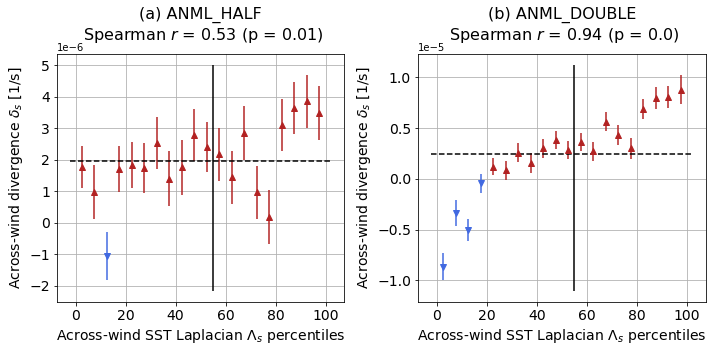

In [47]:
##### MANUSCRIPT FIGURE
# This is to plot the percentile distributions of wind div and SST Lapl or the corresponding across-wind variables
# for different strengths of the gradients (i.e. for the experiments ANML_HALF and ANML_DOUBLE).

experiment_list = ['ANML_DOUBLE','ANML_HALF']
letter = ['b','a']
experiment_label = [' ANML_DOUBLE\n',' ANML_HALF\n']
perc_step = 5

fig = plt.figure(figsize=(10,5))

axid = 0
for experiment in experiment_list:
    path2EXP = '/mnt/storage_unimib/agostino/genoa2014/' + experiment + '/'
    print(path2EXP)

    # Read SLP and SST to calculate their difference wrt the UNIF simulation.
    str_instant = '2014-10-06T01:00:00'
    instant = np.datetime64(str_instant)

    YYYY = pd.to_datetime(instant).year
    MM = pd.to_datetime(instant).month
    DD = pd.to_datetime(instant).day
    HH = pd.to_datetime(instant).hour

    filename = path2EXP + 'wrfout_d01_' + str(YYYY) +'-'+ str(MM).zfill(2) +'-'+ str(DD).zfill(2) +'_'+ str(HH).zfill(2) +':00:00'
    ds = xr.open_dataset(filename)

    # Read the surface wind components.
    u10_grd = ds.U10[0].values
    v10_grd = ds.V10[0].values
    ws_grd = np.sqrt(u10_grd**2+v10_grd**2)
    # Rotate the wind to the true Earth coordinates.
    cosalpha = ds.COSALPHA[0].values
    sinalpha = ds.COSALPHA[0].values
    u10 = u10_grd*cosalpha - v10_grd*sinalpha
    v10 = u10_grd*sinalpha + v10_grd*cosalpha
    # Define the background wind field and the primed wind anomalies.
    sigma = 10#30
    smooth_u = nan_gaussian_filter(u10*seamask_nan, sigma=sigma)
    smooth_v = nan_gaussian_filter(v10*seamask_nan, sigma=sigma)
    smooth_ws = np.sqrt(smooth_u**2+smooth_v**2)
    u_prime = u10-smooth_u
    v_prime = v10-smooth_v

    # Define the new variables of interest.
    div = div_sphere(u10,v10,llon,llat)
    div_prime = div_sphere(u_prime,v_prime,llon,llat)
    #stretched_div = stretched_div_sphere(u10,v10,llon,llat,smooth_u,smooth_v)
    #stretched_div_prime = stretched_div_sphere(u_prime,v_prime,llon,llat,smooth_u,smooth_v)

    dsst_dx, dsst_dy = grad_sphere(sst,llon,llat)
    lapl_sst = div_sphere(dsst_dx,dsst_dy,llon,llat)
    #stretched_lapl = stretched_div_sphere(dsst_dx,dsst_dy,llon,llat,smooth_u,smooth_v)

    cosphi = smooth_u/smooth_ws
    sinphi = smooth_v/smooth_ws

    s_dot_prime = -u_prime*sinphi + v_prime*cosphi
    ds_dot_prime_dx, ds_dot_prime_dy = grad_sphere(s_dot_prime,llon,llat)
    ds_dot_prime_ds = -ds_dot_prime_dx*sinphi + ds_dot_prime_dy*cosphi

    dsst_dx, dsst_dy = grad_sphere(sst,llon,llat)
    dsst_ds = -dsst_dx*sinphi + dsst_dy*cosphi
    ddsst_ds_dx, ddsst_ds_dy = grad_sphere(dsst_ds,llon,llat)
    d2sst_ds2 = -ddsst_ds_dx*sinphi + ddsst_ds_dy*cosphi

    ##### CHOOSE THE VARIABLES HERE #####
    x = d2sst_ds2*coastal_mask; y = ds_dot_prime_ds*coastal_mask
    xstr1 = 'Across-wind SST Laplacian $\Lambda_s$ [K/m$^2$]'
    xstr2 = 'Across-wind SST Laplacian $\Lambda_s$ percentiles'
    ystr = 'Across-wind divergence $\delta_s$ [1/s]'   
    num_fig = 7
    ##### ----- #####
    
    # Plot the figure.
    ax = fig.add_subplot(1,2,2-axid)
    plot_perc_distr_manuscript(ax,x,y,perc_step,xstr2,ystr,letter[axid],experiment_label[axid])
    
#    if experiment=='ANML_DOUBLE':
#        xlimiti = ax.get_xlim()
#        ylimiti = ax.get_ylim()
#        print(ylimiti)   
#    ax.set_xlim(xlimiti)
#    ax.set_ylim(ylimiti)

    axid +=1
    
# Change the extent of the x and y axis according to the largest one (from the ANML_DOUBLE case)

plt.tight_layout()   

figure_name = 'fig7.pdf'#'fig' + str(num_fig) +'_updated_' + str_instant
plt.savefig(figure_name,bbox_inches='tight',dpi=300)